#### Problem Statement
##### FlipItNews aims to simplify finance, business, and investment news for millennials using AI/ML-driven content discovery. Our goal is to categorize news articles into Politics, Technology, Sports, Business, and Entertainment using NLP-based multi-class classification.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from datetime import datetime,timedelta
import warnings
warnings.filterwarnings('ignore')
from collections import Counter
import time
import re
import pickle
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.ensemble import BaggingClassifier, GradientBoostingClassifier, RandomForestClassifier
import xgboost as xgb
from itertools import product
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error,accuracy_score,confusion_matrix,classification_report,ndcg_score
from sklearn.metrics import roc_auc_score,roc_curve,auc, precision_score, recall_score, precision_recall_curve
from copy import deepcopy
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from lime.lime_tabular import LimeTabularExplainer
import shap
import wordninja 
from beautifultable import BeautifulTable
from scipy import stats
import itertools
from IPython.display import display

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

import re
import string
import unicodedata
import pandas as pd
import contractions
from collections import Counter
from spellchecker import SpellChecker
from bs4 import BeautifulSoup
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
import spacy
from wordsegment import load, segment
from wordcloud import WordCloud


nlp = spacy.load("en_core_web_sm")
nltk.download("punkt")
nltk.download("stopwords")
nltk.download("wordnet")
nltk.download('averaged_perceptron_tagger')
load()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\91720\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [55]:
data=pd.read_csv('flipitnews-data.csv')

In [56]:
data.head(2)

Category  \
0  Technology   
1    Business   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

In [57]:
len(data)

2225

In [58]:


import plotly.express as px
category_counts = data['Category'].value_counts().reset_index()
category_counts.columns = ['Category', 'Count']

# Create the bar plot with dynamic blue color scaling
fig = px.bar(category_counts, 
             x='Category', 
             y='Count', 
             color='Count', 
             text='Count', 
             color_continuous_scale='Blues')

# Update layout
fig.update_traces(textposition='outside', textfont=dict(size=12))  # Move labels on top of bars
fig.update_layout(title_text='Distribution Plot column: Category',
                  xaxis_title='Value',
                  yaxis_title='Frequency',
                  template='plotly_white',
                  xaxis=dict(showgrid=False),  
                  yaxis=dict(showgrid=False),
                  coloraxis_showscale=False)  # Hide color scale legend

# Show the figure
fig.show()

display(data.Category.value_counts())



Sports           511
Business         510
Politics         417
Technology       401
Entertainment    386
Name: Category, dtype: int64

#### Dataset is balanced

In [59]:
#pip install wordsegment

In [60]:
#pip install pyspellchecker

In [61]:
#pip install textblob

In [62]:
#pip install wordninja

In [63]:
#pip install wordcloud

In [64]:
special_chars = r"!\"#$%&\'()*+,-/:;<=>?@[\\]^_`{|}~"
escaped_chars = re.escape(special_chars)

class TextPreprocessor:
    def __init__(self, common_threshold=1000, rare_threshold=1):
        self.lemmatizer = WordNetLemmatizer()
        self.spell = SpellChecker()
        self.stop_words = set(stopwords.words("english"))
        self.vocab = Counter()
        self.common_words = set()
        self.rare_words = set()
        self.common_threshold = common_threshold  # absolute count
        self.rare_threshold = rare_threshold  # Absolute count

    def clean_text(self, text):
        """Preprocess text - remove HTML, punctuations, special characters, etc."""
        if not isinstance(text, str):
            return ""

        text = text.lower()
        text = BeautifulSoup(text, "html.parser").get_text()  # Remove HTML tags
        text = re.sub(r"https?://\S+|www\.\S+", "", text)  # Remove URLs
        text = contractions.fix(text)  # Expand contractions
        text = re.sub(r"@[A-Za-z0-9_]+", "", text)  # Remove mentions
        text = re.sub(r"#\S+", "", text)  # Remove hashtags
        text = re.sub(r"\bRT\b", "", text)  # Remove RT
        text = re.sub(r"\S+@\S+", "", text)  # Remove emails
        text = re.sub(r"[0-9]+", "", text)  # Remove numeric vals
        text = self.remove_dots(text)
        text = re.sub(rf"[{escaped_chars}]", "", text)  # Remove punctuation
        text = ''.join(c for c in text if not unicodedata.combining(c))  # Remove accented chars
        text = re.sub(r"\s+", " ", text).strip()  # Remove multiple spaces
        
        tokens = word_tokenize(text)
        tokens = [wordninja.split(word) for word in tokens]   ## breaks any concatenated words like "lookabout" to "look" and "about"
        tokens = [subword for word in tokens for subword in word] 
        
        pos_tags = pos_tag(tokens)
        non_nouns=[]
        for word,tag in pos_tags:     ## only spellcheck non noun words
            if not tag.startswith("NN"):
                non_nouns.append(word)
            
        tokens = [self.spell.correction(word) if (word not in self.spell.known([word])) and\
                  (word in non_nouns) and (self.spell.correction(word) is not None) else word for word in tokens]
        
        return " ".join(tokens)
    
    
    def remove_dots(self, text):
        return re.sub(r'\b([A-Z])(?:\.(?=[A-Z]))+\b', lambda m: m.group(0).replace(".", ""), text)
    def tokenize_and_lemmatize(self, text):
        """Tokenize, spell correct, and lemmatize text."""
        tokens = word_tokenize(text)
        
        tokens = [self.lemmatizer.lemmatize(word) for word in tokens]
        return tokens

    def build_vocab(self, texts):
        """Build vocabulary from a list of tokenized texts."""
        for tokens in texts:
            self.vocab.update(tokens)

        # Identify common words (occurring in more than common_threshold)
        total_docs = len(texts)
        self.common_words = {word for word, count in self.vocab.items() if count > self.common_threshold}

        # Identify rare words (appearing less than rare_threshold times)
        self.rare_words = {word for word, count in self.vocab.items() if count < self.rare_threshold}

    def replace_common_rare(self, tokens):
        """Replace common words with <COMMON> and rare words with <UNK>."""
        return [word for word in tokens if word not in self.rare_words and word not in self.common_words]

    def remove_stopwords(self, tokens):
        """Remove stopwords from tokens."""
        return [word for word in tokens if word not in self.stop_words]

    def preprocess_dataframe(self, df, column="Article"):
        """Preprocess a dataframe column."""
        df = df.copy()
        df[column] = df[column].apply(self.clean_text)
        df["tokens"] = df[column].apply(self.tokenize_and_lemmatize)

        # Build vocab after tokenization
        self.build_vocab(df["tokens"].tolist())

        # Replace common/rare words and remove stopwords
        df["tokens"] = df["tokens"].apply(self.replace_common_rare)
        df["tokens"] = df["tokens"].apply(self.remove_stopwords)

        return df


preprocessor = TextPreprocessor()
data = preprocessor.preprocess_dataframe(data)


In [65]:
def get_noun_phrases_parent(text):
    doc = nlp(text)
    required_nc = []
    
    for chunk in doc.noun_chunks:
        nc_parent = chunk.root.head  # Get parent head word
        new_nc = [token.text for token in chunk if token.pos_ in ["NOUN", "PROPN"]]  # Extract NOUN/PROPN
        
        if new_nc:  # Only add if nouns exist
            new_nc_text = " ".join(new_nc) #+ " -> " + nc_parent.text
            required_nc.append(new_nc_text)
    
    return required_nc


def get_noun_phrases_details(text):
    doc = nlp(text)
    noun_phrases_dep = []  # Stores 'Noun phrase -> dependency type'
    noun_phrases_siblings = []  # Stores 'Noun phrase -> its siblings'
    
    noun_chunks_dict = {}  # Stores noun phrase -> parent head for sibling mapping
    
    # Extract noun phrases, their dependency relations, and parents
    for chunk in doc.noun_chunks:
        np_text = chunk.text
        np_root = chunk.root  # Root word of noun phrase
        np_dep = np_root.dep_  # Dependency type
        np_parent = np_root.head  # Parent of noun phrase root
        
        noun_phrases_dep.append(f"{np_text} -> {np_dep}")
        noun_chunks_dict[np_text] = np_parent  # Store parent for sibling grouping
    
    # Identify noun phrase siblings
    for np, parent in noun_chunks_dict.items():
        siblings = [n for n, p in noun_chunks_dict.items() if p == parent and n != np]  # Find siblings
        if siblings:
            noun_phrases_siblings.append(sorted([np]+list(siblings)))
        else:
            noun_phrases_siblings.append([np])
    
    return noun_phrases_dep, [' '.join(s) for s in noun_phrases_siblings]

In [66]:
data["noun_phrases"] = data["Article"].apply(get_noun_phrases_parent)
data[['noun_phrase_dependency', 'noun_phrase_siblings']] = data['Article'].apply(lambda x: pd.Series(get_noun_phrases_details(x)))



In [67]:
data.head(2)

Category  \
0  Technology   
1    Business   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

### EDA (plotting word clouds)

In [68]:


def get_frequent_tokens(data, col):
    # Group by category and analyze noun phrases
    category_groups = data.groupby('Category')[col].sum()  # Aggregate lists

    results = []  # Store category-wise results

    for category, phrases in category_groups.items():
        phrase_counts = Counter(phrases)  # Count occurrences
        total_phrases = sum(phrase_counts.values())  # Total phrases in this category
        
        # Get top 20 phrases
        top_20 = phrase_counts.most_common(20)

        # Convert for WordCloud input format
        wordcloud_text = " ".join([phrase for phrase, _ in top_20])

        # Plot WordCloud
        plt.figure(figsize=(10, 5))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(wordcloud_text)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"WordCloud for {category}")
        plt.show()

        # Compute document frequency for each phrase
        doc_counts = data[data["Category"] == category][col].apply(lambda x: set(x))  # Convert to sets per document
        doc_freqs = Counter([phrase for doc in doc_counts for phrase in doc])  # Count documents containing each phrase
        total_docs = len(doc_counts)  # Total documents in category

        # Prepare DataFrame
        top_20_df = pd.DataFrame(top_20, columns=['Noun Phrase', 'Count'])
        top_20_df['% of Documents'] = top_20_df['Noun Phrase'].apply(lambda x: (doc_freqs[x] / total_docs) * 100)
        top_20_df['% of Category Phrases'] = top_20_df['Count'].apply(lambda x: (x / total_phrases) * 100)

        # Store results
        results.append((category, top_20_df))

        # Display results
        print(f"Top 20 Noun Phrases for Category: {category}")
        display(top_20_df)
        print("\n" + "="*50 + "\n")
    
    return results  # Return structured results if needed

# Call the function


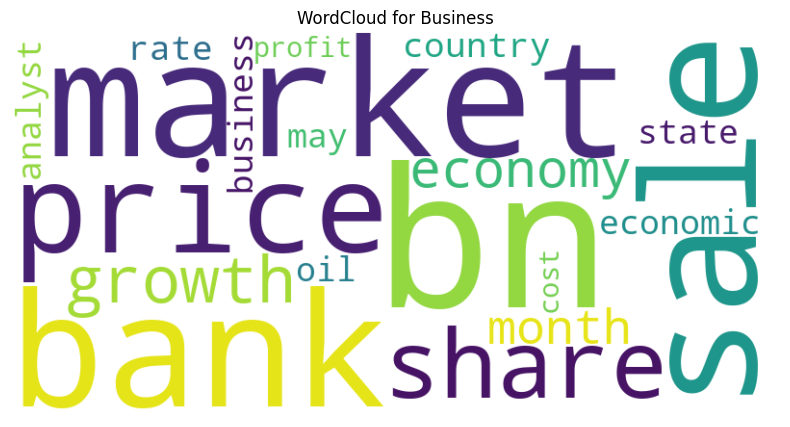

Top 20 Noun Phrases for Category: Business


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,bn,782,48.431373,0.862697
1,market,530,48.627451,0.584692
2,bank,420,28.039216,0.463341
3,sale,416,30.196078,0.458928
4,price,392,30.980392,0.432452
5,share,390,31.960784,0.430245
6,growth,385,33.529412,0.424729
7,economy,383,29.019608,0.422523
8,month,336,41.764706,0.370673
9,country,322,30.588235,0.355228


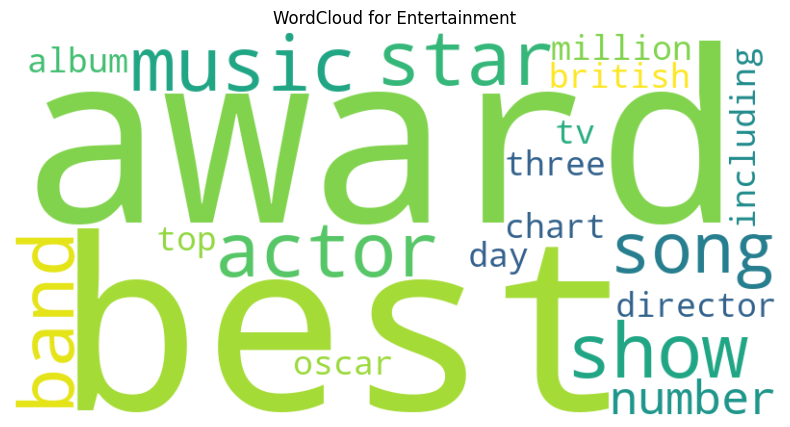

Top 20 Noun Phrases for Category: Entertainment


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,best,602,34.974093,0.884982
1,award,517,39.119171,0.760026
2,music,439,30.310881,0.645360
3,show,413,38.601036,0.607139
4,star,352,47.927461,0.517464
5,actor,252,28.238342,0.370457
6,band,242,18.911917,0.355757
7,song,236,19.948187,0.346936
8,number,235,26.424870,0.345466
9,director,232,30.310881,0.341056


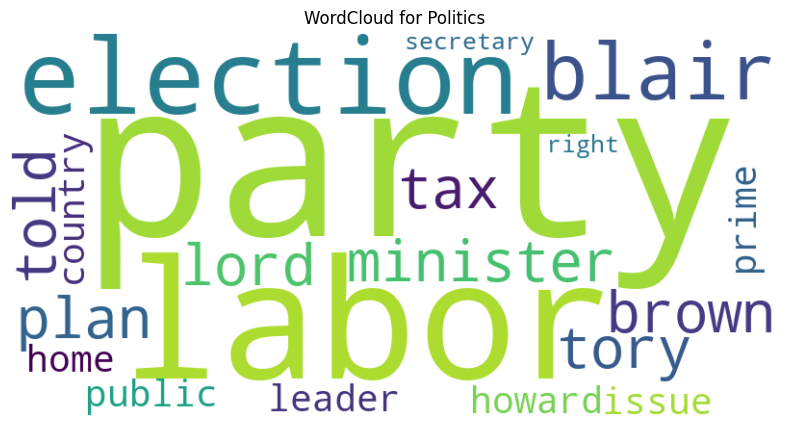

Top 20 Noun Phrases for Category: Politics


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,party,726,51.079137,0.759112
1,labor,713,41.007194,0.745520
2,election,668,46.282974,0.698467
3,blair,581,39.568345,0.607499
4,minister,569,60.191847,0.594952
5,tory,519,44.124700,0.542671
6,plan,409,41.007194,0.427654
7,brown,390,19.904077,0.407788
8,tax,361,19.664269,0.377465
9,lord,360,18.705036,0.376419


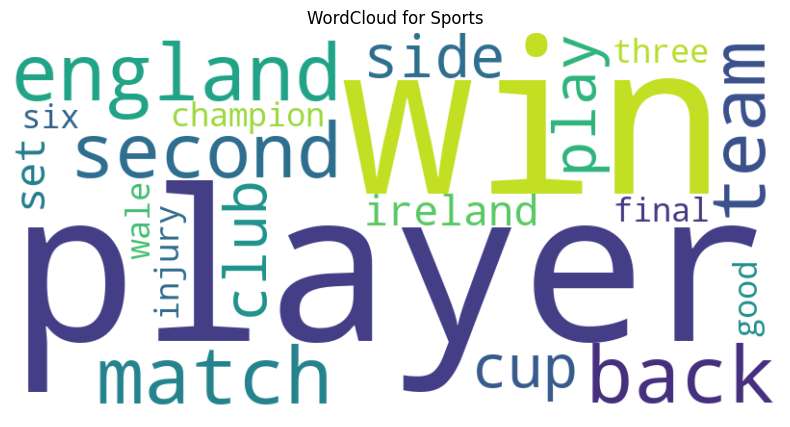

Top 20 Noun Phrases for Category: Sports


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,player,479,45.205479,0.539056
1,win,472,49.706458,0.531179
2,england,461,26.810176,0.518799
3,back,373,42.465753,0.419766
4,match,349,36.594912,0.392757
5,second,338,35.225049,0.380378
6,team,315,34.246575,0.354494
7,side,314,33.855186,0.353369
8,play,312,34.442270,0.351118
9,cup,294,27.984344,0.330861


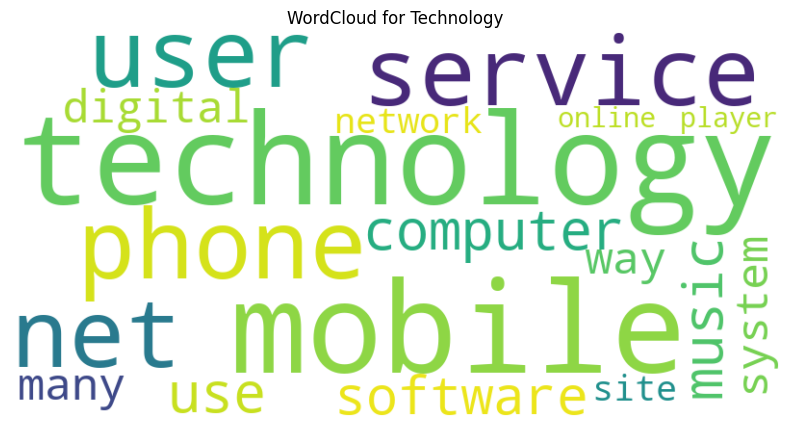

Top 20 Noun Phrases for Category: Technology


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,technology,618,50.623441,0.590049
1,mobile,614,25.187032,0.586230
2,phone,547,25.935162,0.522261
3,service,516,42.144638,0.492663
4,user,476,46.384040,0.454472
5,net,443,35.660848,0.422964
6,computer,426,42.394015,0.406733
7,music,389,28.179551,0.371406
8,use,381,48.628429,0.363768
9,software,374,31.920200,0.357085


In [69]:
results = get_frequent_tokens(data, 'tokens')

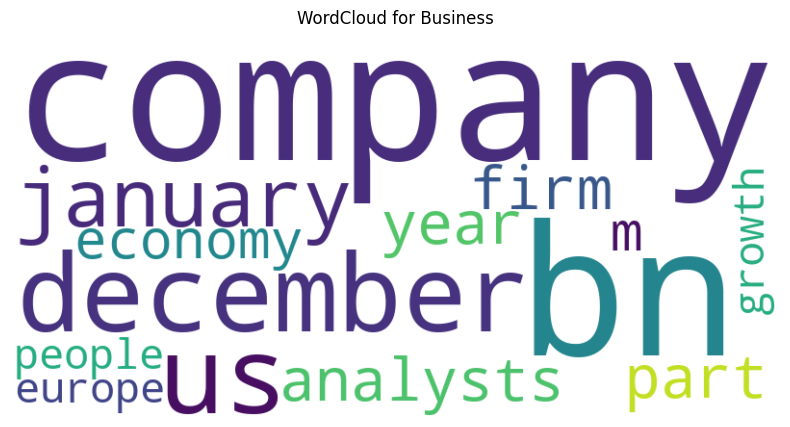

Top 20 Noun Phrases for Category: Business


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,295,57.843137,0.835386
1,he,161,31.568627,0.455923
2,we,136,26.666667,0.385127
3,they,115,22.549020,0.325659
4,the company,115,22.549020,0.325659
5,i,111,21.764706,0.314332
6,bn,111,21.764706,0.314332
7,december,89,17.450980,0.252032
8,the us,86,16.862745,0.243536
9,who,77,15.098039,0.218050


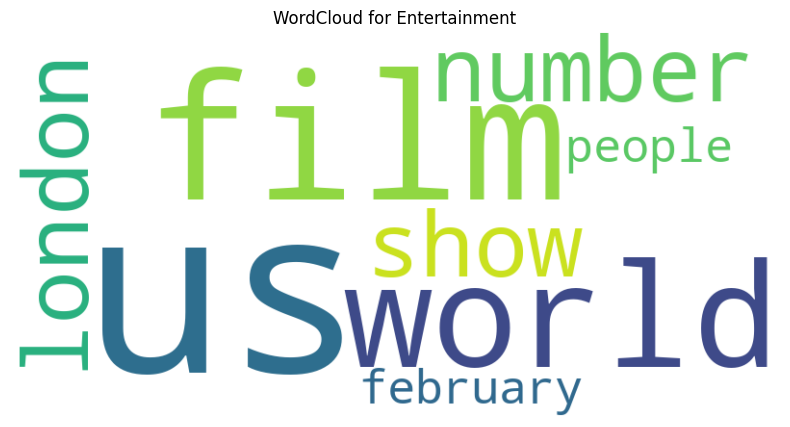

Top 20 Noun Phrases for Category: Entertainment


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,208,53.886010,0.771828
1,he,158,40.932642,0.586293
2,i,136,35.233161,0.504657
3,who,135,34.974093,0.500946
4,they,97,25.129534,0.359939
5,we,95,24.611399,0.352518
6,she,88,22.797927,0.326543
7,you,66,17.098446,0.244907
8,the us,60,15.544041,0.222643
9,the film,59,15.284974,0.218932


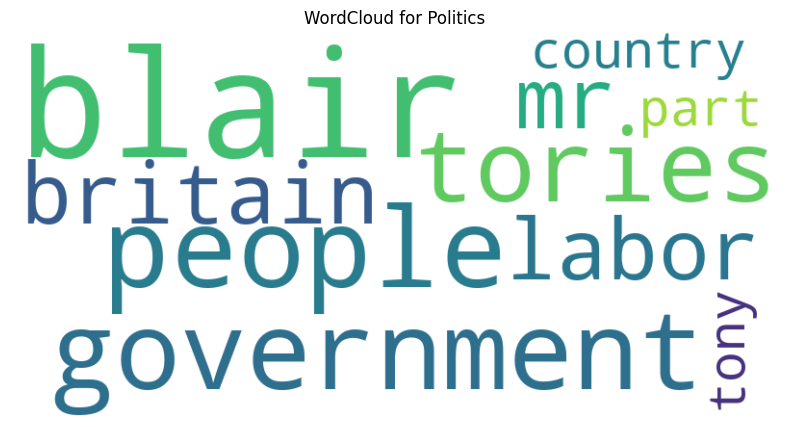

Top 20 Noun Phrases for Category: Politics


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,273,65.467626,0.723658
1,he,265,63.549161,0.702452
2,they,209,50.119904,0.554009
3,i,173,41.486811,0.458582
4,we,170,40.767386,0.450630
5,people,154,36.930456,0.408217
6,who,151,36.211031,0.400265
7,them,116,27.817746,0.307488
8,what,100,23.980815,0.265076
9,the government,98,23.501199,0.259775


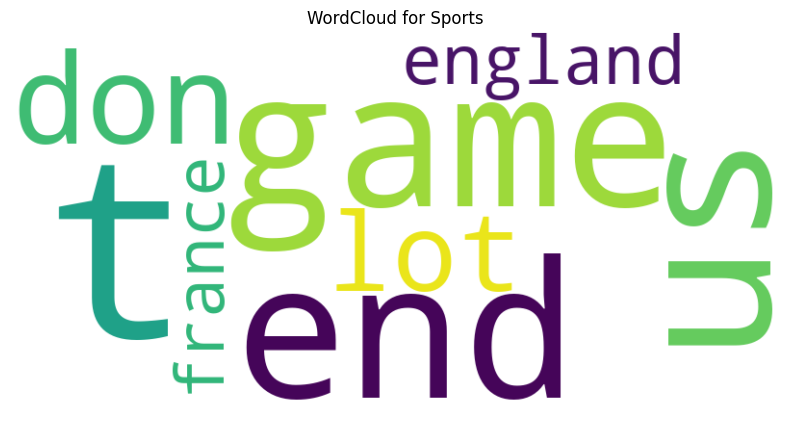

Top 20 Noun Phrases for Category: Sports


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,i,301,58.904110,0.880993
1,he,281,54.990215,0.822455
2,it,234,45.792564,0.684891
3,we,183,35.812133,0.535620
4,they,151,29.549902,0.441960
5,who,149,29.158513,0.436106
6,him,123,24.070450,0.360007
7,you,119,23.287671,0.348299
8,me,107,20.939335,0.313177
9,them,100,19.569472,0.292689


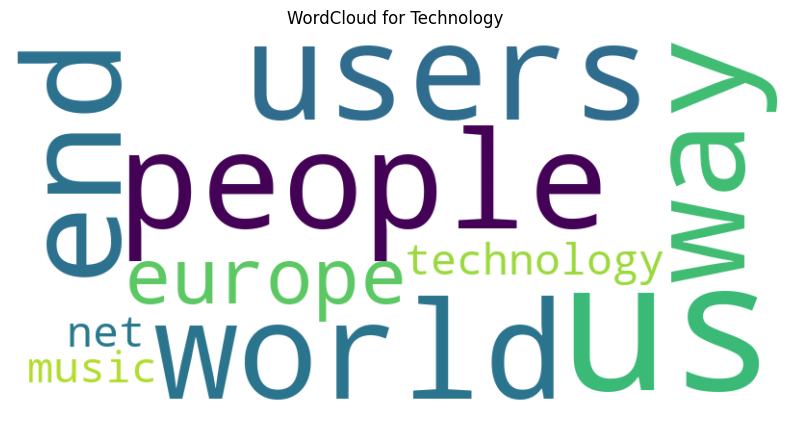

Top 20 Noun Phrases for Category: Technology


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,it,258,64.339152,0.636864
1,he,206,51.371571,0.508504
2,they,180,44.887781,0.444324
3,people,175,43.640898,0.431981
4,them,161,40.149626,0.397423
5,we,140,34.912718,0.345585
6,i,100,24.937656,0.246847
7,what,86,21.446384,0.212288
8,who,84,20.947631,0.207351
9,you,82,20.448878,0.202414


In [70]:
results = get_frequent_tokens(data, 'noun_phrase_siblings')


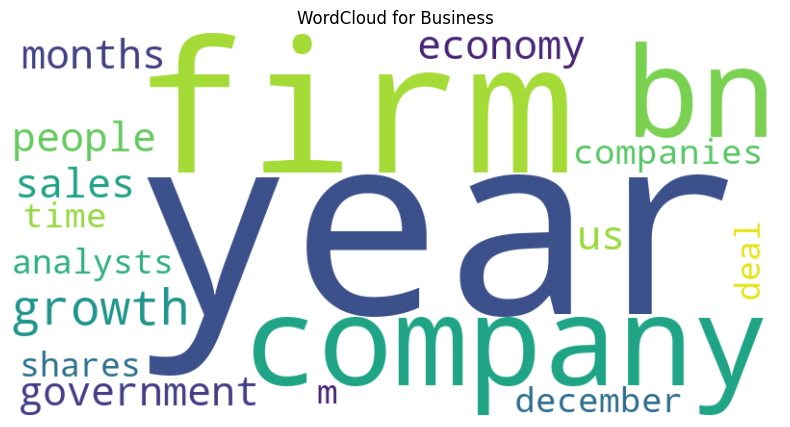

Top 20 Noun Phrases for Category: Business


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,year,278,35.294118,0.734148
1,company,247,31.372549,0.652283
2,bn,235,25.686275,0.620593
3,growth,220,23.725490,0.580981
4,government,204,22.745098,0.538728
5,years,201,30.784314,0.530805
6,economy,200,19.215686,0.528164
7,firm,165,22.156863,0.435736
8,us,163,20.980392,0.430454
9,months,160,24.901961,0.422531


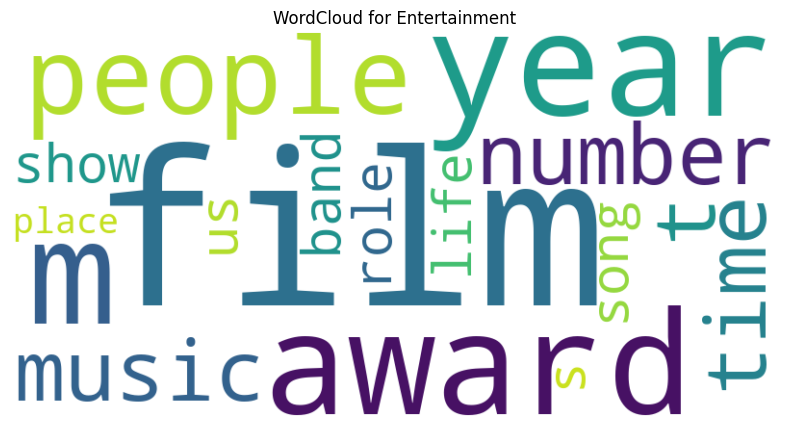

Top 20 Noun Phrases for Category: Entertainment


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,film,330,34.715026,1.199695
1,people,178,25.388601,0.647108
2,years,163,24.093264,0.592576
3,number,160,22.538860,0.581670
4,music,160,13.212435,0.581670
5,films,145,20.984456,0.527139
6,time,137,26.165803,0.498055
7,t,130,16.580311,0.472607
8,show,126,17.875648,0.458065
9,year,125,23.575130,0.454430


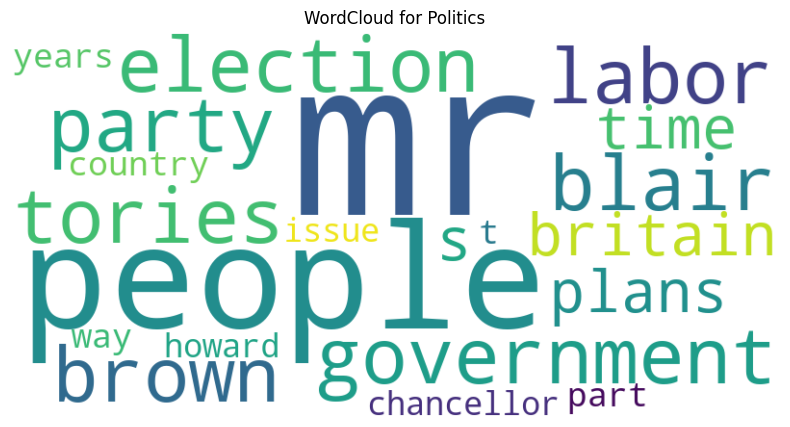

Top 20 Noun Phrases for Category: Politics


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,people,566,57.074341,1.392511
1,government,452,49.640288,1.112041
2,election,332,39.328537,0.816809
3,party,286,29.016787,0.703636
4,mr blair,270,23.980815,0.664272
5,labor,249,27.098321,0.612606
6,tories,215,27.338129,0.528957
7,mr brown,194,13.908873,0.477292
8,britain,183,25.659472,0.450229
9,plans,174,23.261391,0.428086


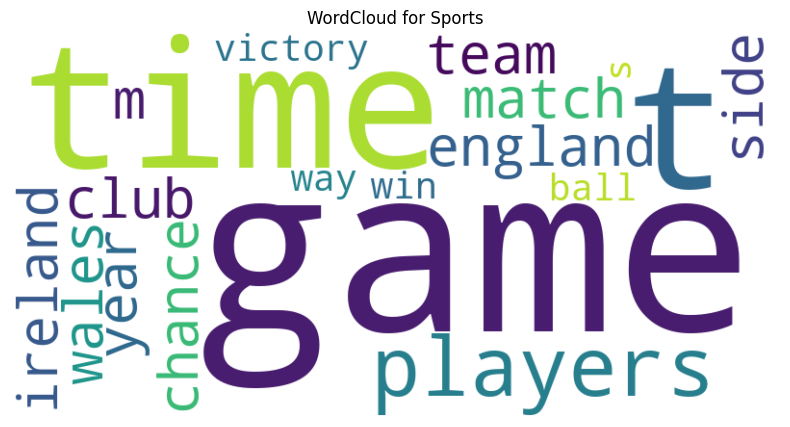

Top 20 Noun Phrases for Category: Sports


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,game,352,37.377691,1.025283
1,t,280,36.203523,0.815566
2,time,258,35.225049,0.751485
3,players,256,29.158513,0.745660
4,england,198,17.612524,0.576721
5,year,165,22.309198,0.480601
6,club,162,15.459883,0.471863
7,team,157,23.287671,0.457299
8,m,155,14.090020,0.451474
9,ireland,139,12.720157,0.404870


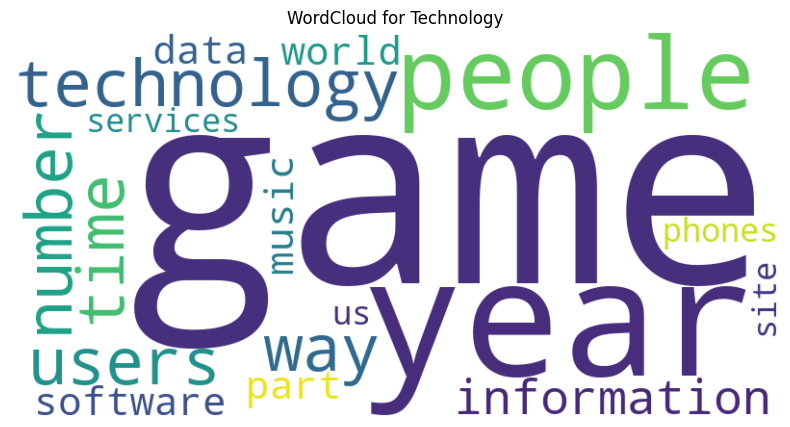

Top 20 Noun Phrases for Category: Technology


,Noun Phrase,Count,% of Documents,% of Category Phrases
0,people,886,71.072319,2.034396
1,technology,269,30.673317,0.617667
2,users,254,30.673317,0.583224
3,way,239,39.900249,0.548782
4,time,238,35.910224,0.546486
5,games,201,14.463840,0.461528
6,number,179,30.922693,0.411012
7,information,179,23.192020,0.411012
8,software,168,20.199501,0.385755
9,world,164,25.436409,0.376570


In [71]:
results = get_frequent_tokens(data, 'noun_phrases')

#### Model Training

In [72]:
def filter_numeric(data,coll):
    enum_coll=list(enumerate(coll))
    cols=data.select_dtypes(include=['number']).columns
    cc=[]
    for col in cols:
        if (data[col].nunique(dropna=True)>2) or\
        ((sorted(list(data[col].dropna().unique()))!=[0,1]) and\
        (sorted(list(data[col].dropna().unique()))!=[0]) and\
        (sorted(list(data[col].dropna().unique()))!=[1])):
            cc.append(col)

    cols=cc
    numeric_cols=list(set(cols).intersection(set(coll)))
    li=[sett[1] for sett in enum_coll if sett[1] in numeric_cols]
    return li

def standardize_data(d,cols,strategy='standard'):
    if strategy=='standard':
        scalar=StandardScaler()
    else:
        scalar=MinMaxScaler()
    data=d.copy()
    cols=filter_numeric(data,cols)
    #print(cols)
    data.loc[:,cols]=pd.DataFrame(scalar.fit_transform(data[cols]),columns=cols,index=data.index)

    return data,scalar,cols

def transform_standardize_data(d,cols,scalar):
    data=d.copy()
    data.loc[:,cols]=pd.DataFrame(scalar.transform(data[cols]),columns=cols,index=data.index)
    return data

def revtransform_standardize_data(d,cols,scalar):
    data=d.copy()
    data.loc[:,cols]=pd.DataFrame(scalar.inverse_transform(data[cols]),columns=cols,index=data.index)
    return data

In [73]:

def train_test(dd,x_cols,y_col,stratify_col=None):
    d=dd.copy()
    d=d.sample(frac=1,random_state=0)
    random_sample_index_map={i:j for i,j in list(enumerate(list(d.index)))}
    d.reset_index(drop=True,inplace=True)
    xtrain,xtest,ytrain,ytest=train_test_split(d.loc[:,x_cols]
                                               ,d.loc[:,y_col]
                                               ,test_size=0.25  #25% TEST_size
                                               ,random_state=0,stratify=stratify_col)
    return xtrain,xtest,ytrain,ytest,random_sample_index_map


def train_vectorizer(train_data, col, method="tfidf", max_features=5000, ngram_range=(1,1)):
    dd=train_data.copy()
    dd[col] = dd[col].apply(lambda x: " ".join(x))
    
    if method == "tfidf":
        vectorizer = TfidfVectorizer(max_features=max_features, ngram_range=ngram_range)
    else:
        vectorizer = CountVectorizer(max_features=max_features, ngram_range=ngram_range)
    
    train_vectors = vectorizer.fit_transform(dd[col])
    
    #print(train_vectors.shape,vectorizer.get_feature_names_out())
    return vectorizer, pd.DataFrame(train_vectors.toarray(),columns=vectorizer.get_feature_names_out())


def transform_test(test_data, col, vectorizer):
    dd=test_data.copy()
    dd[col] = dd[col].apply(lambda x: " ".join(x))
    test_vectors = vectorizer.transform(dd[col])
    return pd.DataFrame(test_vectors.toarray(),columns=vectorizer.get_feature_names_out())



xtrain,xtest,ytrain,ytest,random_sample_index_map=train_test(data,['tokens'],'Category',data['Category'])
xtrain_index_dict={i:random_sample_index_map[j] for i,j in list(enumerate(list(xtrain.index)))}
xtest_index_dict={i:random_sample_index_map[j] for i,j in list(enumerate(list(xtest.index)))}


xtrain.reset_index(drop=True,inplace=True)
xtest.reset_index(drop=True,inplace=True)
ytrain.reset_index(drop=True,inplace=True)
ytest.reset_index(drop=True,inplace=True)

## tf-idf vectorize
vectorizer, xtrain = train_vectorizer(xtrain, col='tokens', method="tfidf", max_features=5000, ngram_range=(1,1))

xtest=transform_test(xtest, col='tokens', vectorizer=vectorizer)

## Standard scale the columns
xtrain,scalar,numeric_cols=standardize_data(xtrain,xtrain.columns)
xtest=transform_standardize_data(xtest,numeric_cols,scalar)


In [74]:
len(xtrain)

1668

In [75]:
target_encode={t:ind for ind,t in enumerate(data['Category'].unique())}
rev_target_encode={ind:t for ind,t in enumerate(data['Category'].unique())}

ytrain=ytrain.map(target_encode)
ytest=ytest.map(target_encode)

In [76]:
def itertool_comb(params,estimator_pkl,key_to_ignore=['regressor','classifier']):
    param_list=[]
    for param in params:
        estimator=[value[0] for key,value in param.items() if key in key_to_ignore]
        keys=[key.split('__')[1] for key,value in param.items() if key not in key_to_ignore]
        values=[value for key,value in param.items() if key not in key_to_ignore]
        values=list(product(*values))
        iter_list=[]
        for i in range(len(values)):
            iter_dict=dict()
            for j in range(len(values[i])):
                iter_dict[keys[j]]=values[i][j]
            iter_list.append([estimator[0],iter_dict])
        for l in iter_list:
            param_list.append(l)

    par_dict={
        'param_grid':param_list,
        'checkpoint_index':0,  ##from param_list
        'best_param_index':None,
        'best_estimator':None,

        'best_val_accuracy':0,
        'best_val_ndcg': 0

        
    }

    pickle.dump(par_dict,open(estimator_pkl,'wb'))

def calculate_ndcg_score(y_true, y_pred_prob, k=10):
    ndcg_scores = []
    
    for i in range(len(y_true)):
        true_index = y_true[i]  # Use integer index directly
        
        # Sort indices by descending predicted probabilities
        sorted_indices = np.argsort(y_pred_prob.iloc[i].values)[::-1]
        
        # Relevance scores: 1 if true class is in the top k, else 0
        relevance_scores = (sorted_indices[:k] == true_index).astype(int)
        
        # Calculate DCG
        dcg = sum(rel / np.log2(j + 2) for j, rel in enumerate(relevance_scores))
        
        # Calculate IDCG (Ideal DCG)
        idcg = 1 / np.log2(2)  # True label at the top is optimal
        
        # Normalize DCG by IDCG to get NDCG
        ndcg = dcg / idcg if idcg > 0 else 0
        ndcg_scores.append(ndcg)
    
    return np.mean(ndcg_scores)

def accuracy_checks(y_true, y_pred_prob):
    
    y_true_labels = y_true.idxmax(axis=1).map({col: idx for idx, col in enumerate(y_true.columns)}).values
    y_pred= y_pred_prob.idxmax(axis=1).map({col: idx for idx, col in enumerate(y_pred_prob.columns)}).values
    
    accuracy = accuracy_score(y_true_labels, y_pred)
    conf_matrix = confusion_matrix(y_true_labels, y_pred)
    
    labels=[rev_target_encode[yy] for yy in y_true.columns]
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
                xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()
    
    # Print classification report
    print('Classification Report:')
    print(classification_report(y_true_labels, y_pred, target_names=labels))
    ndcg_score = calculate_ndcg_score(y_true_labels, y_pred_prob, k=2)
    


    print('Accuracy: {}\nNDCG score with 1st 2 relevant ranks: {}'.format(accuracy,ndcg_score))
    return accuracy,ndcg_score



def training(xtrain,ytrain,estimator_pkl,n_splits=5):

    param_dict=pickle.load(open(estimator_pkl,'rb'))
    param_grid=param_dict['param_grid']
    checkpoint_index=param_dict['checkpoint_index']  ##one already covered
    best_param_index=param_dict['best_param_index']

    best_val_accuracy=param_dict['best_val_accuracy']
    best_val_ndcg=param_dict['best_val_ndcg']
    

    ind=0
    if (checkpoint_index!=0) and (checkpoint_index!=len(param_grid)-1):
        ind=checkpoint_index+1

    while ind<len(param_grid):
        start_time=time.time()
        estimator=param_grid[ind][0]
        parameters=param_grid[ind][1]
        estimator.set_params(**parameters)

        skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
        #smote = SMOTE(random_state=42)

        stratify_col=ytrain.astype(str)


        # Perform Stratified K-Fold Cross-Validation
        fold = 0
        accuracies = []
        ndcgs=[]


        print('Iteration:',ind+1)
        print(str(estimator))
        print('=========================Training in Folds===========================')
        for train_index, test_index in skf.split(xtrain, stratify_col):
            fold += 1
            print('============Fold {}============='.format(fold))
            X_train, X_val = xtrain.iloc[train_index], xtrain.iloc[test_index]
            y_train, y_val = ytrain.iloc[train_index], ytrain.iloc[test_index]
            X_train.reset_index(drop=True,inplace=True)
            X_val.reset_index(drop=True,inplace=True)
            y_train.reset_index(drop=True,inplace=True)
            y_val.reset_index(drop=True,inplace=True)


            X_train_resampled, y_train_resampled = X_train, y_train #smote.fit_resample(X_train, y_train)

            estimator.fit(X_train_resampled,y_train_resampled)
            ypred_train_prob=pd.DataFrame(estimator.predict_proba(X_train_resampled),columns=estimator.classes_)
            ypred_val_prob=pd.DataFrame(estimator.predict_proba(X_val),columns=estimator.classes_)
            
            y_train_encoded = pd.get_dummies(y_train_resampled).astype(int)
            y_test_encoded = pd.get_dummies(y_val).astype(int)
            
            print('==========================Train metrics================================')
            _,_=accuracy_checks(y_train_encoded,ypred_train_prob)
            
            print('==========================Val metrics================================')
            val_accuracy,val_ndcg=accuracy_checks(y_test_encoded,ypred_val_prob)

            accuracies.append(val_accuracy)
            ndcgs.append(val_ndcg)
            



        print('==========================End of Folds================================')
        acc=sum(accuracies)/n_splits
        ndcg=sum(ndcgs)/n_splits
        


        if ndcg>best_val_ndcg:
            param_dict['best_param_index']=ind
            param_dict['best_estimator']=deepcopy(estimator)

            param_dict['best_val_accuracy']=acc
            param_dict['best_val_ndcg']=ndcg
            



        param_dict['checkpoint_index']=ind
        print('========================================================================')
        print('time taken(mins): ',(time.time()-start_time)/60)
        print("param_dict[best_estimator]: ",param_dict['best_estimator'])
        print("param_dict[best_val_accuracy]: ",param_dict['best_val_accuracy'])
        print("param_dict[best_val_ndcg]: ",param_dict['best_val_ndcg'])

        print('========================================================================')

        pickle.dump(param_dict,open(estimator_pkl,'wb'))

        checkpoint_index=param_dict['checkpoint_index']
        best_param_index=param_dict['best_param_index']
        best_val_accuracy=param_dict['best_val_accuracy']
        best_val_ndcg=param_dict['best_val_ndcg']


        ind+=1
        
def find_best_model(estimator_pkl,xtrain,ytrain,xtest,ytest,n_splits,is_first):

    ##creating pickle file first time
    if is_first:
        itertool_comb(param,estimator_pkl)

    training(xtrain,ytrain,estimator_pkl,n_splits)

Iteration: 1
GaussianNB()
=========================Training in Folds===========================
============Fold 1=============
==========================Train metrics================================


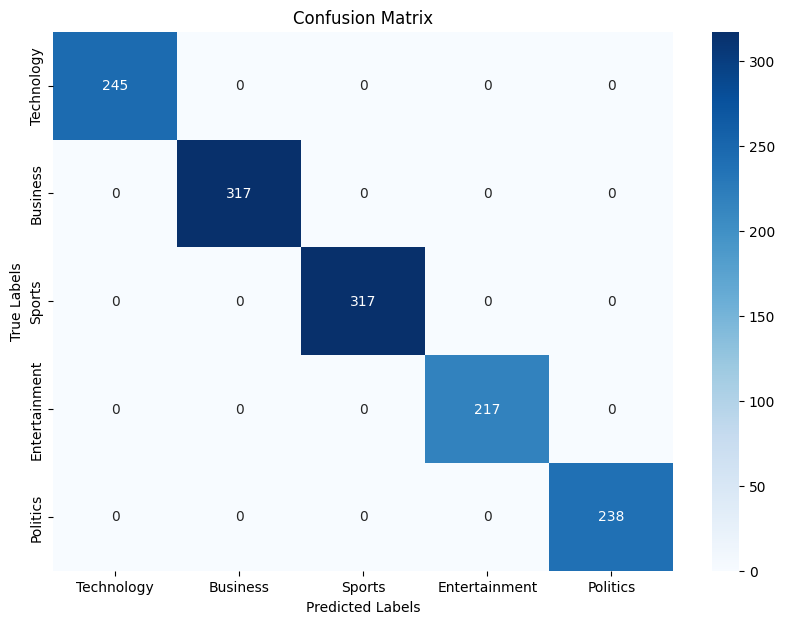

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


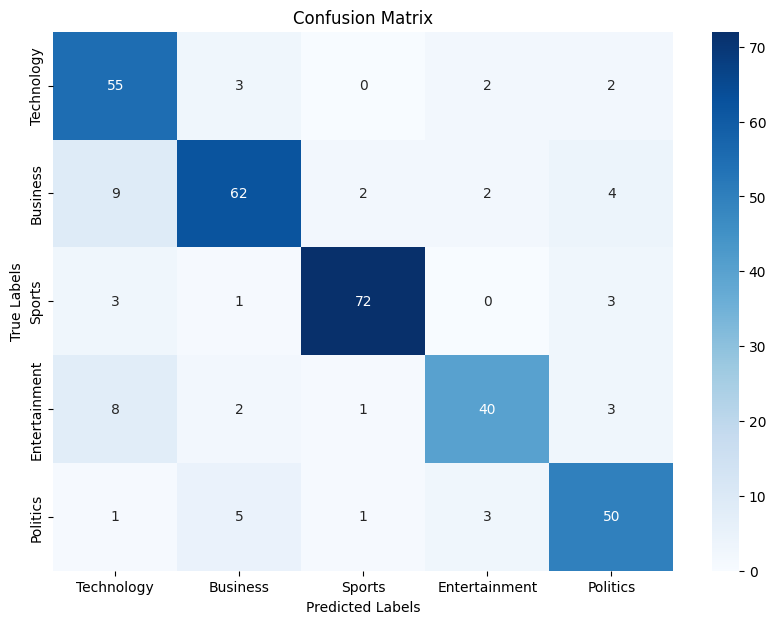

Classification Report:
               precision    recall  f1-score   support

   Technology       0.72      0.89      0.80        62
     Business       0.85      0.78      0.82        79
       Sports       0.95      0.91      0.93        79
Entertainment       0.85      0.74      0.79        54
     Politics       0.81      0.83      0.82        60

     accuracy                           0.84       334
    macro avg       0.84      0.83      0.83       334
 weighted avg       0.84      0.84      0.84       334

Accuracy: 0.8353293413173652
NDCG score with 1st 2 relevant ranks: 0.859886487414458
============Fold 2=============
==========================Train metrics================================


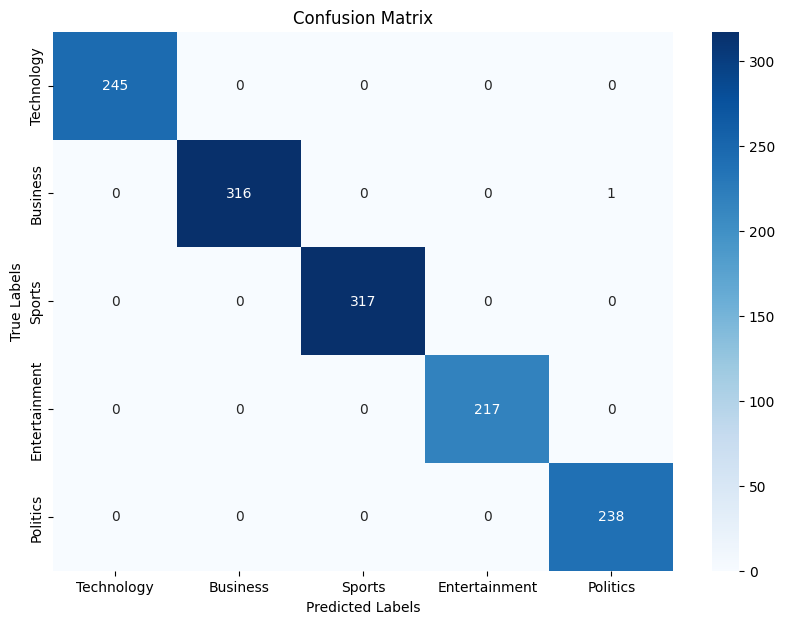

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 0.9992503748125937
NDCG score with 1st 2 relevant ranks: 0.9997233356473548
==========================Val metrics================================


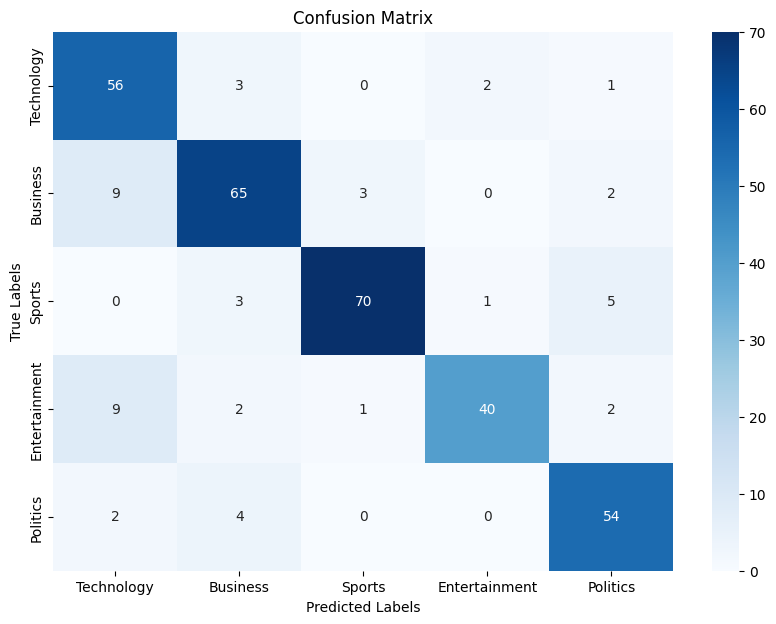

Classification Report:
               precision    recall  f1-score   support

   Technology       0.74      0.90      0.81        62
     Business       0.84      0.82      0.83        79
       Sports       0.95      0.89      0.92        79
Entertainment       0.93      0.74      0.82        54
     Politics       0.84      0.90      0.87        60

     accuracy                           0.85       334
    macro avg       0.86      0.85      0.85       334
 weighted avg       0.86      0.85      0.85       334

Accuracy: 0.8532934131736527
NDCG score with 1st 2 relevant ranks: 0.8684055030795557
============Fold 3=============
==========================Train metrics================================


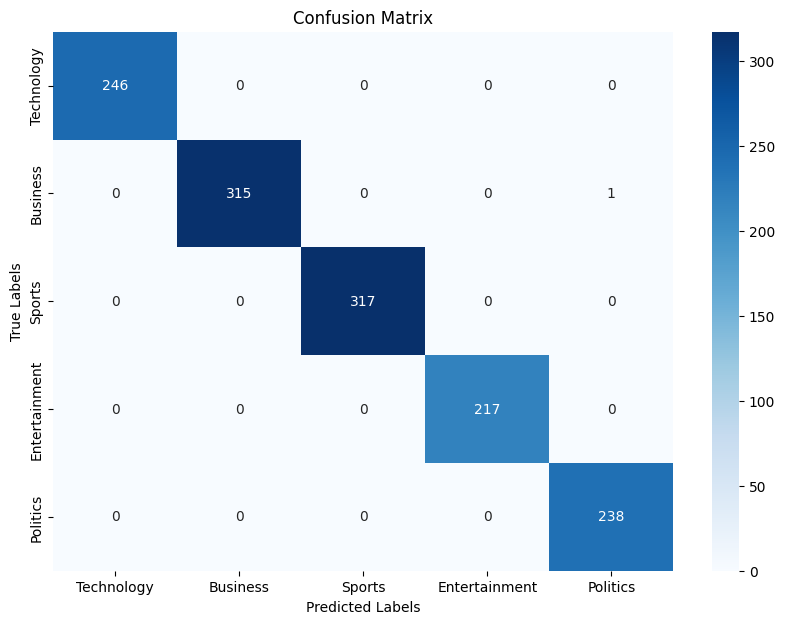

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       316
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 0.9992503748125937
NDCG score with 1st 2 relevant ranks: 0.9997233356473548
==========================Val metrics================================


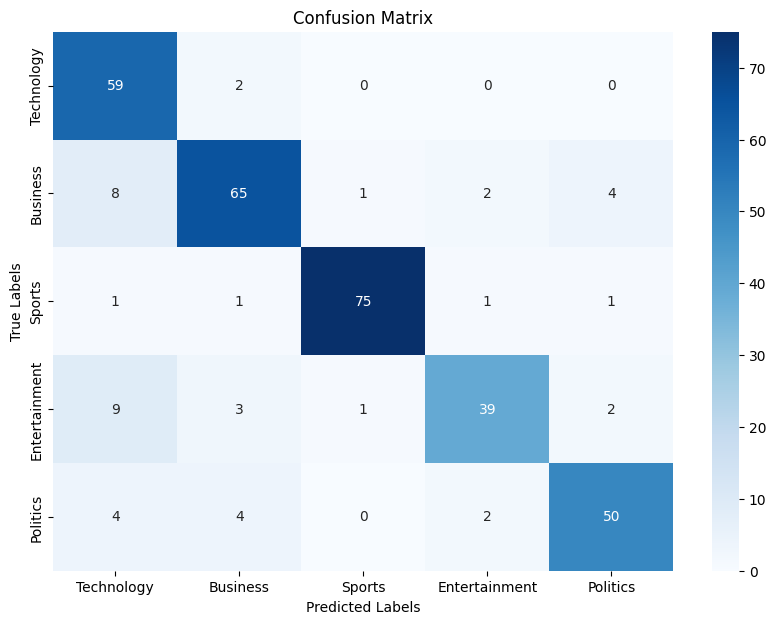

Classification Report:
               precision    recall  f1-score   support

   Technology       0.73      0.97      0.83        61
     Business       0.87      0.81      0.84        80
       Sports       0.97      0.95      0.96        79
Entertainment       0.89      0.72      0.80        54
     Politics       0.88      0.83      0.85        60

     accuracy                           0.86       334
    macro avg       0.87      0.86      0.86       334
 weighted avg       0.87      0.86      0.86       334

Accuracy: 0.8622754491017964
NDCG score with 1st 2 relevant ranks: 0.8849435839606513
============Fold 4=============
==========================Train metrics================================


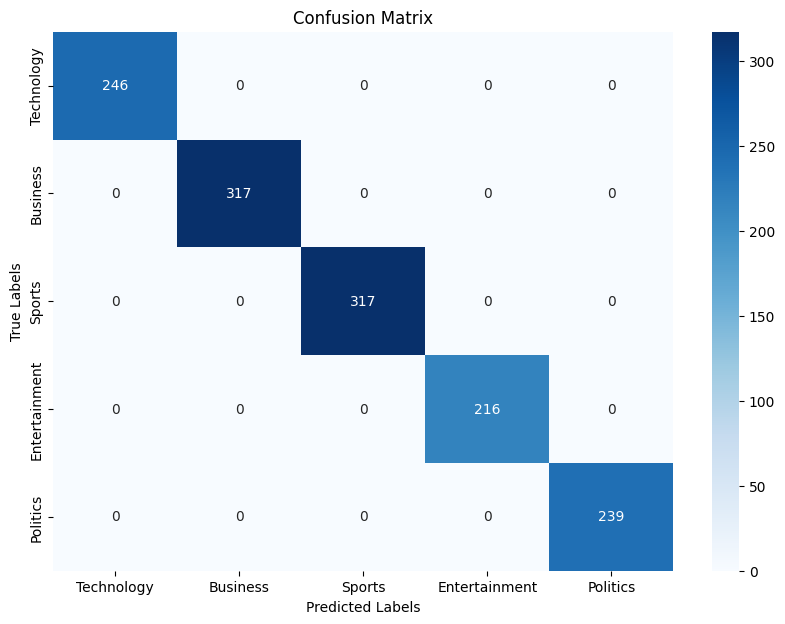

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       216
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


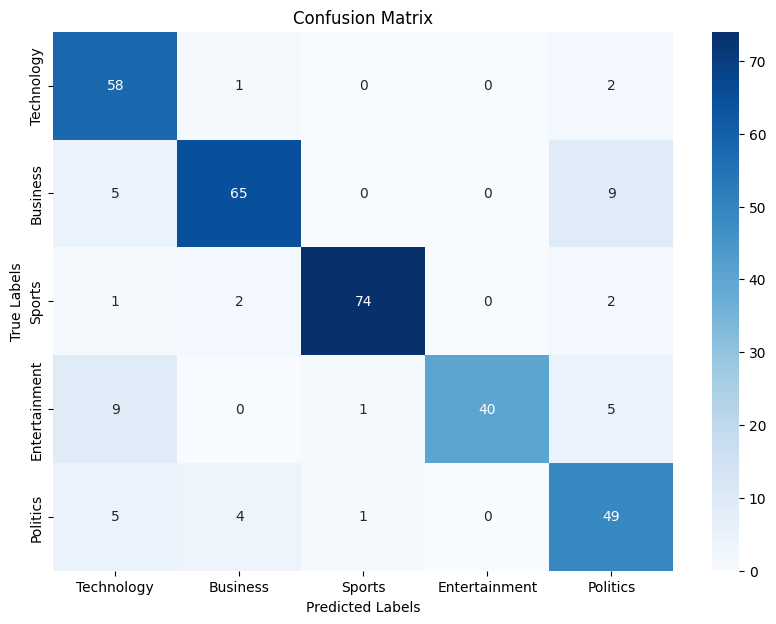

Classification Report:
               precision    recall  f1-score   support

   Technology       0.74      0.95      0.83        61
     Business       0.90      0.82      0.86        79
       Sports       0.97      0.94      0.95        79
Entertainment       1.00      0.73      0.84        55
     Politics       0.73      0.83      0.78        59

     accuracy                           0.86       333
    macro avg       0.87      0.85      0.85       333
 weighted avg       0.88      0.86      0.86       333

Accuracy: 0.8588588588588588
NDCG score with 1st 2 relevant ranks: 0.8872791180287445
============Fold 5=============
==========================Train metrics================================


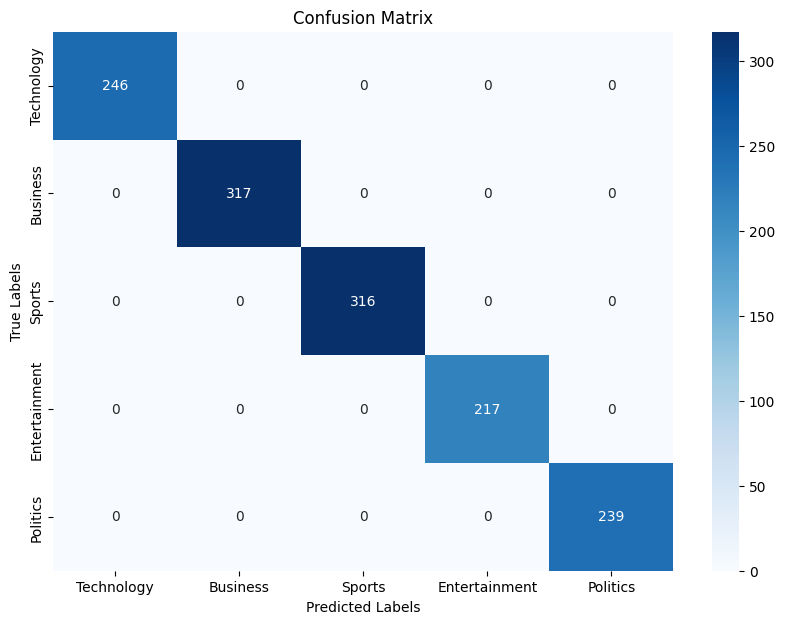

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       316
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


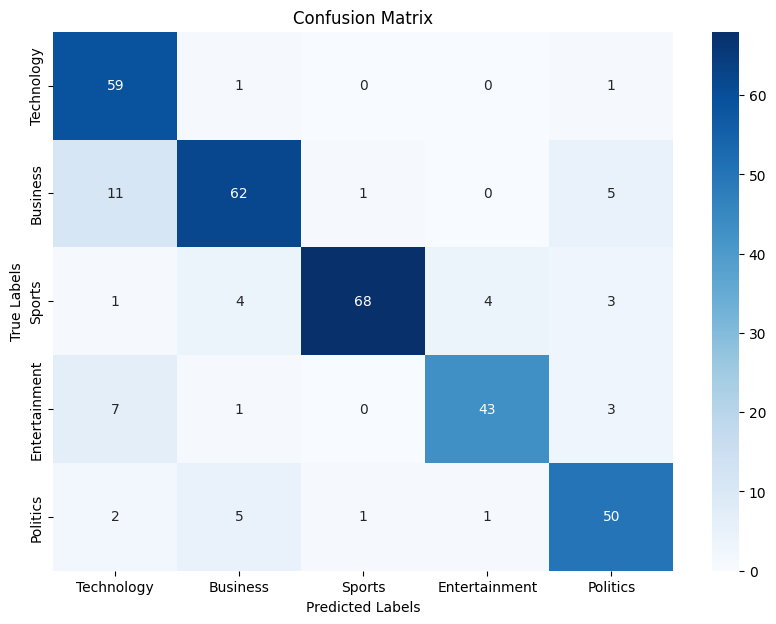

Classification Report:
               precision    recall  f1-score   support

   Technology       0.74      0.97      0.84        61
     Business       0.85      0.78      0.82        79
       Sports       0.97      0.85      0.91        80
Entertainment       0.90      0.80      0.84        54
     Politics       0.81      0.85      0.83        59

     accuracy                           0.85       333
    macro avg       0.85      0.85      0.85       333
 weighted avg       0.86      0.85      0.85       333

Accuracy: 0.8468468468468469
NDCG score with 1st 2 relevant ranks: 0.8695830541827553
==========================End of Folds================================
time taken(mins):  0.07467943032582601
param_dict[best_estimator]:  GaussianNB()
param_dict[best_val_accuracy]:  0.8513207818597041
param_dict[best_val_ndcg]:  0.874019549333233
Iteration: 2
KNeighborsClassifier(metric='cosine')
=========================Training in Folds===========================
============Fold 1=====

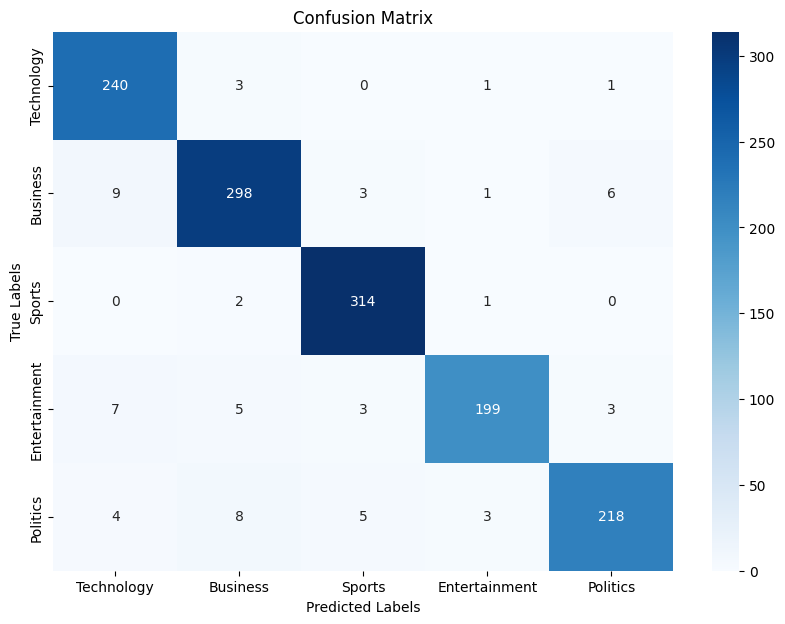

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.98      0.95       245
     Business       0.94      0.94      0.94       317
       Sports       0.97      0.99      0.98       317
Entertainment       0.97      0.92      0.94       217
     Politics       0.96      0.92      0.94       238

     accuracy                           0.95      1334
    macro avg       0.95      0.95      0.95      1334
 weighted avg       0.95      0.95      0.95      1334

Accuracy: 0.9512743628185907
NDCG score with 1st 2 relevant ranks: 0.9758683262261737
==========================Val metrics================================


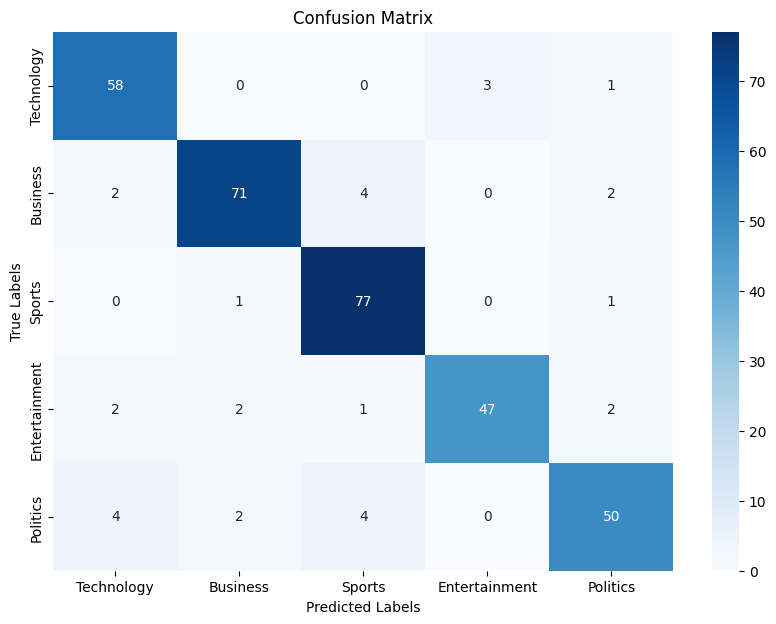

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.94      0.91        62
     Business       0.93      0.90      0.92        79
       Sports       0.90      0.97      0.93        79
Entertainment       0.94      0.87      0.90        54
     Politics       0.89      0.83      0.86        60

     accuracy                           0.91       334
    macro avg       0.91      0.90      0.90       334
 weighted avg       0.91      0.91      0.91       334

Accuracy: 0.907185628742515
NDCG score with 1st 2 relevant ranks: 0.9328477755774177
============Fold 2=============
==========================Train metrics================================


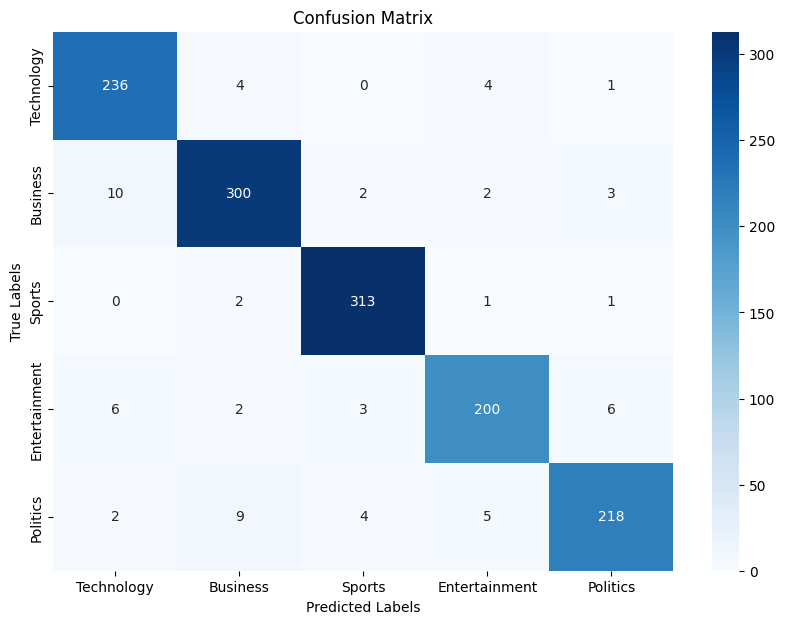

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.96      0.95       245
     Business       0.95      0.95      0.95       317
       Sports       0.97      0.99      0.98       317
Entertainment       0.94      0.92      0.93       217
     Politics       0.95      0.92      0.93       238

     accuracy                           0.95      1334
    macro avg       0.95      0.95      0.95      1334
 weighted avg       0.95      0.95      0.95      1334

Accuracy: 0.9497751124437781
NDCG score with 1st 2 relevant ranks: 0.9796164521632053
==========================Val metrics================================


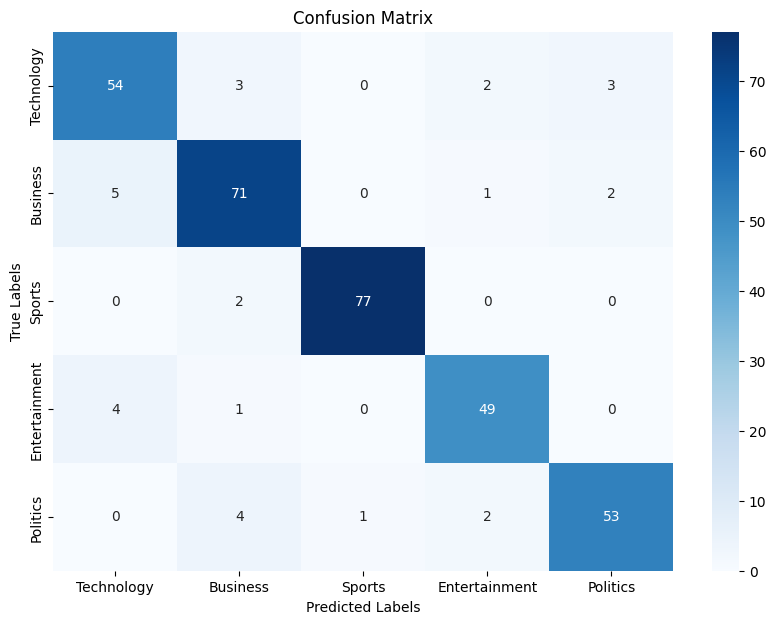

Classification Report:
               precision    recall  f1-score   support

   Technology       0.86      0.87      0.86        62
     Business       0.88      0.90      0.89        79
       Sports       0.99      0.97      0.98        79
Entertainment       0.91      0.91      0.91        54
     Politics       0.91      0.88      0.90        60

     accuracy                           0.91       334
    macro avg       0.91      0.91      0.91       334
 weighted avg       0.91      0.91      0.91       334

Accuracy: 0.9101796407185628
NDCG score with 1st 2 relevant ranks: 0.9430768422690351
============Fold 3=============
==========================Train metrics================================


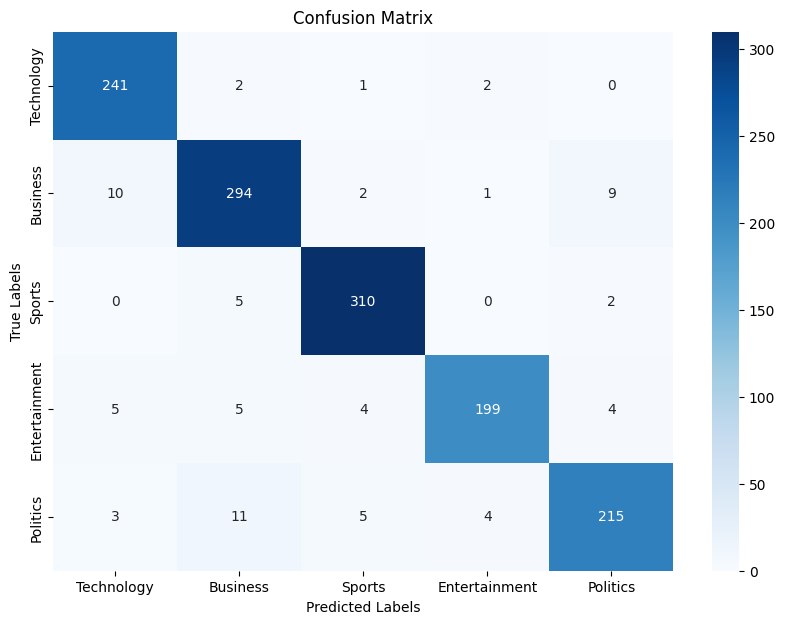

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.98      0.95       246
     Business       0.93      0.93      0.93       316
       Sports       0.96      0.98      0.97       317
Entertainment       0.97      0.92      0.94       217
     Politics       0.93      0.90      0.92       238

     accuracy                           0.94      1334
    macro avg       0.94      0.94      0.94      1334
 weighted avg       0.94      0.94      0.94      1334

Accuracy: 0.9437781109445277
NDCG score with 1st 2 relevant ranks: 0.9784742340115666
==========================Val metrics================================


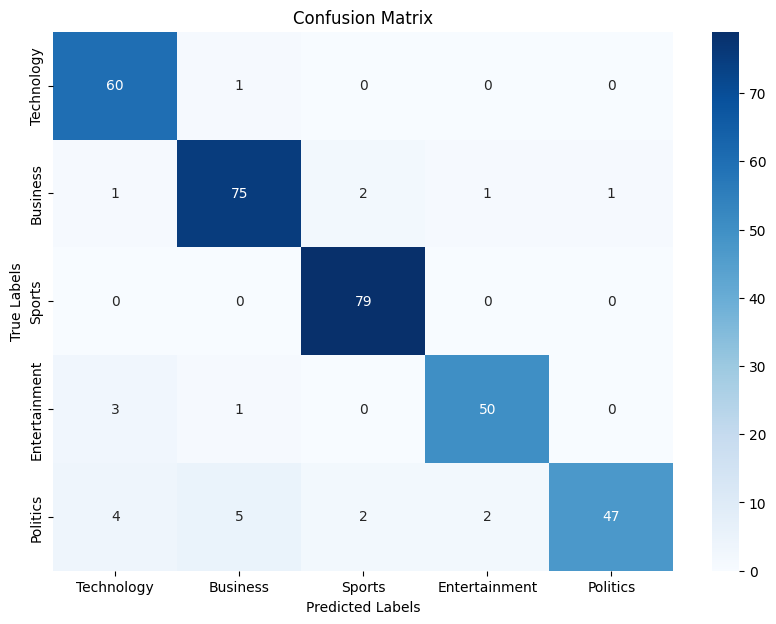

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.98      0.93        61
     Business       0.91      0.94      0.93        80
       Sports       0.95      1.00      0.98        79
Entertainment       0.94      0.93      0.93        54
     Politics       0.98      0.78      0.87        60

     accuracy                           0.93       334
    macro avg       0.93      0.93      0.93       334
 weighted avg       0.93      0.93      0.93       334

Accuracy: 0.9311377245508982
NDCG score with 1st 2 relevant ranks: 0.9564788811484187
============Fold 4=============
==========================Train metrics================================


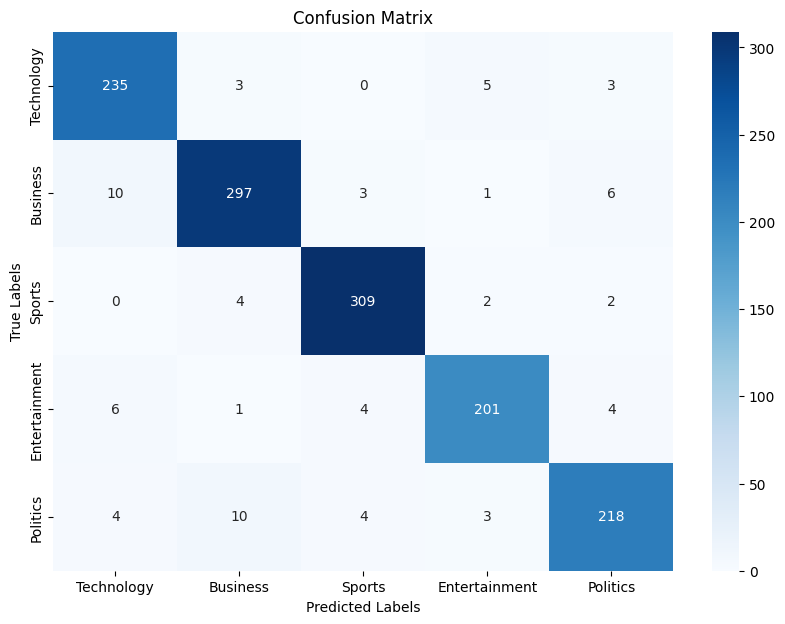

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.96      0.94       246
     Business       0.94      0.94      0.94       317
       Sports       0.97      0.97      0.97       317
Entertainment       0.95      0.93      0.94       216
     Politics       0.94      0.91      0.92       239

     accuracy                           0.94      1335
    macro avg       0.94      0.94      0.94      1335
 weighted avg       0.94      0.94      0.94      1335

Accuracy: 0.9438202247191011
NDCG score with 1st 2 relevant ranks: 0.9756902529427512
==========================Val metrics================================


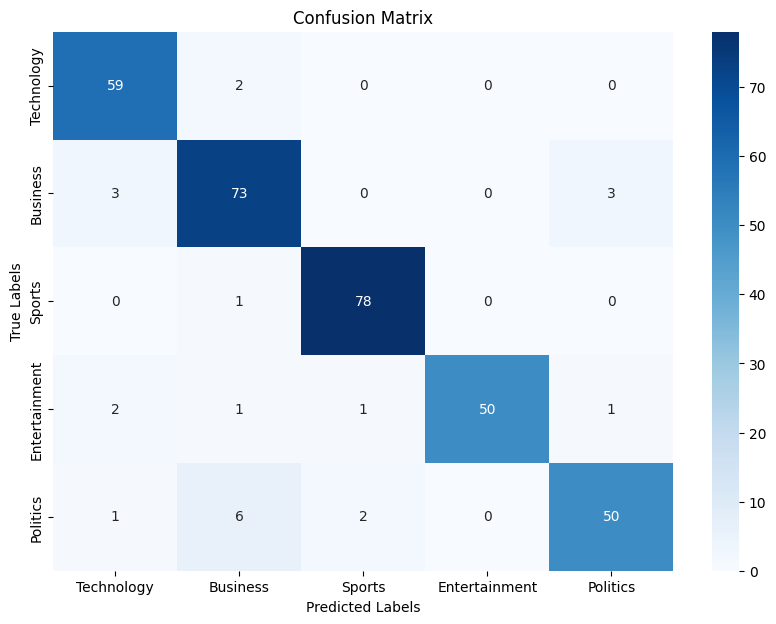

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.97      0.94        61
     Business       0.88      0.92      0.90        79
       Sports       0.96      0.99      0.97        79
Entertainment       1.00      0.91      0.95        55
     Politics       0.93      0.85      0.88        59

     accuracy                           0.93       333
    macro avg       0.94      0.93      0.93       333
 weighted avg       0.93      0.93      0.93       333

Accuracy: 0.9309309309309309
NDCG score with 1st 2 relevant ranks: 0.9634625121621634
============Fold 5=============
==========================Train metrics================================


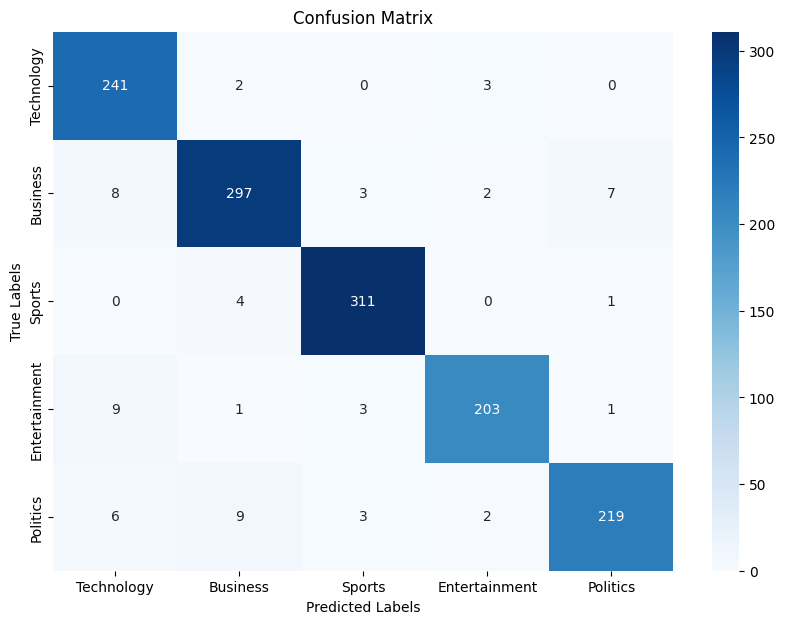

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.98      0.95       246
     Business       0.95      0.94      0.94       317
       Sports       0.97      0.98      0.98       316
Entertainment       0.97      0.94      0.95       217
     Politics       0.96      0.92      0.94       239

     accuracy                           0.95      1335
    macro avg       0.95      0.95      0.95      1335
 weighted avg       0.95      0.95      0.95      1335

Accuracy: 0.9520599250936329
NDCG score with 1st 2 relevant ranks: 0.9754137958293218
==========================Val metrics================================


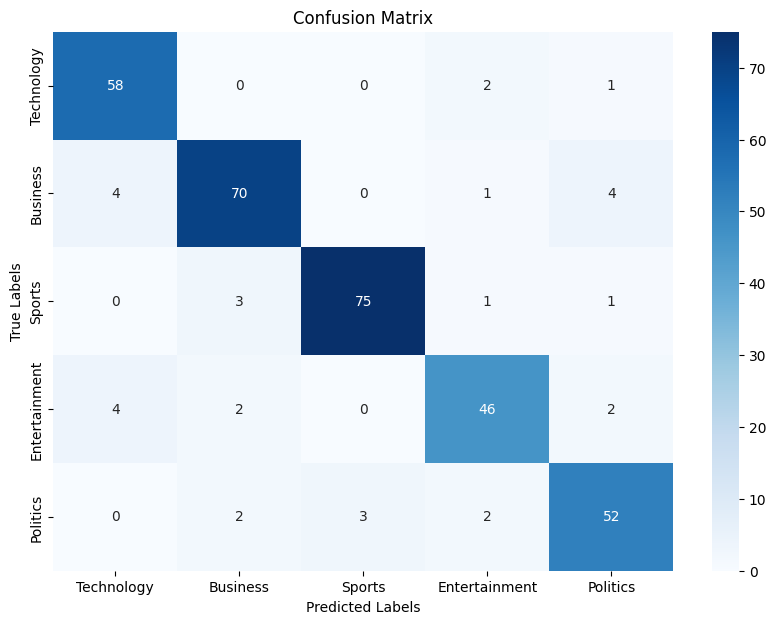

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.95      0.91        61
     Business       0.91      0.89      0.90        79
       Sports       0.96      0.94      0.95        80
Entertainment       0.88      0.85      0.87        54
     Politics       0.87      0.88      0.87        59

     accuracy                           0.90       333
    macro avg       0.90      0.90      0.90       333
 weighted avg       0.90      0.90      0.90       333

Accuracy: 0.9039039039039038
NDCG score with 1st 2 relevant ranks: 0.9399028988524255
==========================End of Folds================================
time taken(mins):  0.0840909997622172
param_dict[best_estimator]:  KNeighborsClassifier(metric='cosine')
param_dict[best_val_accuracy]:  0.9166675657693621
param_dict[best_val_ndcg]:  0.947153782001892
Iteration: 3
KNeighborsClassifier(metric='cosine', weights='distance')
=========================Training in Folds=======

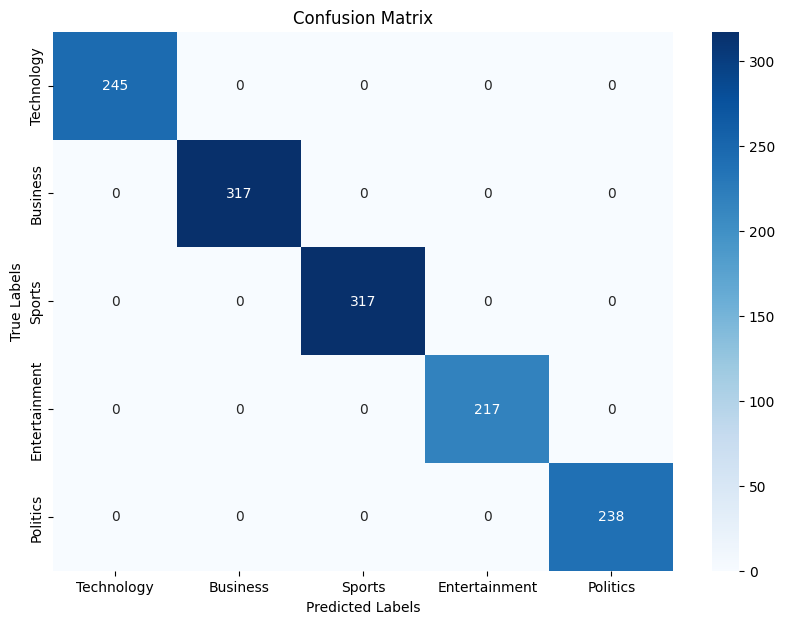

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


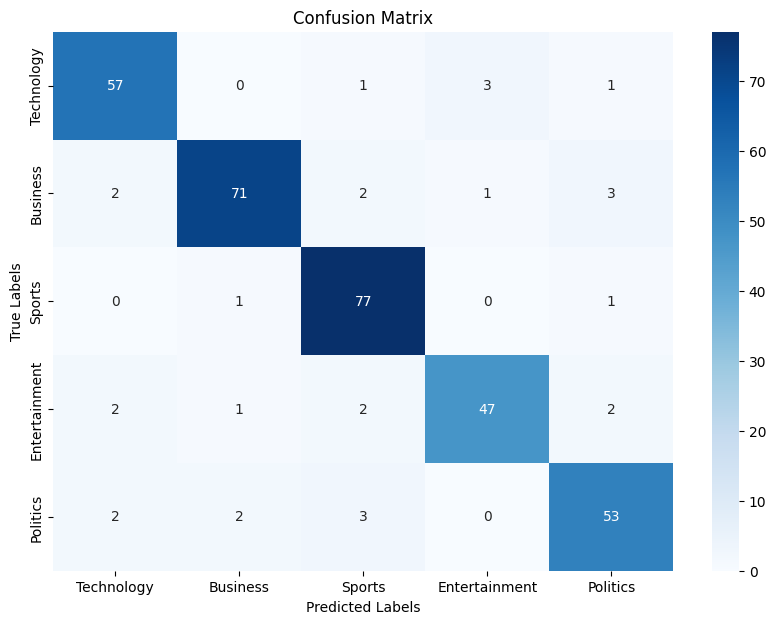

Classification Report:
               precision    recall  f1-score   support

   Technology       0.90      0.92      0.91        62
     Business       0.95      0.90      0.92        79
       Sports       0.91      0.97      0.94        79
Entertainment       0.92      0.87      0.90        54
     Politics       0.88      0.88      0.88        60

     accuracy                           0.91       334
    macro avg       0.91      0.91      0.91       334
 weighted avg       0.91      0.91      0.91       334

Accuracy: 0.9131736526946108
NDCG score with 1st 2 relevant ranks: 0.9396198100299414
============Fold 2=============
==========================Train metrics================================


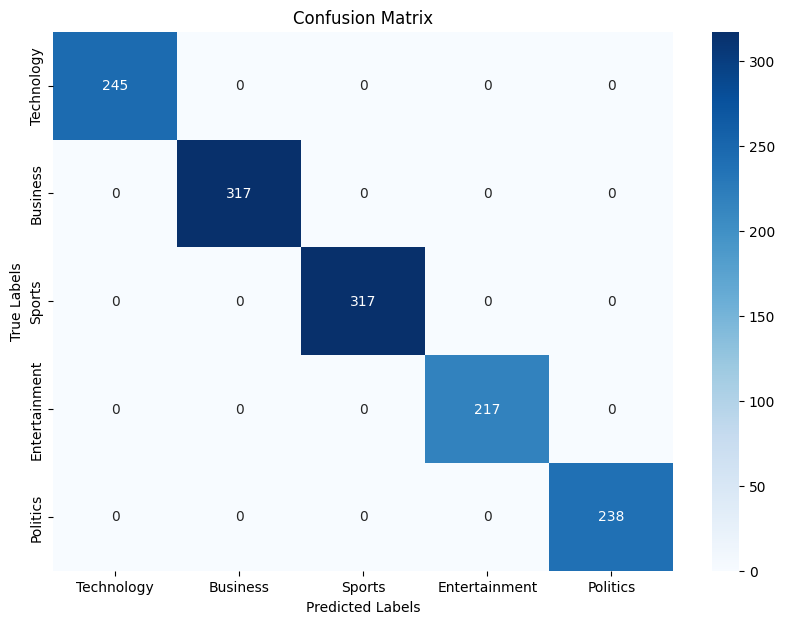

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


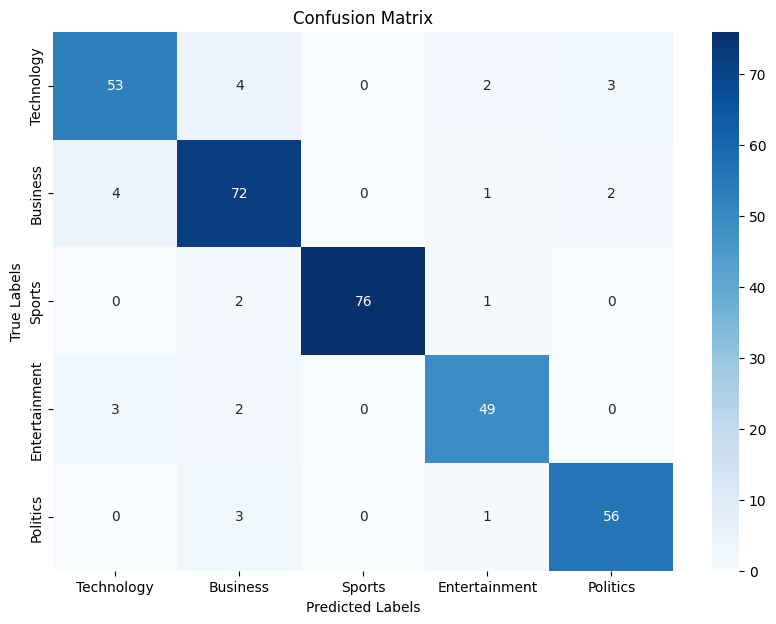

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.85      0.87        62
     Business       0.87      0.91      0.89        79
       Sports       1.00      0.96      0.98        79
Entertainment       0.91      0.91      0.91        54
     Politics       0.92      0.93      0.93        60

     accuracy                           0.92       334
    macro avg       0.92      0.91      0.91       334
 weighted avg       0.92      0.92      0.92       334

Accuracy: 0.9161676646706587
NDCG score with 1st 2 relevant ranks: 0.946391844482465
============Fold 3=============
==========================Train metrics================================


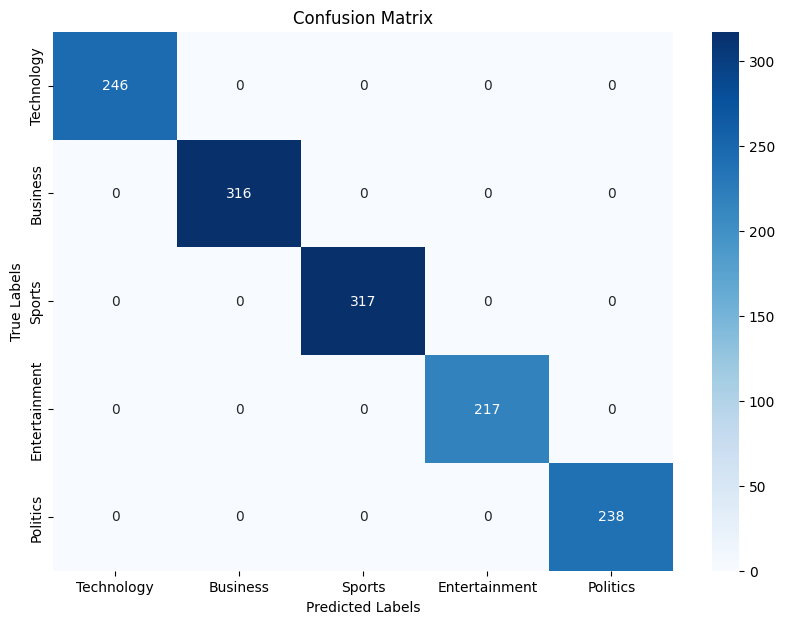

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       316
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


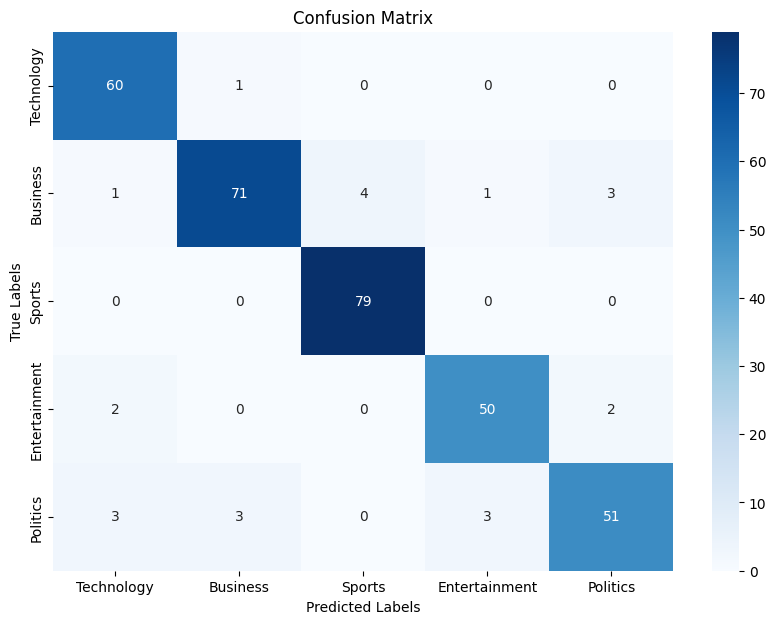

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.98      0.94        61
     Business       0.95      0.89      0.92        80
       Sports       0.95      1.00      0.98        79
Entertainment       0.93      0.93      0.93        54
     Politics       0.91      0.85      0.88        60

     accuracy                           0.93       334
    macro avg       0.93      0.93      0.93       334
 weighted avg       0.93      0.93      0.93       334

Accuracy: 0.9311377245508982
NDCG score with 1st 2 relevant ranks: 0.9594728931244666
============Fold 4=============
==========================Train metrics================================


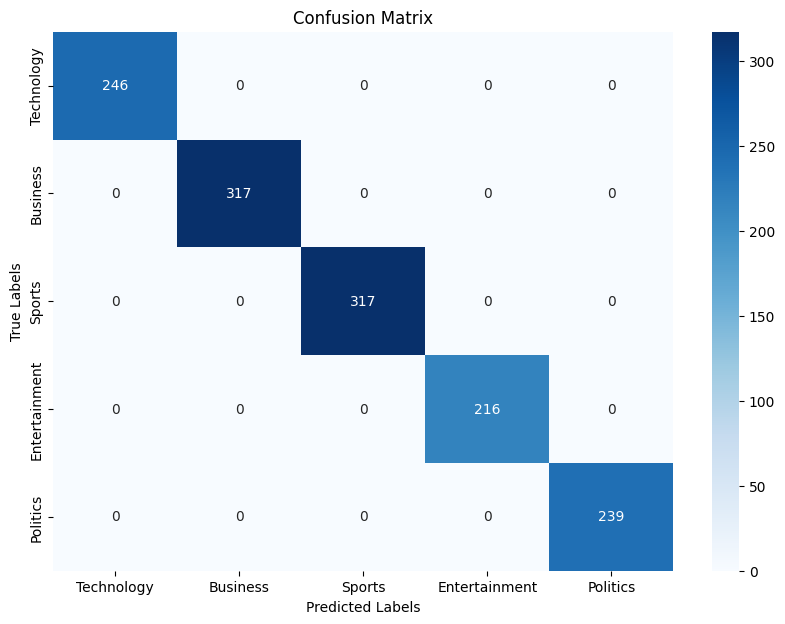

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       216
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


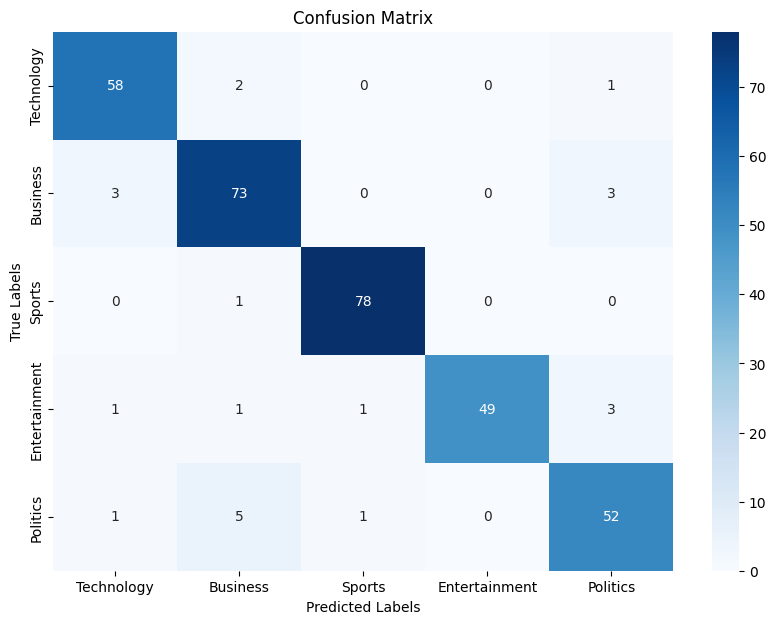

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.95      0.94        61
     Business       0.89      0.92      0.91        79
       Sports       0.97      0.99      0.98        79
Entertainment       1.00      0.89      0.94        55
     Politics       0.88      0.88      0.88        59

     accuracy                           0.93       333
    macro avg       0.93      0.93      0.93       333
 weighted avg       0.93      0.93      0.93       333

Accuracy: 0.9309309309309309
NDCG score with 1st 2 relevant ranks: 0.9612458740454755
============Fold 5=============
==========================Train metrics================================


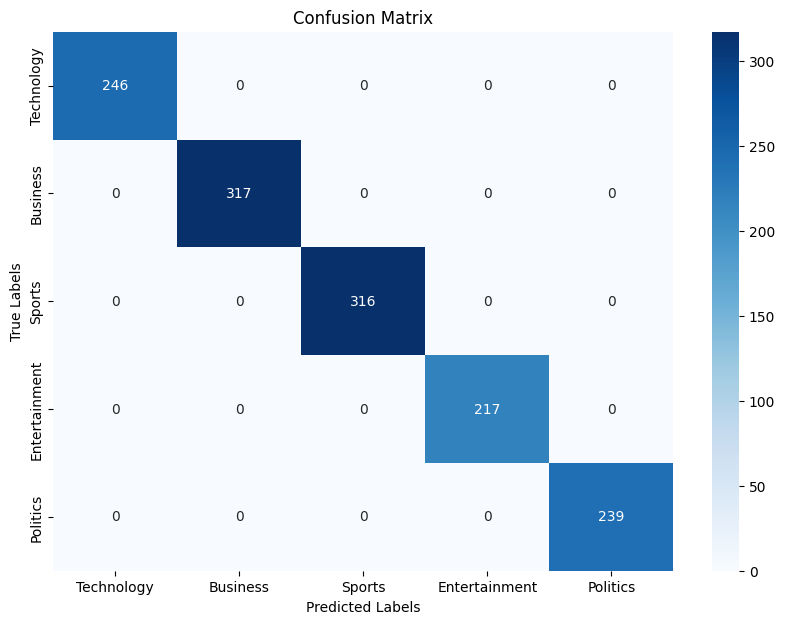

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       316
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


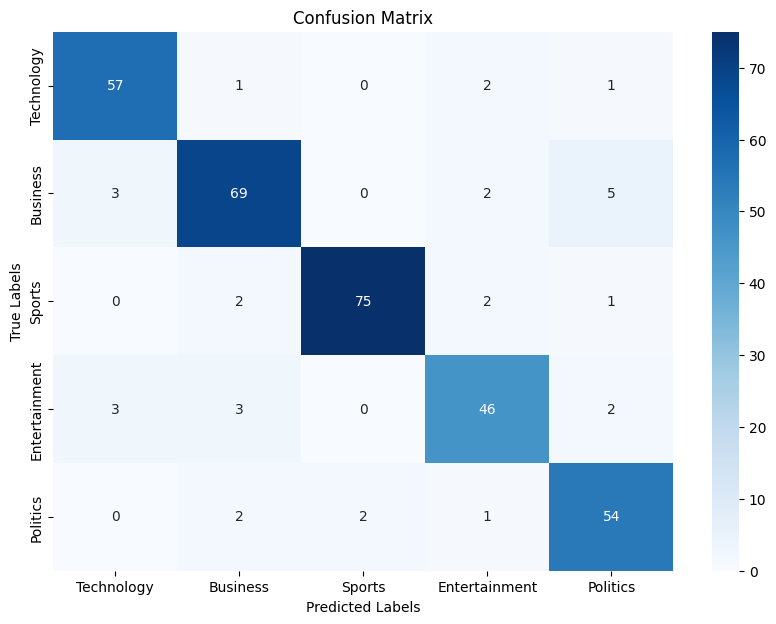

Classification Report:
               precision    recall  f1-score   support

   Technology       0.90      0.93      0.92        61
     Business       0.90      0.87      0.88        79
       Sports       0.97      0.94      0.96        80
Entertainment       0.87      0.85      0.86        54
     Politics       0.86      0.92      0.89        59

     accuracy                           0.90       333
    macro avg       0.90      0.90      0.90       333
 weighted avg       0.90      0.90      0.90       333

Accuracy: 0.9039039039039038
NDCG score with 1st 2 relevant ranks: 0.9436922667417438
==========================End of Folds================================
time taken(mins):  0.07994123697280883
param_dict[best_estimator]:  KNeighborsClassifier(metric='cosine', weights='distance')
param_dict[best_val_accuracy]:  0.9190627753502005
param_dict[best_val_ndcg]:  0.9500845376848185
Iteration: 4
KNeighborsClassifier(metric='cosine', n_neighbors=7)
=========================Trainin

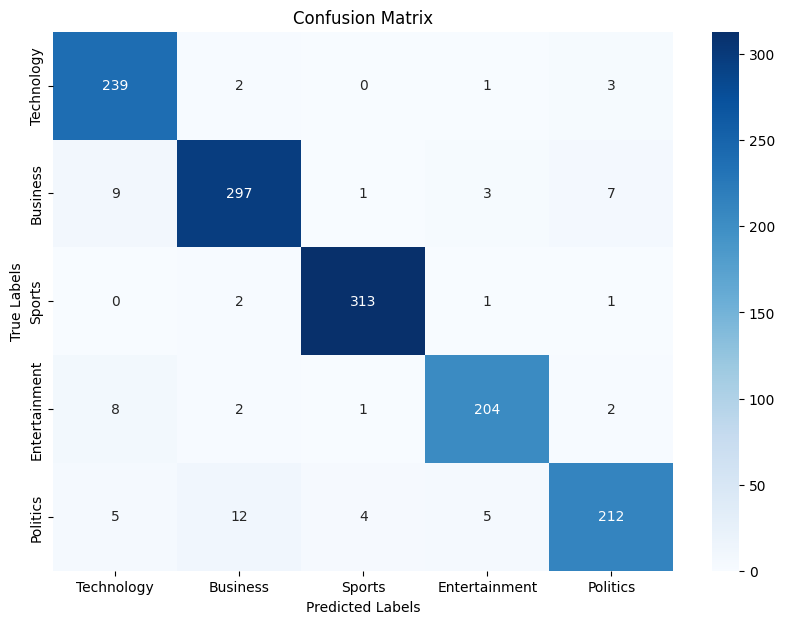

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.98      0.94       245
     Business       0.94      0.94      0.94       317
       Sports       0.98      0.99      0.98       317
Entertainment       0.95      0.94      0.95       217
     Politics       0.94      0.89      0.92       238

     accuracy                           0.95      1334
    macro avg       0.95      0.95      0.95      1334
 weighted avg       0.95      0.95      0.95      1334

Accuracy: 0.9482758620689655
NDCG score with 1st 2 relevant ranks: 0.9768142478956963
==========================Val metrics================================


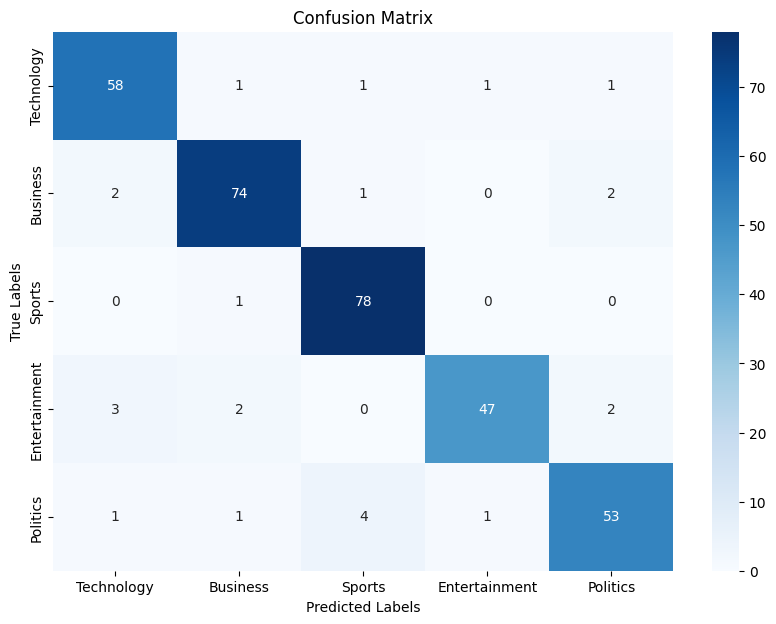

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.94      0.92        62
     Business       0.94      0.94      0.94        79
       Sports       0.93      0.99      0.96        79
Entertainment       0.96      0.87      0.91        54
     Politics       0.91      0.88      0.90        60

     accuracy                           0.93       334
    macro avg       0.93      0.92      0.93       334
 weighted avg       0.93      0.93      0.93       334

Accuracy: 0.9281437125748503
NDCG score with 1st 2 relevant ranks: 0.9448238234816093
============Fold 2=============
==========================Train metrics================================


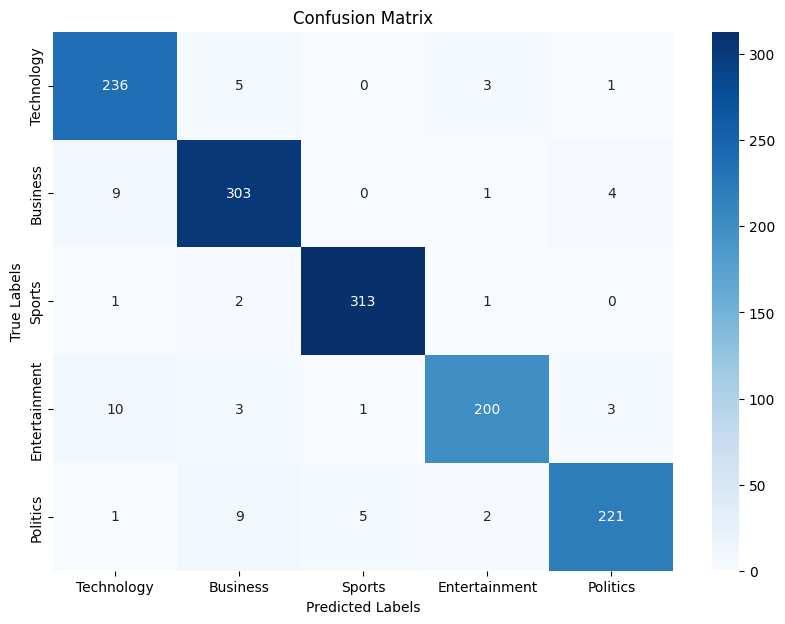

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.96      0.94       245
     Business       0.94      0.96      0.95       317
       Sports       0.98      0.99      0.98       317
Entertainment       0.97      0.92      0.94       217
     Politics       0.97      0.93      0.95       238

     accuracy                           0.95      1334
    macro avg       0.95      0.95      0.95      1334
 weighted avg       0.95      0.95      0.95      1334

Accuracy: 0.954272863568216
NDCG score with 1st 2 relevant ranks: 0.979420155681089
==========================Val metrics================================


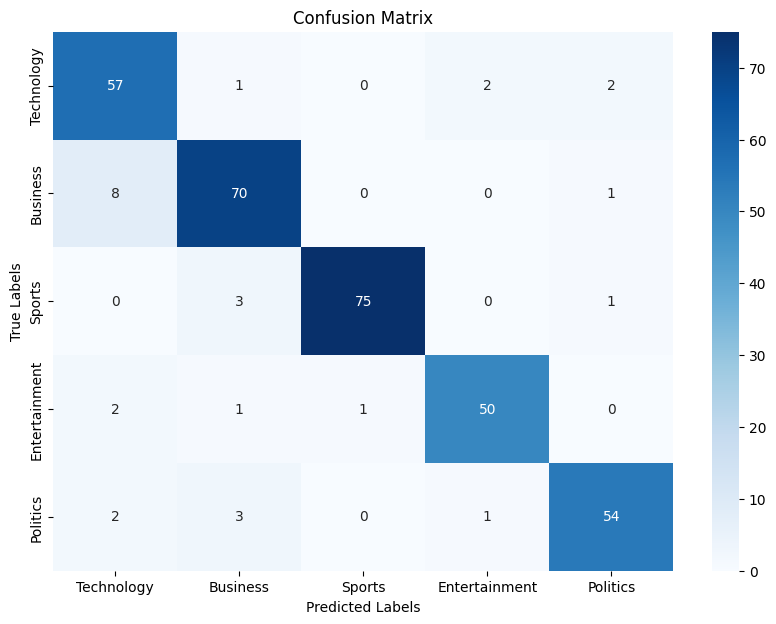

Classification Report:
               precision    recall  f1-score   support

   Technology       0.83      0.92      0.87        62
     Business       0.90      0.89      0.89        79
       Sports       0.99      0.95      0.97        79
Entertainment       0.94      0.93      0.93        54
     Politics       0.93      0.90      0.92        60

     accuracy                           0.92       334
    macro avg       0.92      0.92      0.92       334
 weighted avg       0.92      0.92      0.92       334

Accuracy: 0.9161676646706587
NDCG score with 1st 2 relevant ranks: 0.9569419014114644
============Fold 3=============
==========================Train metrics================================


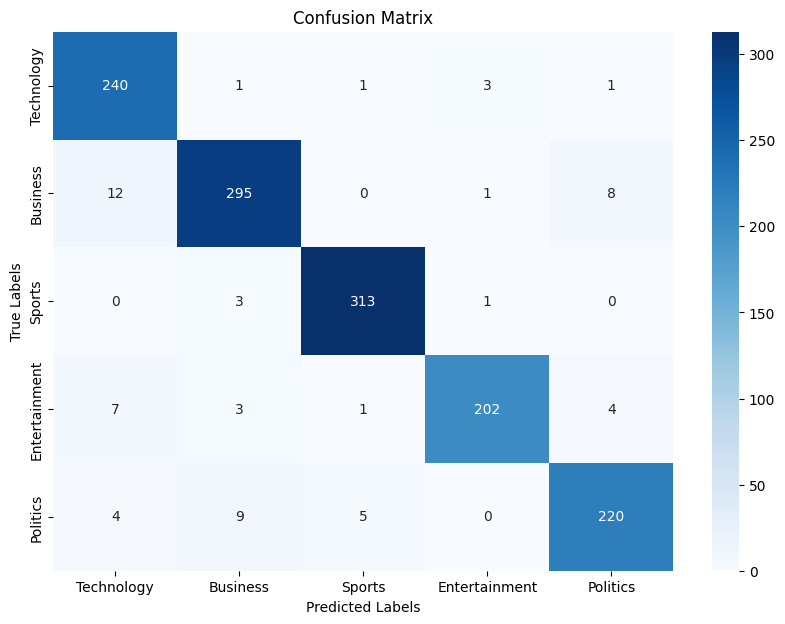

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.98      0.94       246
     Business       0.95      0.93      0.94       316
       Sports       0.98      0.99      0.98       317
Entertainment       0.98      0.93      0.95       217
     Politics       0.94      0.92      0.93       238

     accuracy                           0.95      1334
    macro avg       0.95      0.95      0.95      1334
 weighted avg       0.95      0.95      0.95      1334

Accuracy: 0.952023988005997
NDCG score with 1st 2 relevant ranks: 0.9785546018820958
==========================Val metrics================================


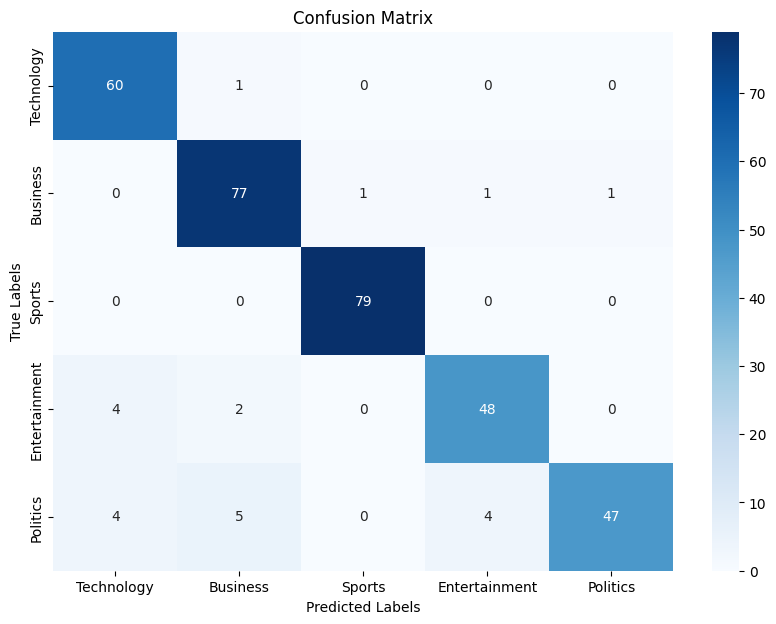

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.98      0.93        61
     Business       0.91      0.96      0.93        80
       Sports       0.99      1.00      0.99        79
Entertainment       0.91      0.89      0.90        54
     Politics       0.98      0.78      0.87        60

     accuracy                           0.93       334
    macro avg       0.93      0.92      0.92       334
 weighted avg       0.93      0.93      0.93       334

Accuracy: 0.9311377245508982
NDCG score with 1st 2 relevant ranks: 0.9657819073139446
============Fold 4=============
==========================Train metrics================================


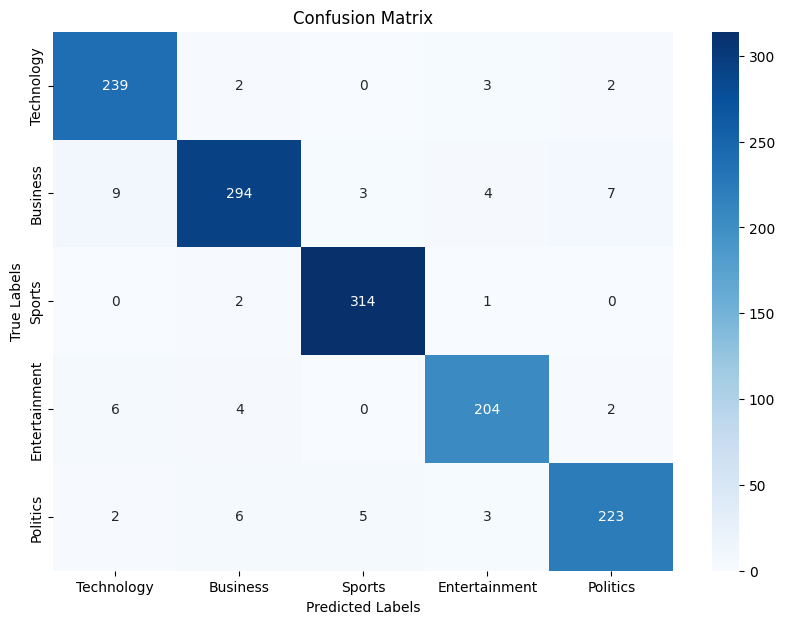

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.97      0.95       246
     Business       0.95      0.93      0.94       317
       Sports       0.98      0.99      0.98       317
Entertainment       0.95      0.94      0.95       216
     Politics       0.95      0.93      0.94       239

     accuracy                           0.95      1335
    macro avg       0.95      0.95      0.95      1335
 weighted avg       0.95      0.95      0.95      1335

Accuracy: 0.954307116104869
NDCG score with 1st 2 relevant ranks: 0.9808178568619592
==========================Val metrics================================


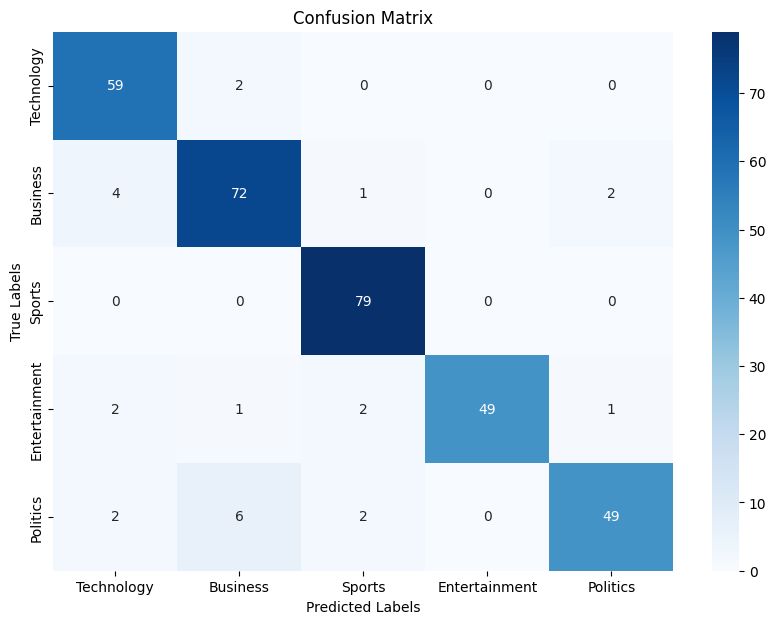

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.97      0.92        61
     Business       0.89      0.91      0.90        79
       Sports       0.94      1.00      0.97        79
Entertainment       1.00      0.89      0.94        55
     Politics       0.94      0.83      0.88        59

     accuracy                           0.92       333
    macro avg       0.93      0.92      0.92       333
 weighted avg       0.93      0.92      0.92       333

Accuracy: 0.924924924924925
NDCG score with 1st 2 relevant ranks: 0.9631405579901344
============Fold 5=============
==========================Train metrics================================


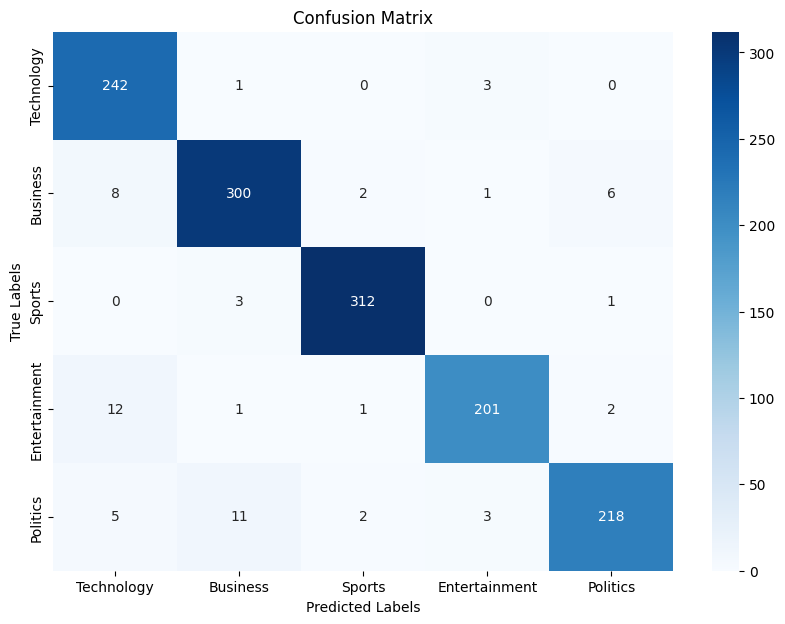

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.98      0.94       246
     Business       0.95      0.95      0.95       317
       Sports       0.98      0.99      0.99       316
Entertainment       0.97      0.93      0.95       217
     Politics       0.96      0.91      0.94       239

     accuracy                           0.95      1335
    macro avg       0.95      0.95      0.95      1335
 weighted avg       0.95      0.95      0.95      1335

Accuracy: 0.9535580524344569
NDCG score with 1st 2 relevant ranks: 0.9799081778517936
==========================Val metrics================================


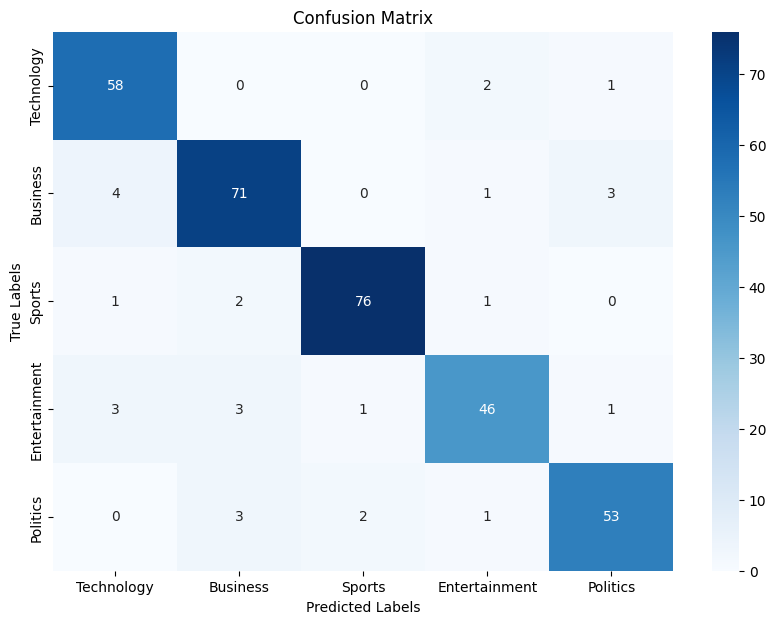

Classification Report:
               precision    recall  f1-score   support

   Technology       0.88      0.95      0.91        61
     Business       0.90      0.90      0.90        79
       Sports       0.96      0.95      0.96        80
Entertainment       0.90      0.85      0.88        54
     Politics       0.91      0.90      0.91        59

     accuracy                           0.91       333
    macro avg       0.91      0.91      0.91       333
 weighted avg       0.91      0.91      0.91       333

Accuracy: 0.9129129129129129
NDCG score with 1st 2 relevant ranks: 0.9575989626984147
==========================End of Folds================================
time taken(mins):  0.0774476130803426
param_dict[best_estimator]:  KNeighborsClassifier(metric='cosine', n_neighbors=7)
param_dict[best_val_accuracy]:  0.9226573879268489
param_dict[best_val_ndcg]:  0.9576574305791133
Iteration: 5
KNeighborsClassifier(metric='cosine', n_neighbors=7, weights='distance')
==================

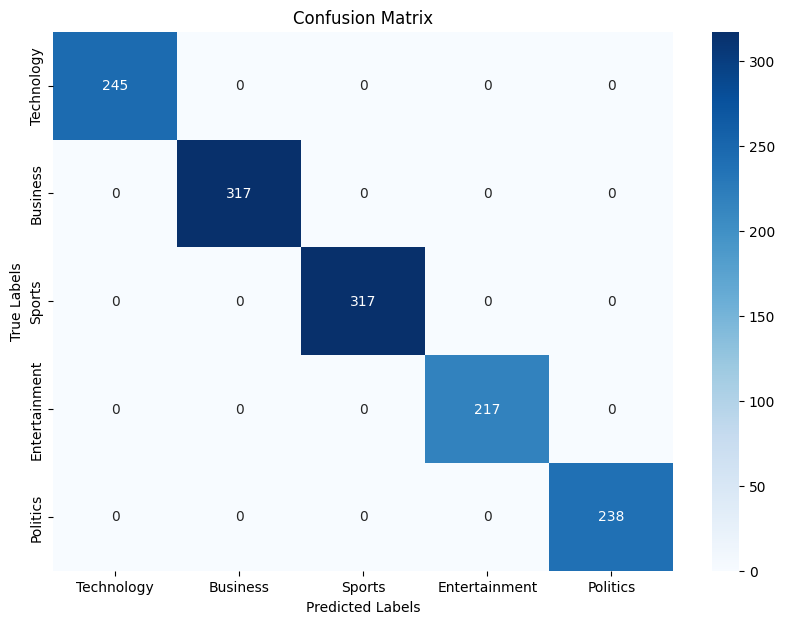

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


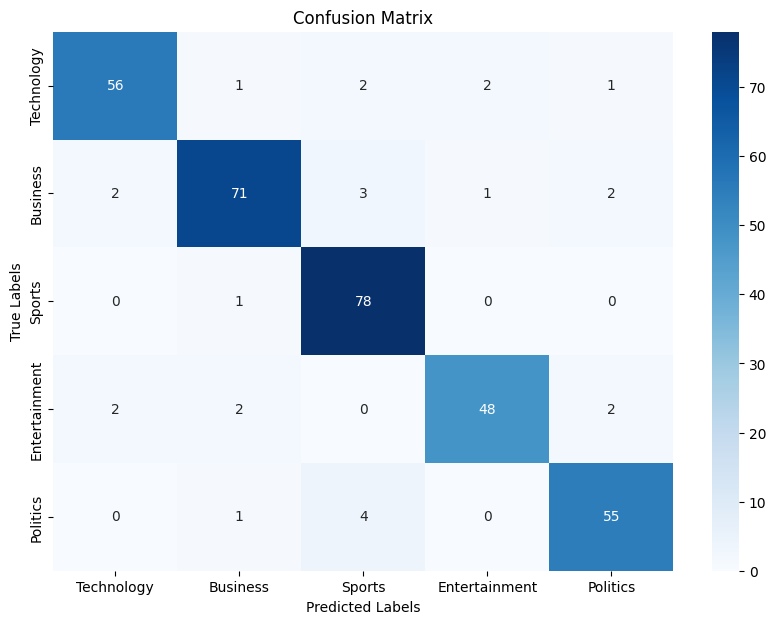

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.90      0.92        62
     Business       0.93      0.90      0.92        79
       Sports       0.90      0.99      0.94        79
Entertainment       0.94      0.89      0.91        54
     Politics       0.92      0.92      0.92        60

     accuracy                           0.92       334
    macro avg       0.92      0.92      0.92       334
 weighted avg       0.92      0.92      0.92       334

Accuracy: 0.9221556886227545
NDCG score with 1st 2 relevant ranks: 0.9448238234816093
============Fold 2=============
==========================Train metrics================================


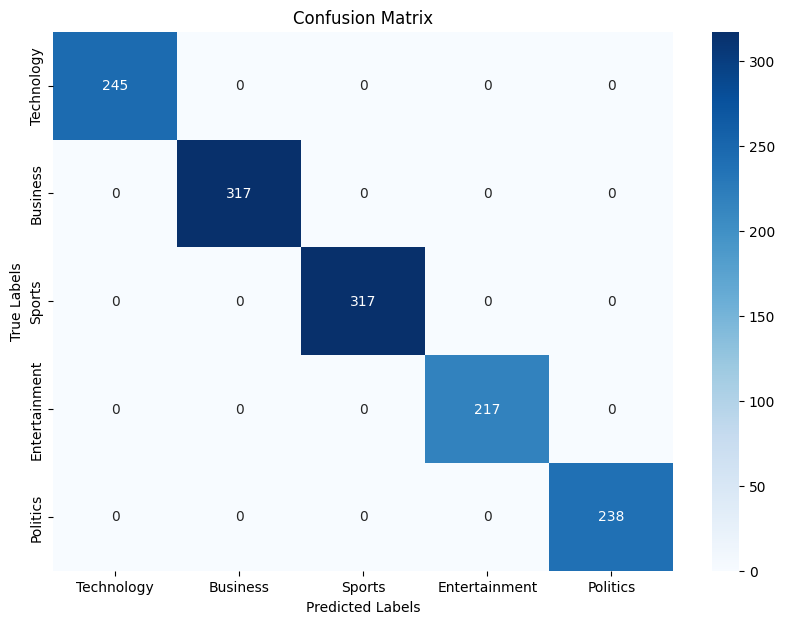

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


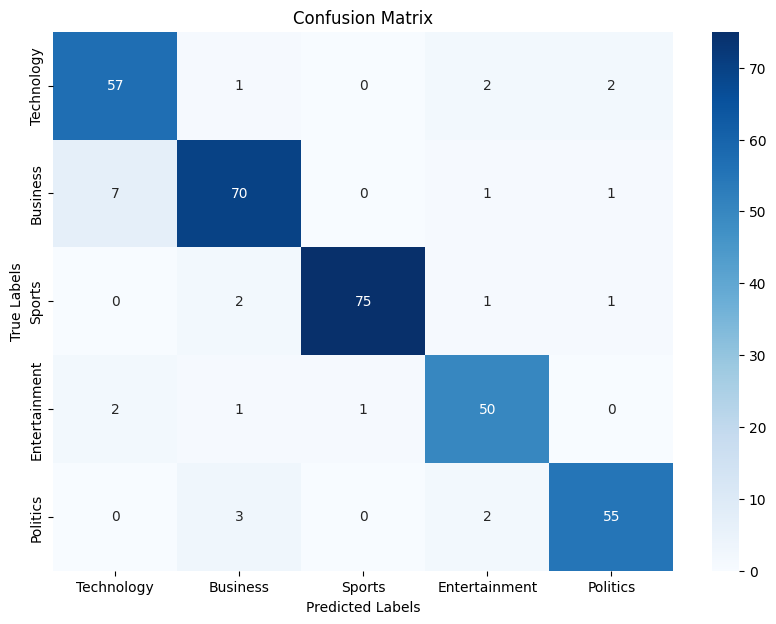

Classification Report:
               precision    recall  f1-score   support

   Technology       0.86      0.92      0.89        62
     Business       0.91      0.89      0.90        79
       Sports       0.99      0.95      0.97        79
Entertainment       0.89      0.93      0.91        54
     Politics       0.93      0.92      0.92        60

     accuracy                           0.92       334
    macro avg       0.92      0.92      0.92       334
 weighted avg       0.92      0.92      0.92       334

Accuracy: 0.9191616766467066
NDCG score with 1st 2 relevant ranks: 0.9550528901732267
============Fold 3=============
==========================Train metrics================================


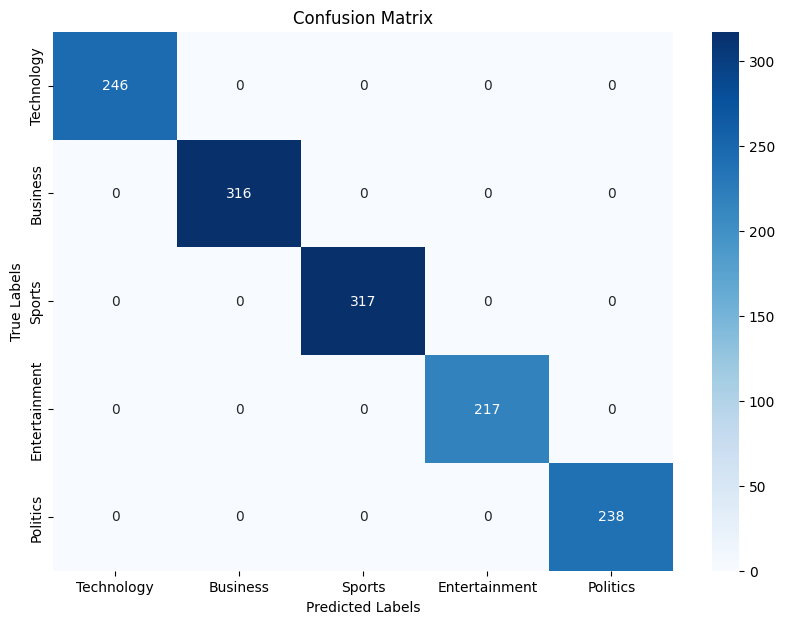

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       316
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


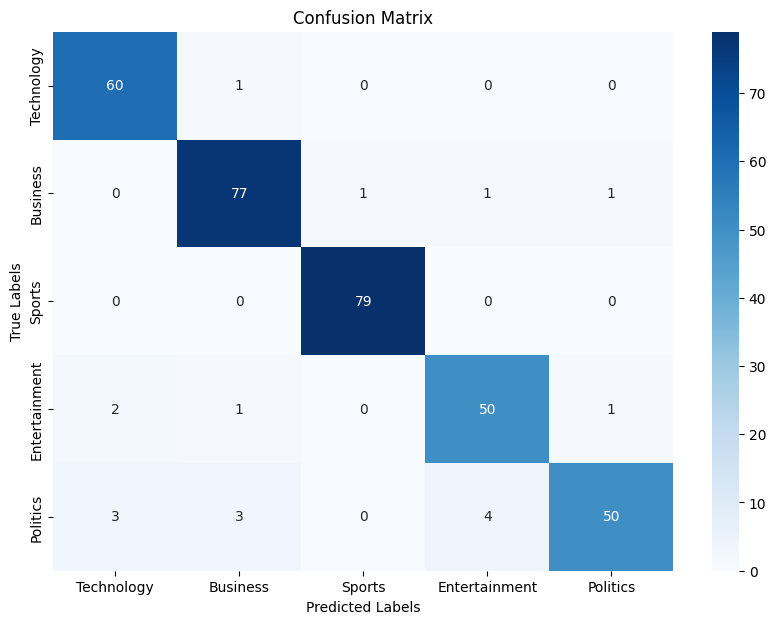

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.98      0.95        61
     Business       0.94      0.96      0.95        80
       Sports       0.99      1.00      0.99        79
Entertainment       0.91      0.93      0.92        54
     Politics       0.96      0.83      0.89        60

     accuracy                           0.95       334
    macro avg       0.94      0.94      0.94       334
 weighted avg       0.95      0.95      0.95       334

Accuracy: 0.9461077844311377
NDCG score with 1st 2 relevant ranks: 0.9687759192899926
============Fold 4=============
==========================Train metrics================================


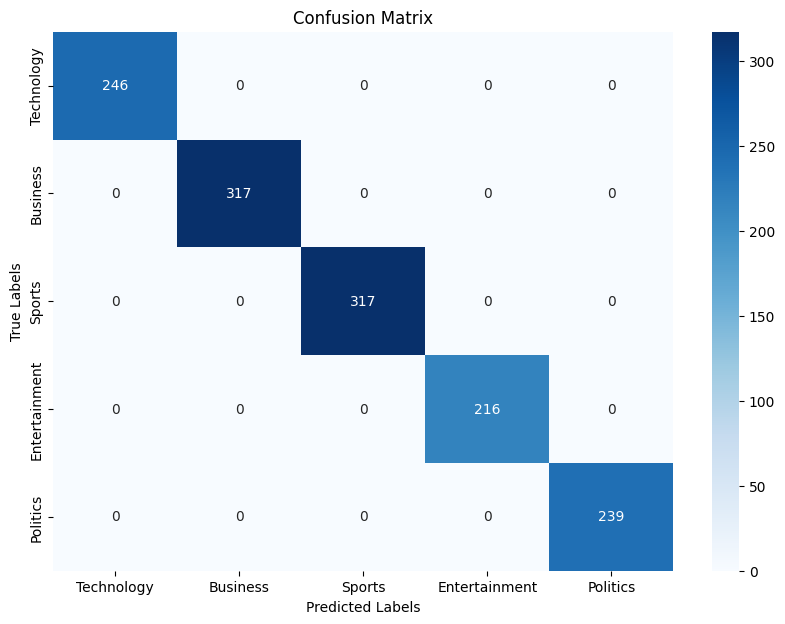

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       216
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


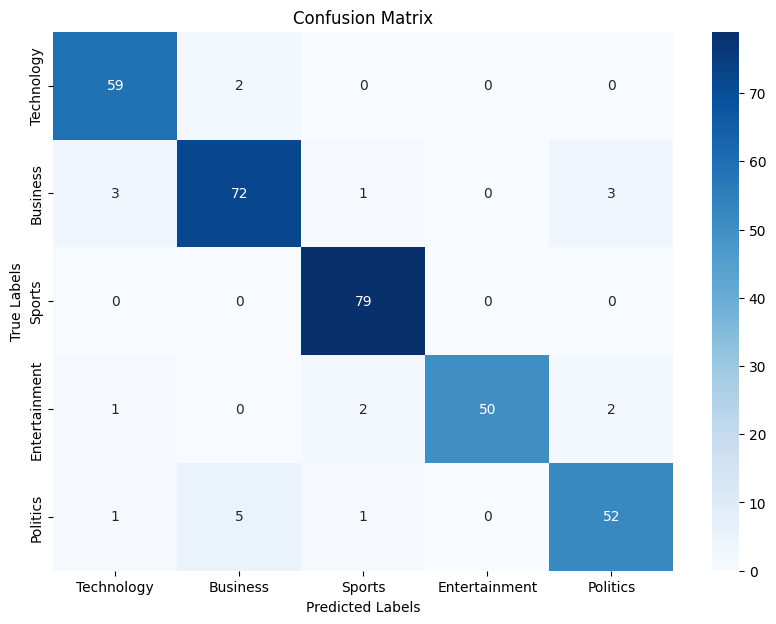

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.97      0.94        61
     Business       0.91      0.91      0.91        79
       Sports       0.95      1.00      0.98        79
Entertainment       1.00      0.91      0.95        55
     Politics       0.91      0.88      0.90        59

     accuracy                           0.94       333
    macro avg       0.94      0.93      0.94       333
 weighted avg       0.94      0.94      0.94       333

Accuracy: 0.9369369369369369
NDCG score with 1st 2 relevant ranks: 0.9634625121621634
============Fold 5=============
==========================Train metrics================================


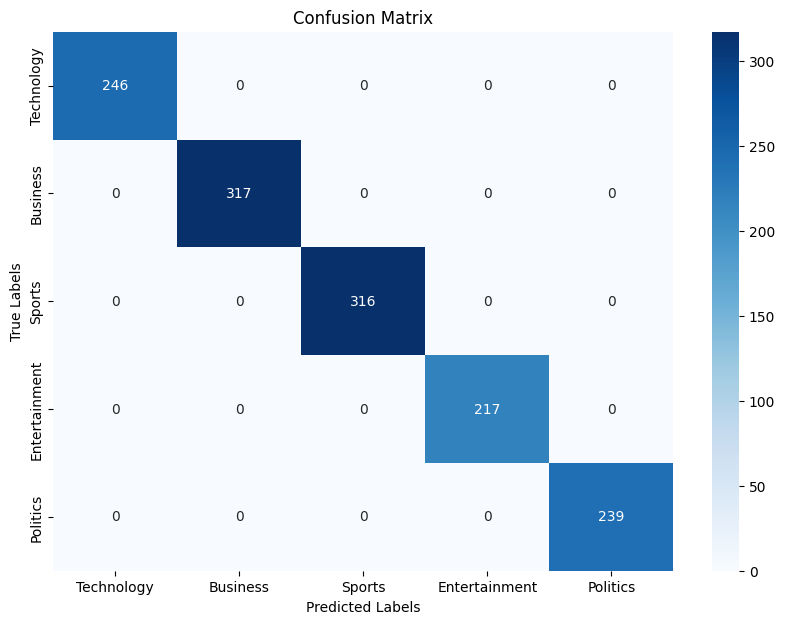

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       316
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


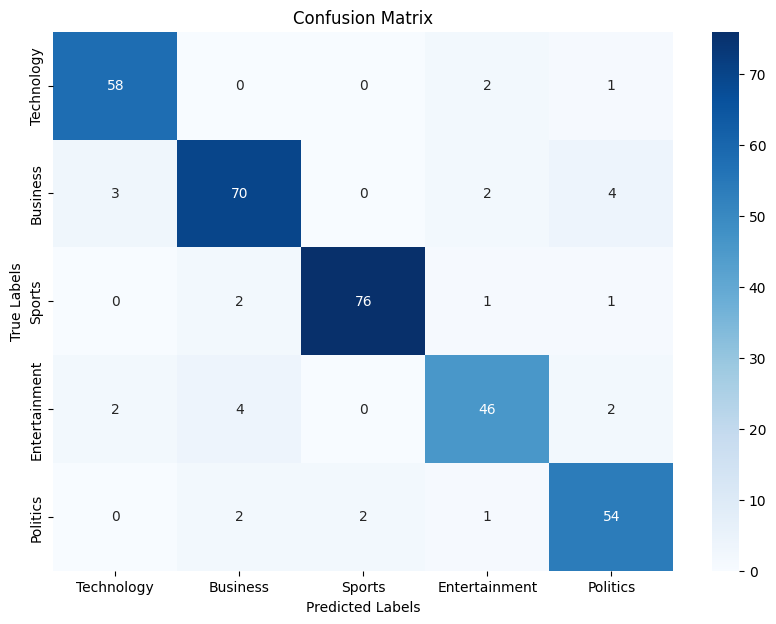

Classification Report:
               precision    recall  f1-score   support

   Technology       0.92      0.95      0.94        61
     Business       0.90      0.89      0.89        79
       Sports       0.97      0.95      0.96        80
Entertainment       0.88      0.85      0.87        54
     Politics       0.87      0.92      0.89        59

     accuracy                           0.91       333
    macro avg       0.91      0.91      0.91       333
 weighted avg       0.91      0.91      0.91       333

Accuracy: 0.9129129129129129
NDCG score with 1st 2 relevant ranks: 0.9545959596954117
==========================End of Folds================================
time taken(mins):  0.08028556903203328
param_dict[best_estimator]:  KNeighborsClassifier(metric='cosine', n_neighbors=7)
param_dict[best_val_accuracy]:  0.9226573879268489
param_dict[best_val_ndcg]:  0.9576574305791133
Iteration: 6
RandomForestClassifier(max_depth=3, n_estimators=200, oob_score=True)
====================

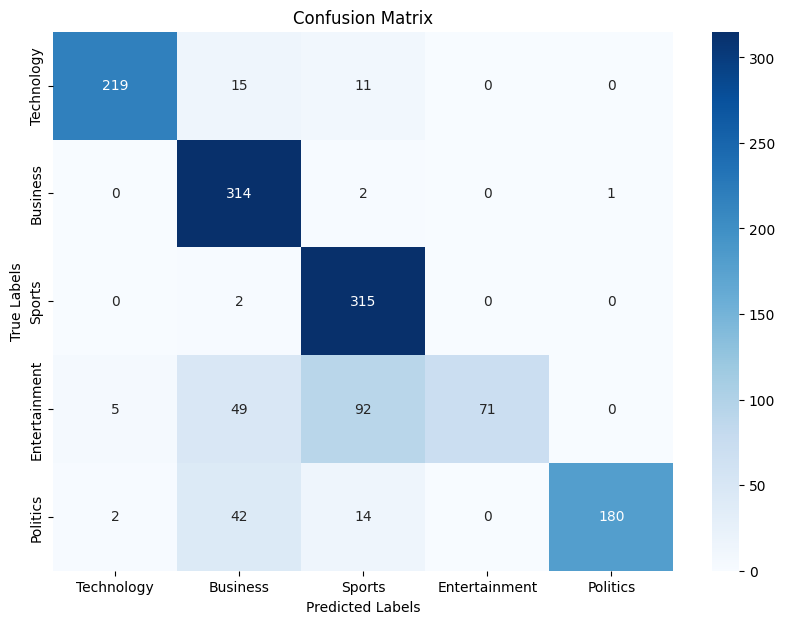

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.89      0.93       245
     Business       0.74      0.99      0.85       317
       Sports       0.73      0.99      0.84       317
Entertainment       1.00      0.33      0.49       217
     Politics       0.99      0.76      0.86       238

     accuracy                           0.82      1334
    macro avg       0.89      0.79      0.79      1334
 weighted avg       0.87      0.82      0.81      1334

Accuracy: 0.8238380809595203
NDCG score with 1st 2 relevant ranks: 0.8597831044013724
==========================Val metrics================================


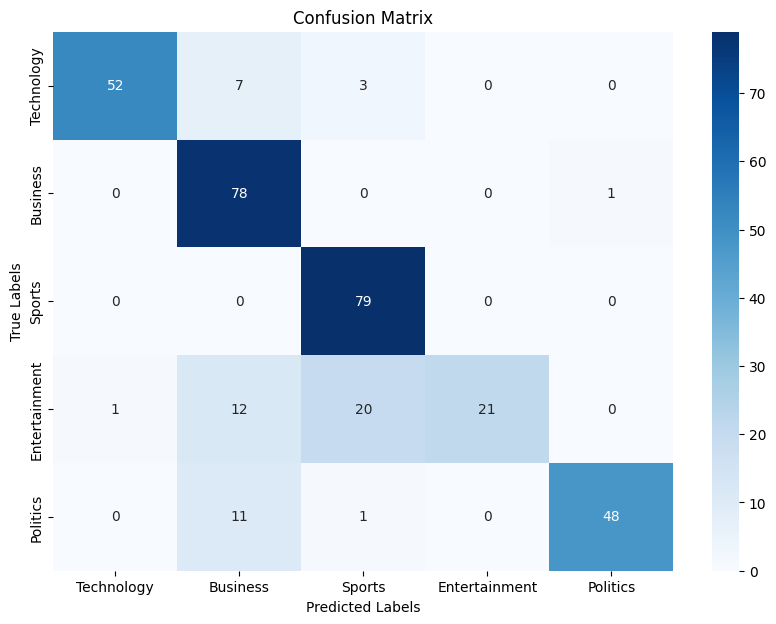

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.84      0.90        62
     Business       0.72      0.99      0.83        79
       Sports       0.77      1.00      0.87        79
Entertainment       1.00      0.39      0.56        54
     Politics       0.98      0.80      0.88        60

     accuracy                           0.83       334
    macro avg       0.89      0.80      0.81       334
 weighted avg       0.87      0.83      0.82       334

Accuracy: 0.8323353293413174
NDCG score with 1st 2 relevant ranks: 0.85689247543841
============Fold 2=============
==========================Train metrics================================


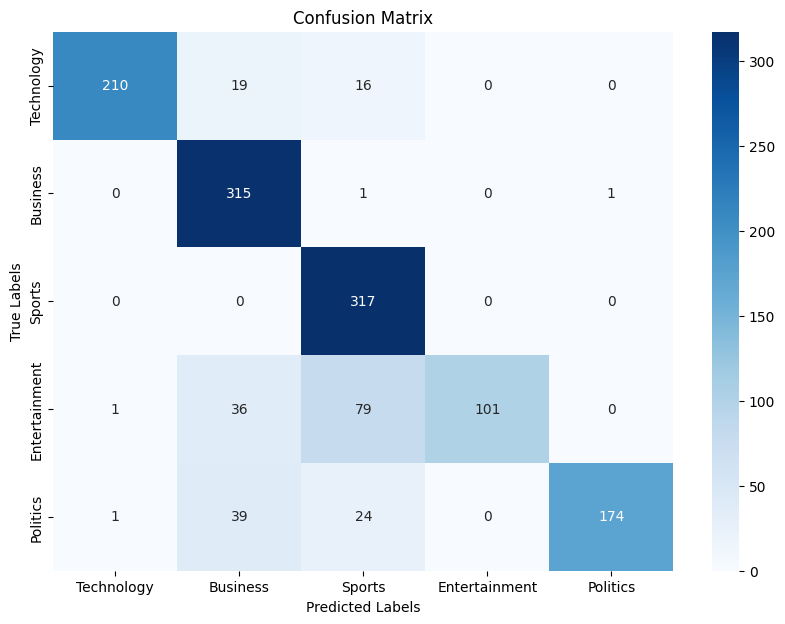

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.86      0.92       245
     Business       0.77      0.99      0.87       317
       Sports       0.73      1.00      0.84       317
Entertainment       1.00      0.47      0.64       217
     Politics       0.99      0.73      0.84       238

     accuracy                           0.84      1334
    macro avg       0.90      0.81      0.82      1334
 weighted avg       0.88      0.84      0.83      1334

Accuracy: 0.8373313343328336
NDCG score with 1st 2 relevant ranks: 0.8694926710965961
==========================Val metrics================================


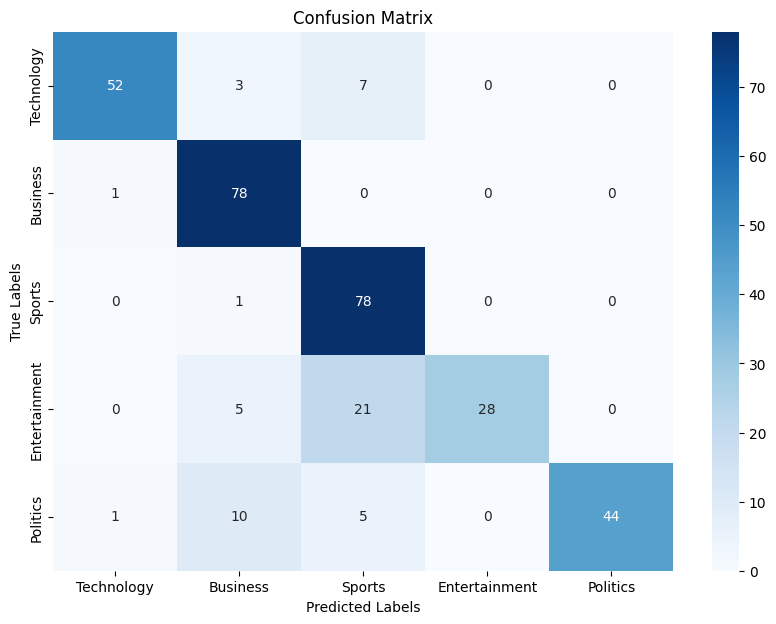

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.84      0.90        62
     Business       0.80      0.99      0.89        79
       Sports       0.70      0.99      0.82        79
Entertainment       1.00      0.52      0.68        54
     Politics       1.00      0.73      0.85        60

     accuracy                           0.84       334
    macro avg       0.89      0.81      0.83       334
 weighted avg       0.88      0.84      0.83       334

Accuracy: 0.8383233532934131
NDCG score with 1st 2 relevant ranks: 0.8779925892964092
============Fold 3=============
==========================Train metrics================================


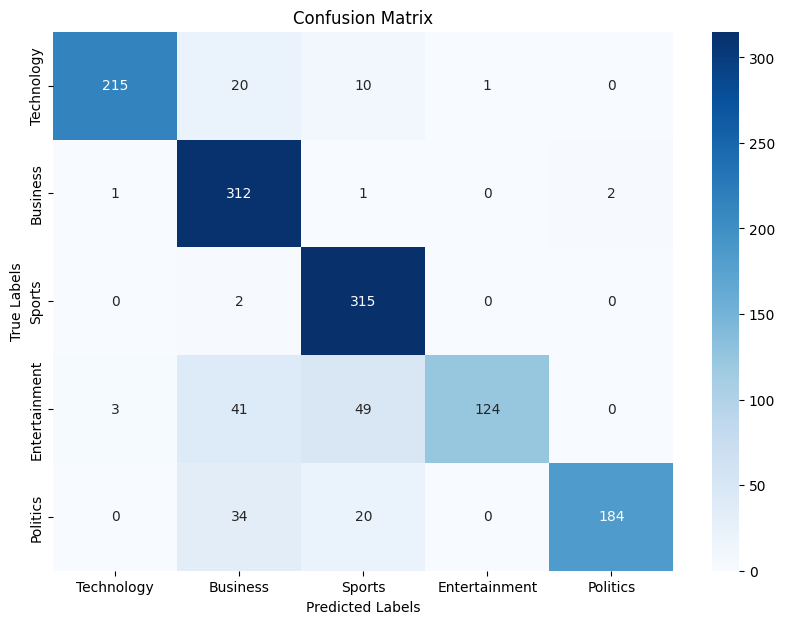

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.87      0.92       246
     Business       0.76      0.99      0.86       316
       Sports       0.80      0.99      0.88       317
Entertainment       0.99      0.57      0.73       217
     Politics       0.99      0.77      0.87       238

     accuracy                           0.86      1334
    macro avg       0.90      0.84      0.85      1334
 weighted avg       0.89      0.86      0.86      1334

Accuracy: 0.8620689655172413
NDCG score with 1st 2 relevant ranks: 0.8871358897595857
==========================Val metrics================================


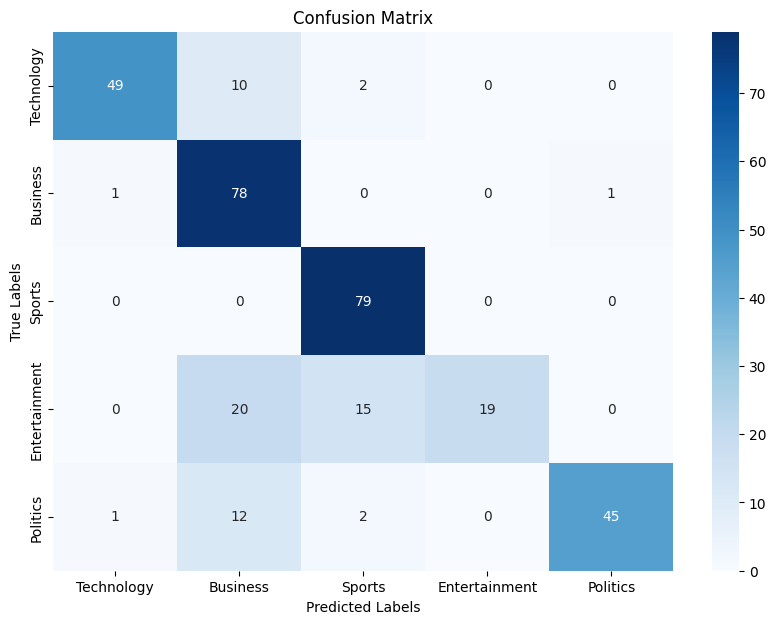

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.80      0.88        61
     Business       0.65      0.97      0.78        80
       Sports       0.81      1.00      0.89        79
Entertainment       1.00      0.35      0.52        54
     Politics       0.98      0.75      0.85        60

     accuracy                           0.81       334
    macro avg       0.88      0.78      0.78       334
 weighted avg       0.86      0.81      0.79       334

Accuracy: 0.8083832335329342
NDCG score with 1st 2 relevant ranks: 0.8461634582976921
============Fold 4=============
==========================Train metrics================================


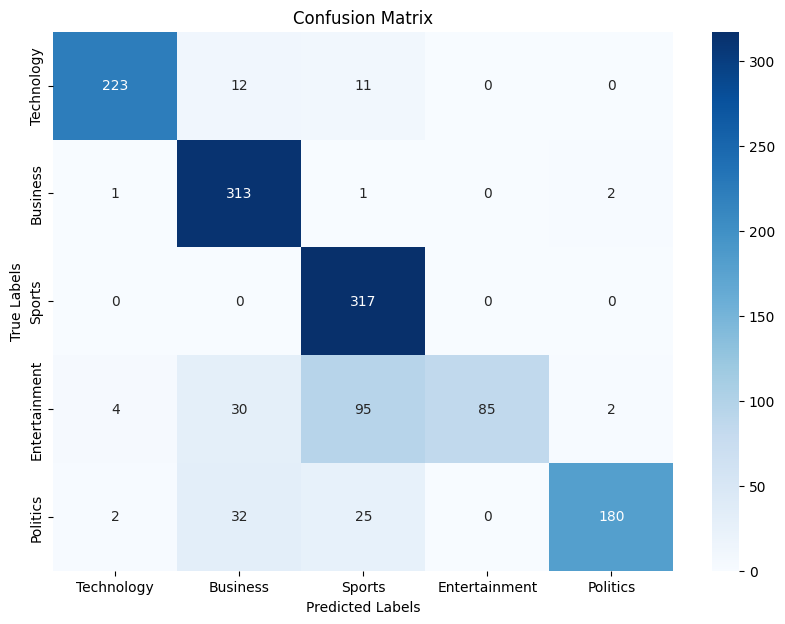

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.91      0.94       246
     Business       0.81      0.99      0.89       317
       Sports       0.71      1.00      0.83       317
Entertainment       1.00      0.39      0.56       216
     Politics       0.98      0.75      0.85       239

     accuracy                           0.84      1335
    macro avg       0.89      0.81      0.81      1335
 weighted avg       0.88      0.84      0.82      1335

Accuracy: 0.8374531835205993
NDCG score with 1st 2 relevant ranks: 0.8686452162814354
==========================Val metrics================================


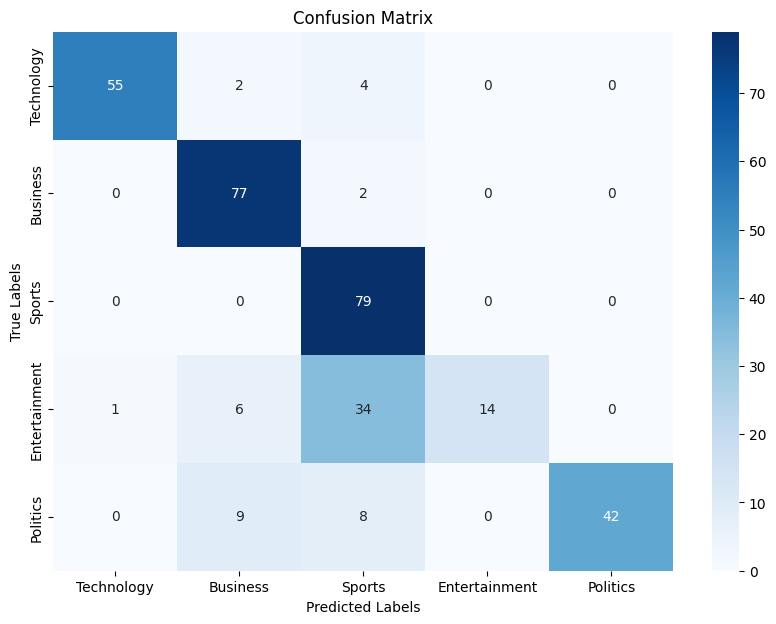

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.90      0.94        61
     Business       0.82      0.97      0.89        79
       Sports       0.62      1.00      0.77        79
Entertainment       1.00      0.25      0.41        55
     Politics       1.00      0.71      0.83        59

     accuracy                           0.80       333
    macro avg       0.88      0.77      0.77       333
 weighted avg       0.86      0.80      0.78       333

Accuracy: 0.8018018018018018
NDCG score with 1st 2 relevant ranks: 0.8359061128056643
============Fold 5=============
==========================Train metrics================================


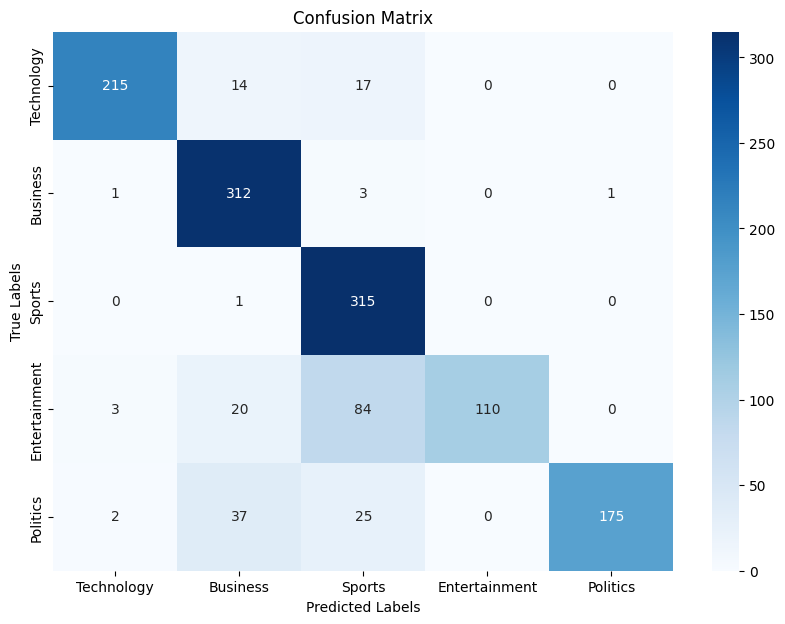

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.87      0.92       246
     Business       0.81      0.98      0.89       317
       Sports       0.71      1.00      0.83       316
Entertainment       1.00      0.51      0.67       217
     Politics       0.99      0.73      0.84       239

     accuracy                           0.84      1335
    macro avg       0.90      0.82      0.83      1335
 weighted avg       0.88      0.84      0.84      1335

Accuracy: 0.8441947565543071
NDCG score with 1st 2 relevant ranks: 0.8734963630872137
==========================Val metrics================================


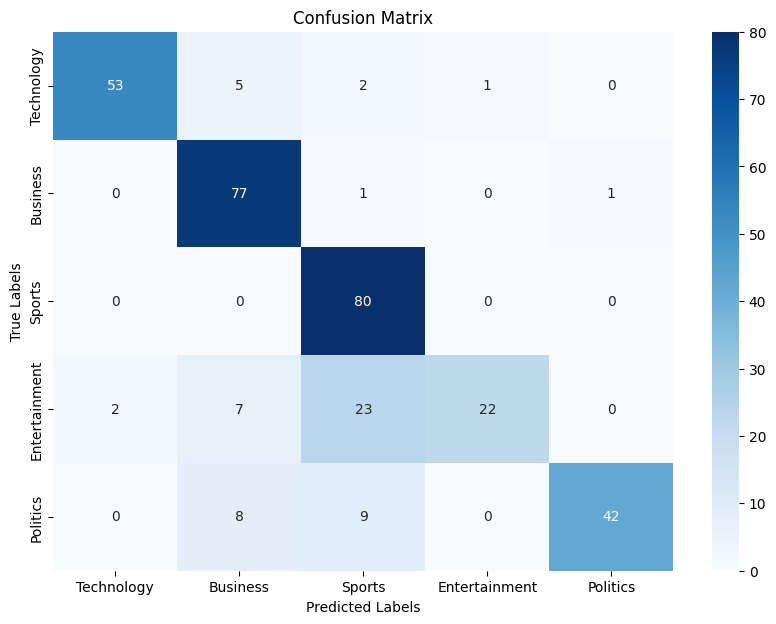

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.87      0.91        61
     Business       0.79      0.97      0.88        79
       Sports       0.70      1.00      0.82        80
Entertainment       0.96      0.41      0.57        54
     Politics       0.98      0.71      0.82        59

     accuracy                           0.82       333
    macro avg       0.88      0.79      0.80       333
 weighted avg       0.86      0.82      0.81       333

Accuracy: 0.8228228228228228
NDCG score with 1st 2 relevant ranks: 0.8626111856606625
==========================End of Folds================================
time taken(mins):  0.22533182303110758
param_dict[best_estimator]:  KNeighborsClassifier(metric='cosine', n_neighbors=7)
param_dict[best_val_accuracy]:  0.9226573879268489
param_dict[best_val_ndcg]:  0.9576574305791133
Iteration: 7
RandomForestClassifier(max_depth=5, n_estimators=200, oob_score=True)
====================

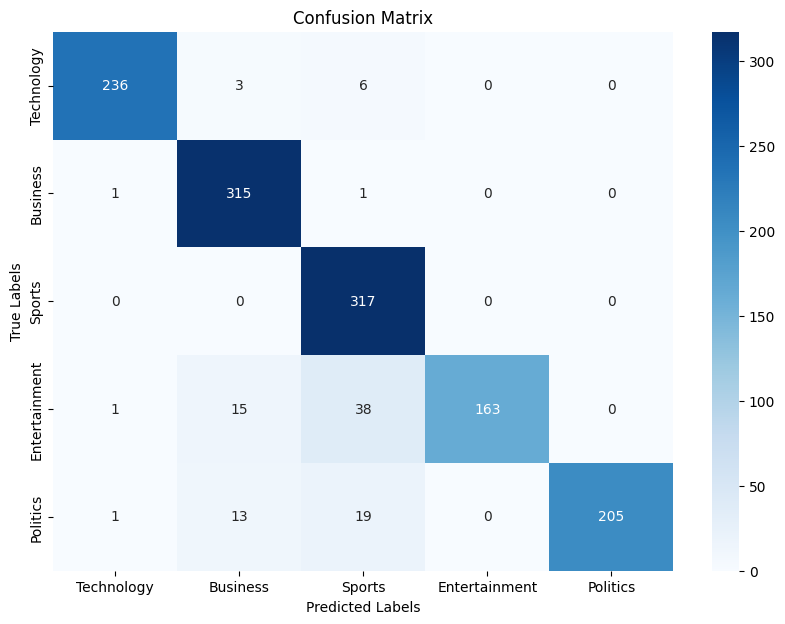

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.96      0.98       245
     Business       0.91      0.99      0.95       317
       Sports       0.83      1.00      0.91       317
Entertainment       1.00      0.75      0.86       217
     Politics       1.00      0.86      0.93       238

     accuracy                           0.93      1334
    macro avg       0.95      0.91      0.92      1334
 weighted avg       0.94      0.93      0.93      1334

Accuracy: 0.9265367316341829
NDCG score with 1st 2 relevant ranks: 0.9464010866941539
==========================Val metrics================================


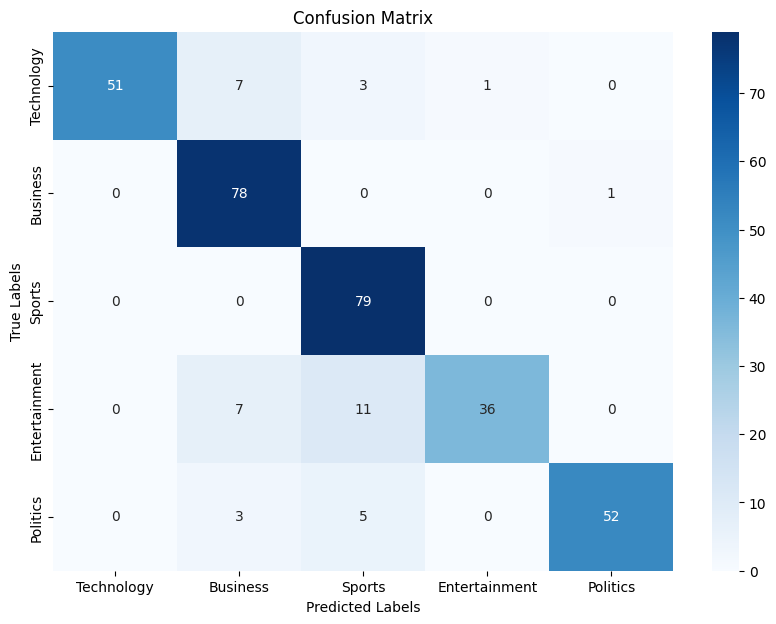

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.82      0.90        62
     Business       0.82      0.99      0.90        79
       Sports       0.81      1.00      0.89        79
Entertainment       0.97      0.67      0.79        54
     Politics       0.98      0.87      0.92        60

     accuracy                           0.89       334
    macro avg       0.92      0.87      0.88       334
 weighted avg       0.90      0.89      0.88       334

Accuracy: 0.8862275449101796
NDCG score with 1st 2 relevant ranks: 0.9126737022455103
============Fold 2=============
==========================Train metrics================================


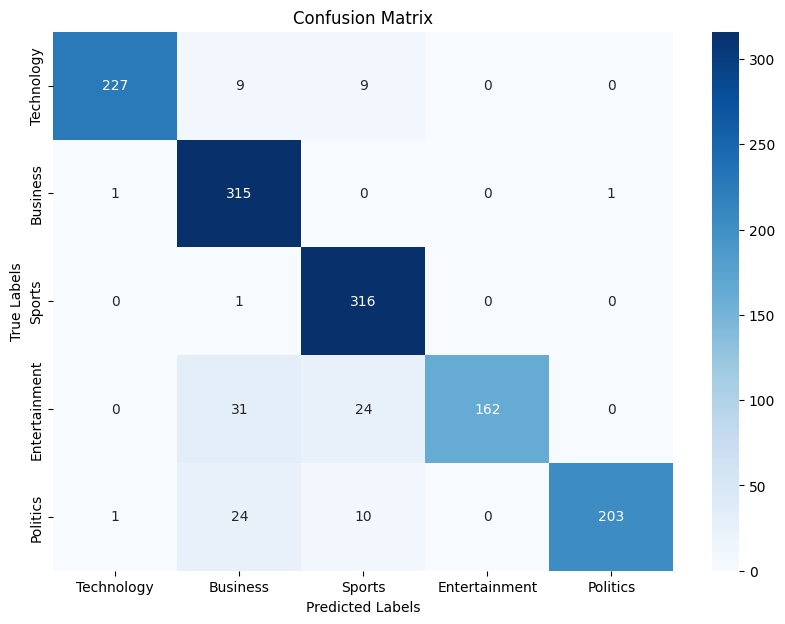

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.93      0.96       245
     Business       0.83      0.99      0.90       317
       Sports       0.88      1.00      0.93       317
Entertainment       1.00      0.75      0.85       217
     Politics       1.00      0.85      0.92       238

     accuracy                           0.92      1334
    macro avg       0.94      0.90      0.91      1334
 weighted avg       0.93      0.92      0.92      1334

Accuracy: 0.9167916041979011
NDCG score with 1st 2 relevant ranks: 0.9399666851012004
==========================Val metrics================================


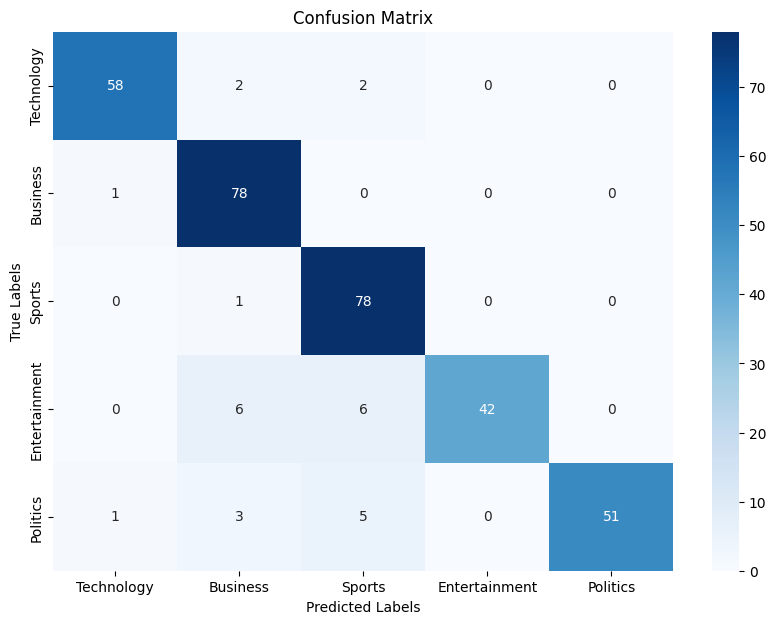

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.94      0.95        62
     Business       0.87      0.99      0.92        79
       Sports       0.86      0.99      0.92        79
Entertainment       1.00      0.78      0.88        54
     Politics       1.00      0.85      0.92        60

     accuracy                           0.92       334
    macro avg       0.94      0.91      0.92       334
 weighted avg       0.93      0.92      0.92       334

Accuracy: 0.9191616766467066
NDCG score with 1st 2 relevant ranks: 0.9418298115055614
============Fold 3=============
==========================Train metrics================================


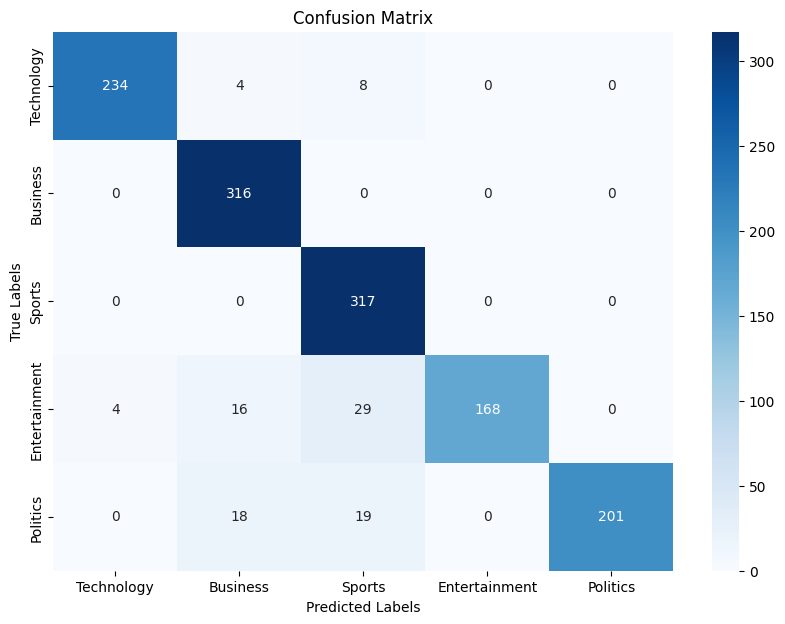

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.95      0.97       246
     Business       0.89      1.00      0.94       316
       Sports       0.85      1.00      0.92       317
Entertainment       1.00      0.77      0.87       217
     Politics       1.00      0.84      0.92       238

     accuracy                           0.93      1334
    macro avg       0.95      0.91      0.92      1334
 weighted avg       0.94      0.93      0.93      1334

Accuracy: 0.9265367316341829
NDCG score with 1st 2 relevant ranks: 0.9473470083636762
==========================Val metrics================================


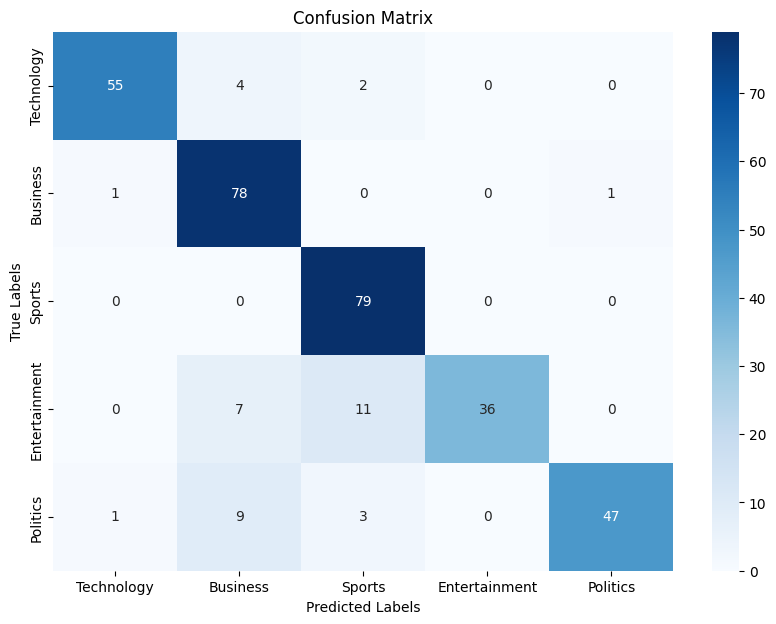

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.90      0.93        61
     Business       0.80      0.97      0.88        80
       Sports       0.83      1.00      0.91        79
Entertainment       1.00      0.67      0.80        54
     Politics       0.98      0.78      0.87        60

     accuracy                           0.88       334
    macro avg       0.91      0.87      0.88       334
 weighted avg       0.90      0.88      0.88       334

Accuracy: 0.8832335329341318
NDCG score with 1st 2 relevant ranks: 0.9172357352224139
============Fold 4=============
==========================Train metrics================================


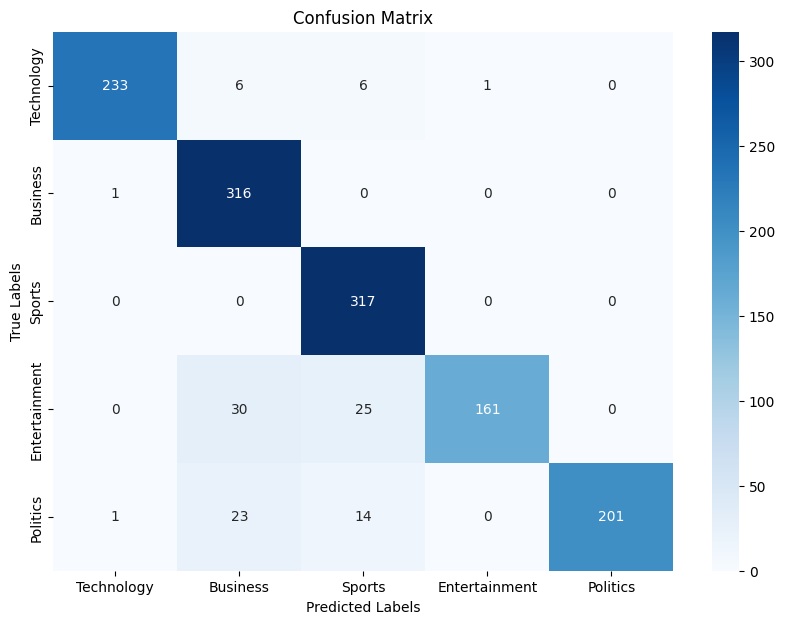

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.95      0.97       246
     Business       0.84      1.00      0.91       317
       Sports       0.88      1.00      0.93       317
Entertainment       0.99      0.75      0.85       216
     Politics       1.00      0.84      0.91       239

     accuracy                           0.92      1335
    macro avg       0.94      0.91      0.92      1335
 weighted avg       0.93      0.92      0.92      1335

Accuracy: 0.9198501872659176
NDCG score with 1st 2 relevant ranks: 0.9415900888871064
==========================Val metrics================================


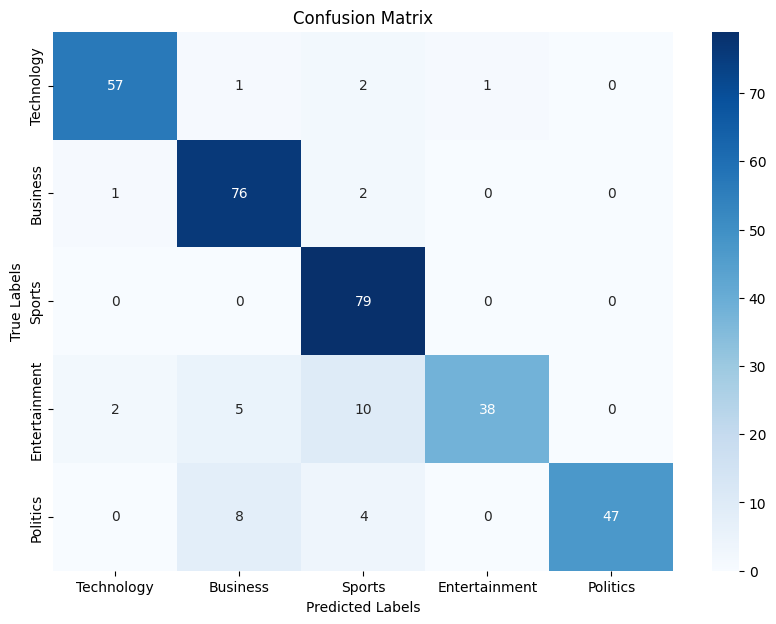

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.93      0.94        61
     Business       0.84      0.96      0.90        79
       Sports       0.81      1.00      0.90        79
Entertainment       0.97      0.69      0.81        55
     Politics       1.00      0.80      0.89        59

     accuracy                           0.89       333
    macro avg       0.92      0.88      0.89       333
 weighted avg       0.91      0.89      0.89       333

Accuracy: 0.8918918918918919
NDCG score with 1st 2 relevant ranks: 0.9184174671171184
============Fold 5=============
==========================Train metrics================================


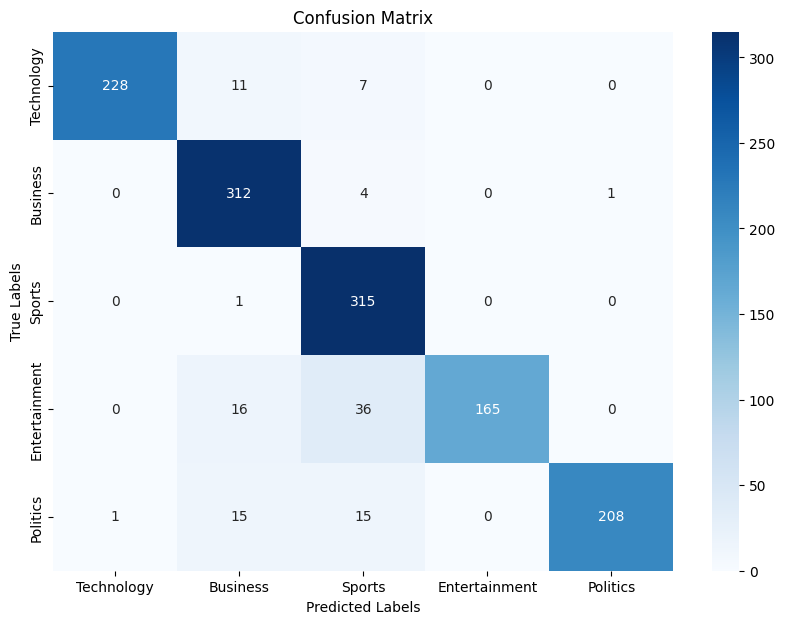

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.93      0.96       246
     Business       0.88      0.98      0.93       317
       Sports       0.84      1.00      0.91       316
Entertainment       1.00      0.76      0.86       217
     Politics       1.00      0.87      0.93       239

     accuracy                           0.92      1335
    macro avg       0.94      0.91      0.92      1335
 weighted avg       0.93      0.92      0.92      1335

Accuracy: 0.9198501872659176
NDCG score with 1st 2 relevant ranks: 0.9453709413429654
==========================Val metrics================================


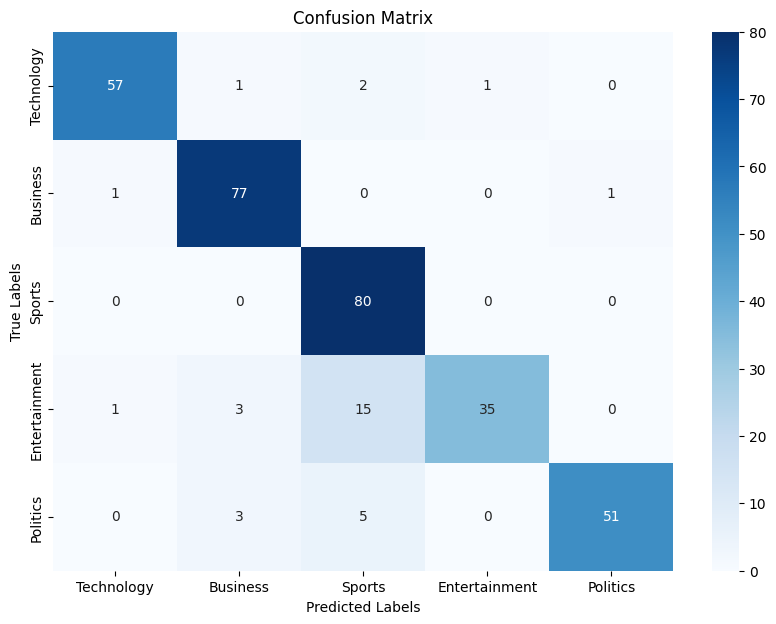

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.93      0.95        61
     Business       0.92      0.97      0.94        79
       Sports       0.78      1.00      0.88        80
Entertainment       0.97      0.65      0.78        54
     Politics       0.98      0.86      0.92        59

     accuracy                           0.90       333
    macro avg       0.92      0.88      0.89       333
 weighted avg       0.91      0.90      0.90       333

Accuracy: 0.9009009009009009
NDCG score with 1st 2 relevant ranks: 0.9312158440154454
==========================End of Folds================================
time taken(mins):  0.23311998844146728
param_dict[best_estimator]:  KNeighborsClassifier(metric='cosine', n_neighbors=7)
param_dict[best_val_accuracy]:  0.9226573879268489
param_dict[best_val_ndcg]:  0.9576574305791133
Iteration: 8
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylev

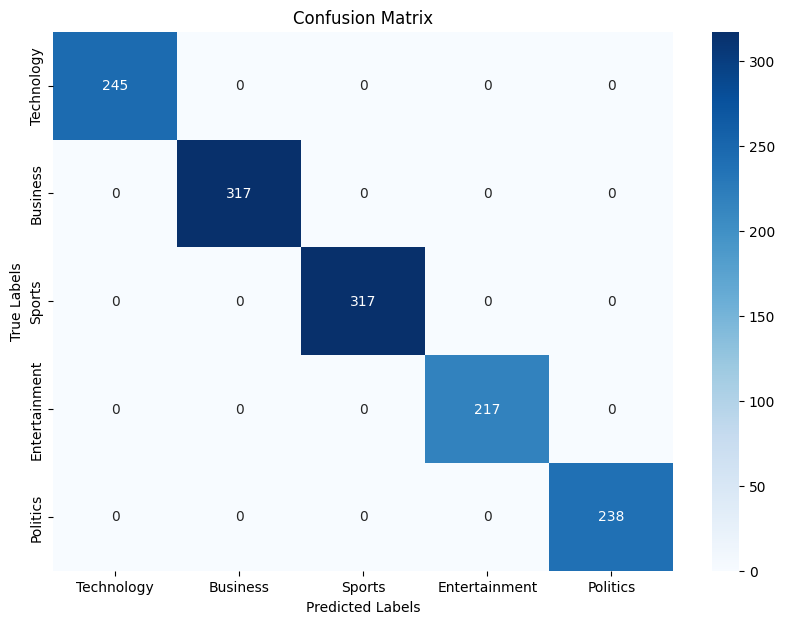

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


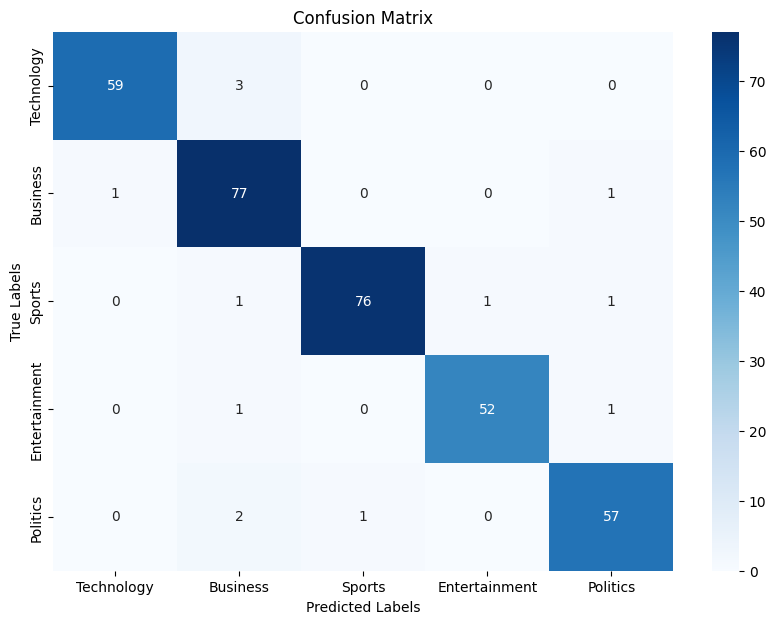

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.95      0.97        62
     Business       0.92      0.97      0.94        79
       Sports       0.99      0.96      0.97        79
Entertainment       0.98      0.96      0.97        54
     Politics       0.95      0.95      0.95        60

     accuracy                           0.96       334
    macro avg       0.96      0.96      0.96       334
 weighted avg       0.96      0.96      0.96       334

Accuracy: 0.9610778443113772
NDCG score with 1st 2 relevant ranks: 0.9780789454555182
============Fold 2=============
==========================Train metrics================================


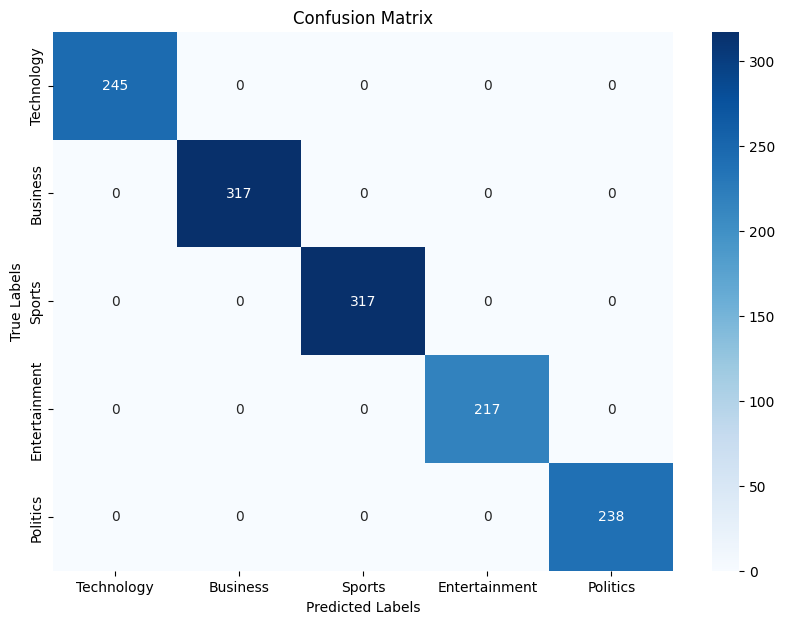

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


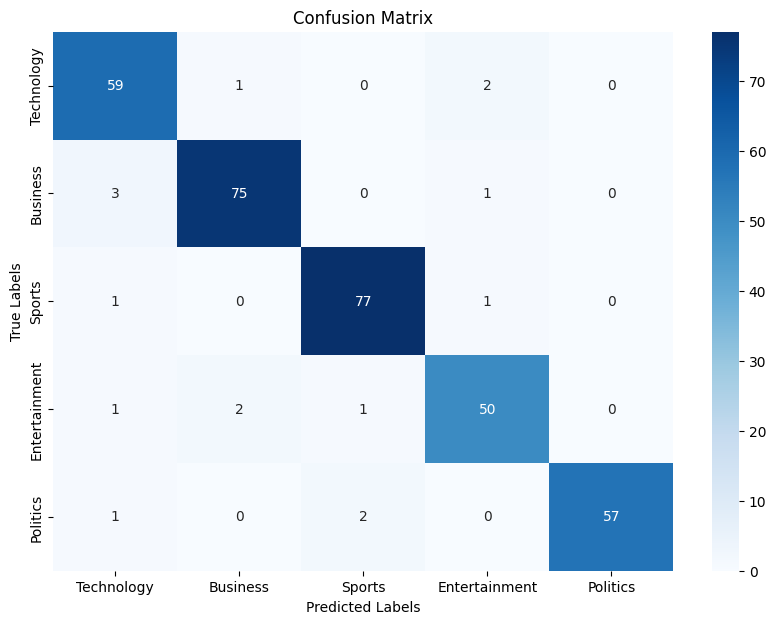

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.95      0.93        62
     Business       0.96      0.95      0.96        79
       Sports       0.96      0.97      0.97        79
Entertainment       0.93      0.93      0.93        54
     Politics       1.00      0.95      0.97        60

     accuracy                           0.95       334
    macro avg       0.95      0.95      0.95       334
 weighted avg       0.95      0.95      0.95       334

Accuracy: 0.9520958083832335
NDCG score with 1st 2 relevant ranks: 0.9728749320038504
============Fold 3=============
==========================Train metrics================================


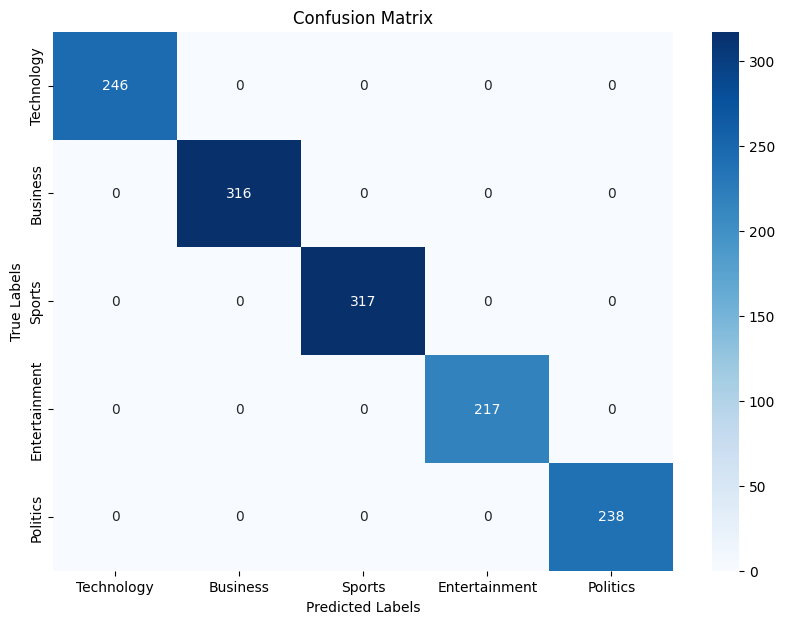

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       316
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


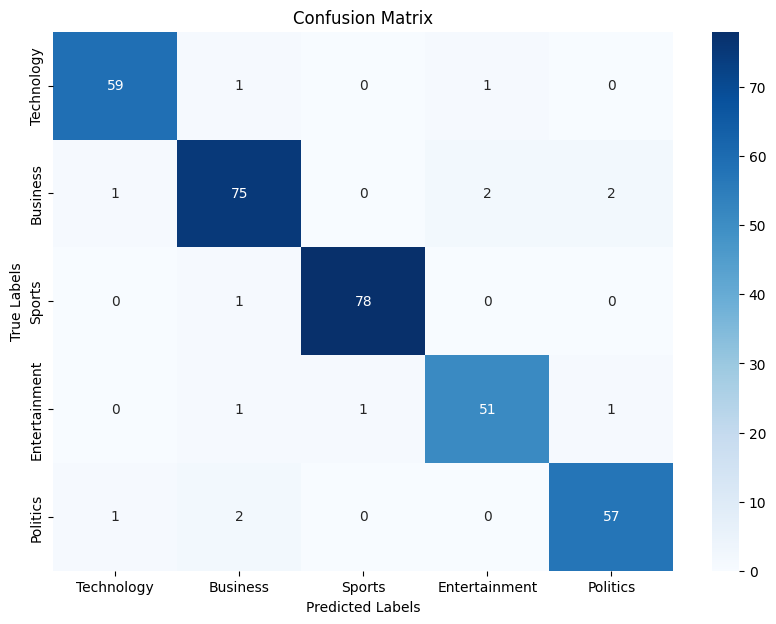

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.97      0.97        61
     Business       0.94      0.94      0.94        80
       Sports       0.99      0.99      0.99        79
Entertainment       0.94      0.94      0.94        54
     Politics       0.95      0.95      0.95        60

     accuracy                           0.96       334
    macro avg       0.96      0.96      0.96       334
 weighted avg       0.96      0.96      0.96       334

Accuracy: 0.9580838323353293
NDCG score with 1st 2 relevant ranks: 0.9769739447177083
============Fold 4=============
==========================Train metrics================================


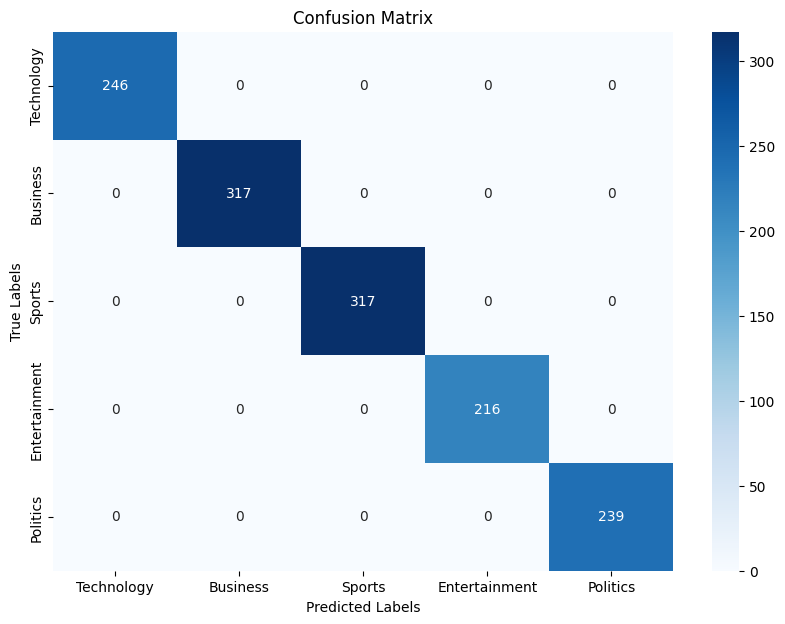

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       216
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


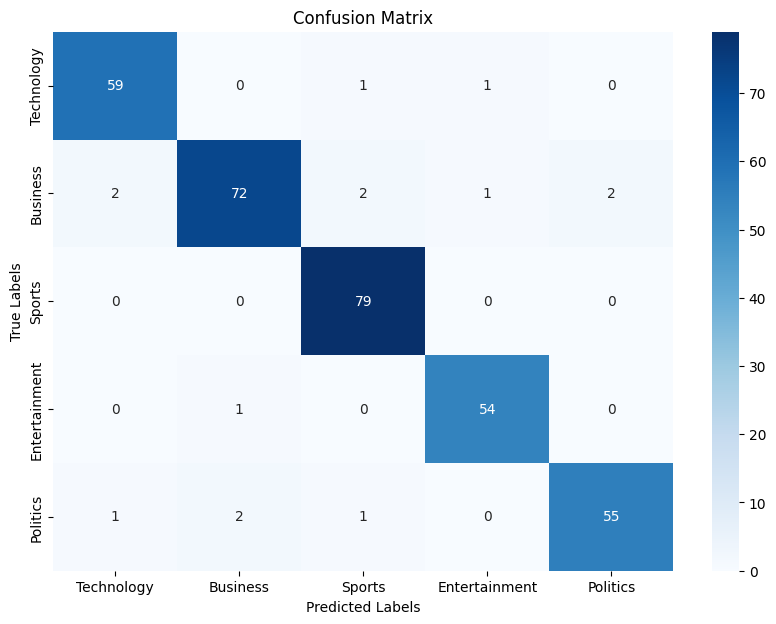

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.97      0.96        61
     Business       0.96      0.91      0.94        79
       Sports       0.95      1.00      0.98        79
Entertainment       0.96      0.98      0.97        55
     Politics       0.96      0.93      0.95        59

     accuracy                           0.96       333
    macro avg       0.96      0.96      0.96       333
 weighted avg       0.96      0.96      0.96       333

Accuracy: 0.9579579579579579
NDCG score with 1st 2 relevant ranks: 0.9787994813492074
============Fold 5=============
==========================Train metrics================================


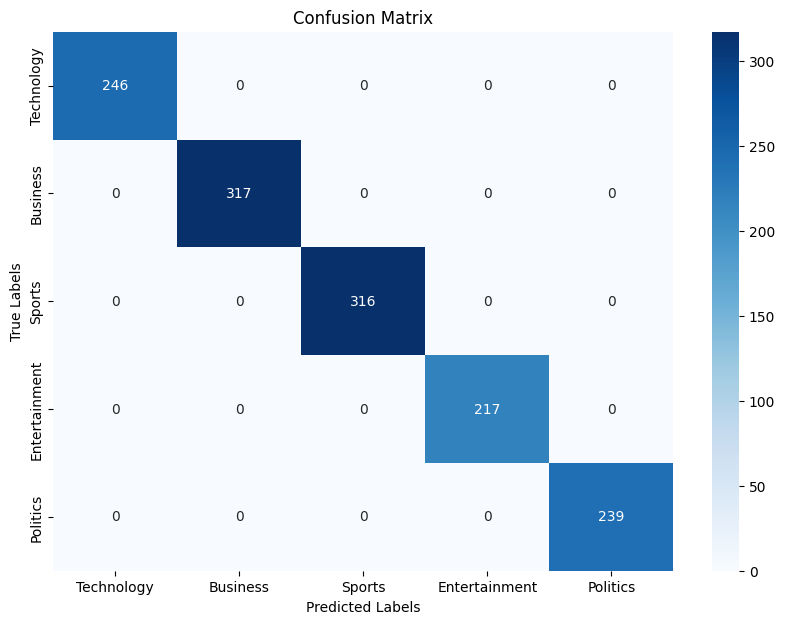

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       316
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


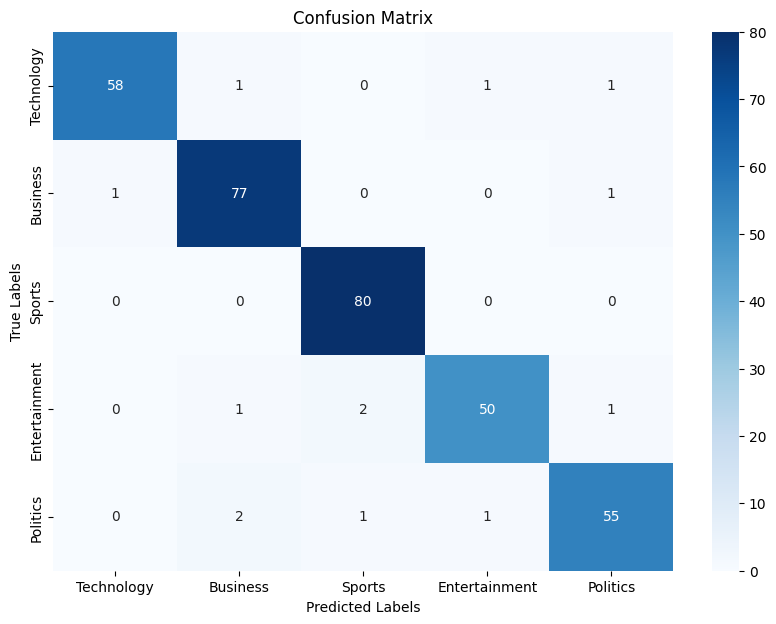

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.95      0.97        61
     Business       0.95      0.97      0.96        79
       Sports       0.96      1.00      0.98        80
Entertainment       0.96      0.93      0.94        54
     Politics       0.95      0.93      0.94        59

     accuracy                           0.96       333
    macro avg       0.96      0.96      0.96       333
 weighted avg       0.96      0.96      0.96       333

Accuracy: 0.960960960960961
NDCG score with 1st 2 relevant ranks: 0.9780131164628924
==========================End of Folds================================
time taken(mins):  1.4485915263493856
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, 

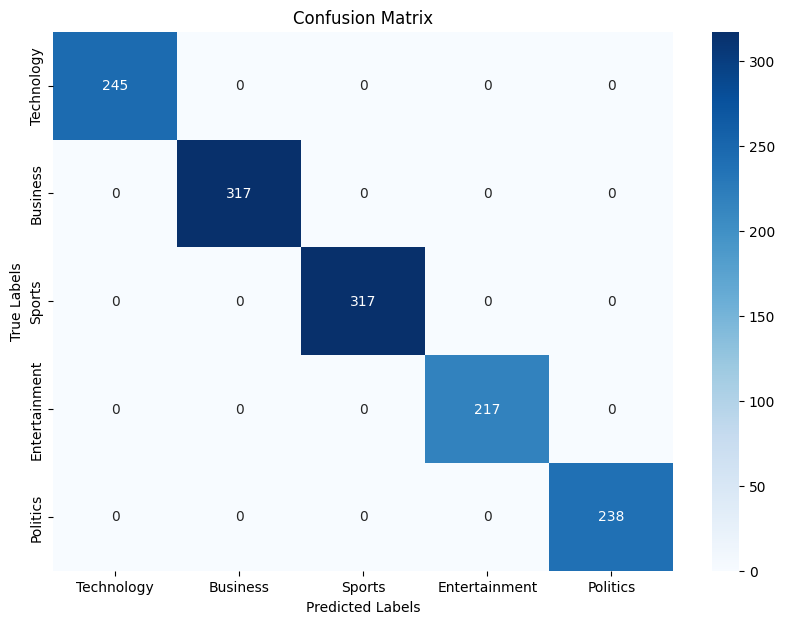

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


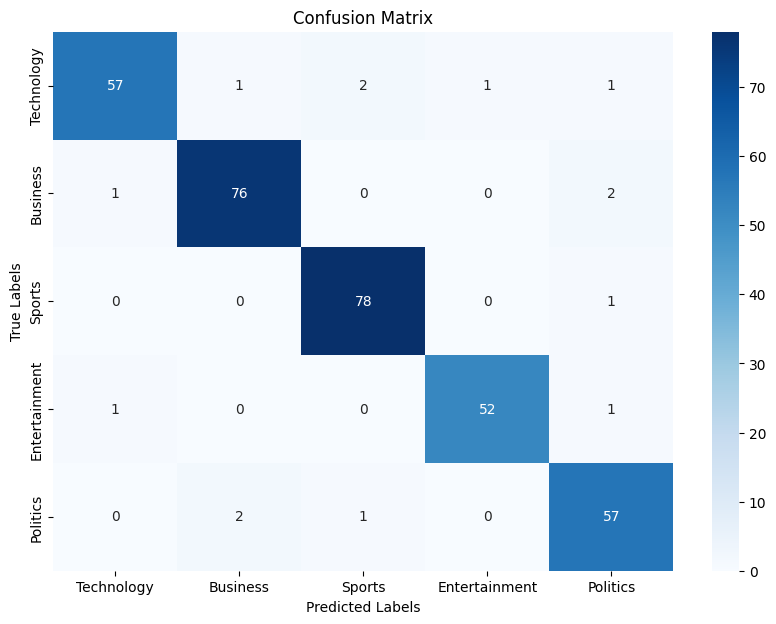

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.92      0.94        62
     Business       0.96      0.96      0.96        79
       Sports       0.96      0.99      0.97        79
Entertainment       0.98      0.96      0.97        54
     Politics       0.92      0.95      0.93        60

     accuracy                           0.96       334
    macro avg       0.96      0.96      0.96       334
 weighted avg       0.96      0.96      0.96       334

Accuracy: 0.9580838323353293
NDCG score with 1st 2 relevant ranks: 0.9788629559559462
============Fold 2=============
==========================Train metrics================================


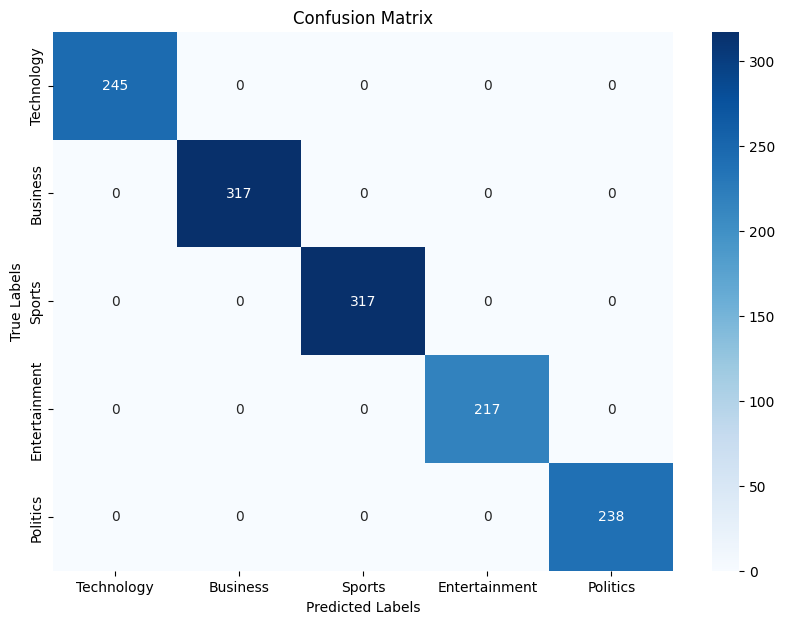

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       245
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


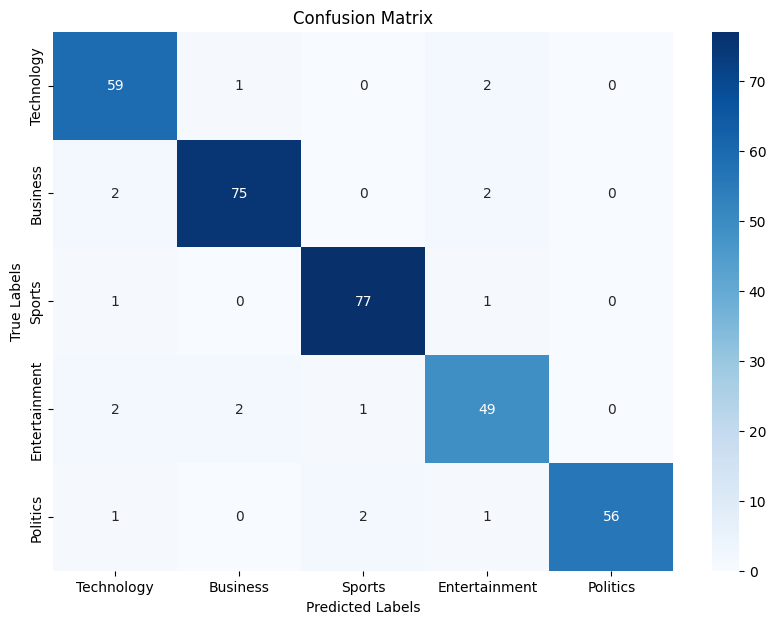

Classification Report:
               precision    recall  f1-score   support

   Technology       0.91      0.95      0.93        62
     Business       0.96      0.95      0.96        79
       Sports       0.96      0.97      0.97        79
Entertainment       0.89      0.91      0.90        54
     Politics       1.00      0.93      0.97        60

     accuracy                           0.95       334
    macro avg       0.94      0.94      0.94       334
 weighted avg       0.95      0.95      0.95       334

Accuracy: 0.9461077844311377
NDCG score with 1st 2 relevant ranks: 0.9744429530047061
============Fold 3=============
==========================Train metrics================================


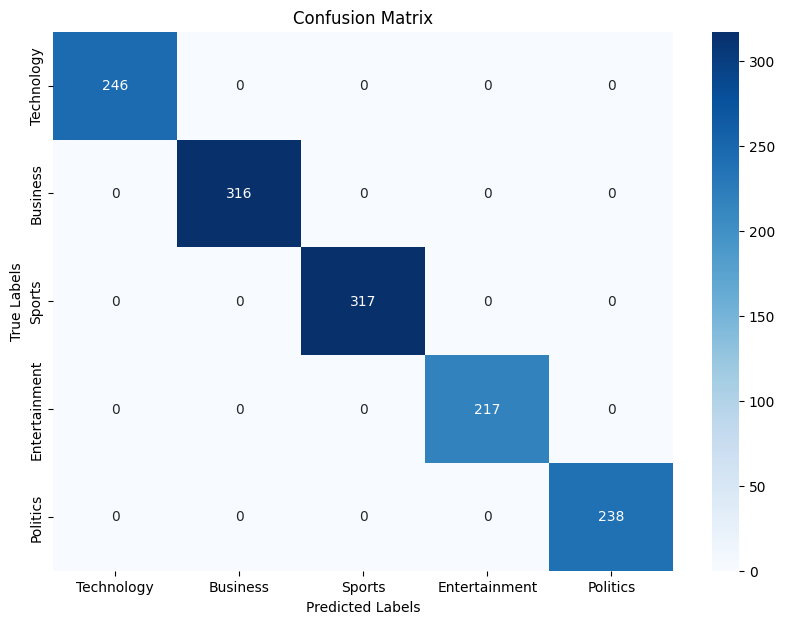

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       316
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       238

     accuracy                           1.00      1334
    macro avg       1.00      1.00      1.00      1334
 weighted avg       1.00      1.00      1.00      1334

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


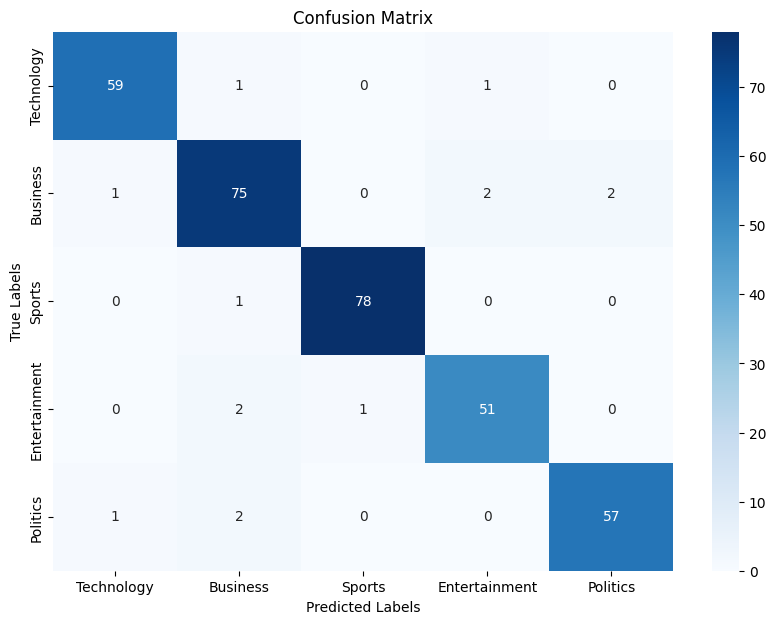

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.97      0.97        61
     Business       0.93      0.94      0.93        80
       Sports       0.99      0.99      0.99        79
Entertainment       0.94      0.94      0.94        54
     Politics       0.97      0.95      0.96        60

     accuracy                           0.96       334
    macro avg       0.96      0.96      0.96       334
 weighted avg       0.96      0.96      0.96       334

Accuracy: 0.9580838323353293
NDCG score with 1st 2 relevant ranks: 0.9769739447177083
============Fold 4=============
==========================Train metrics================================


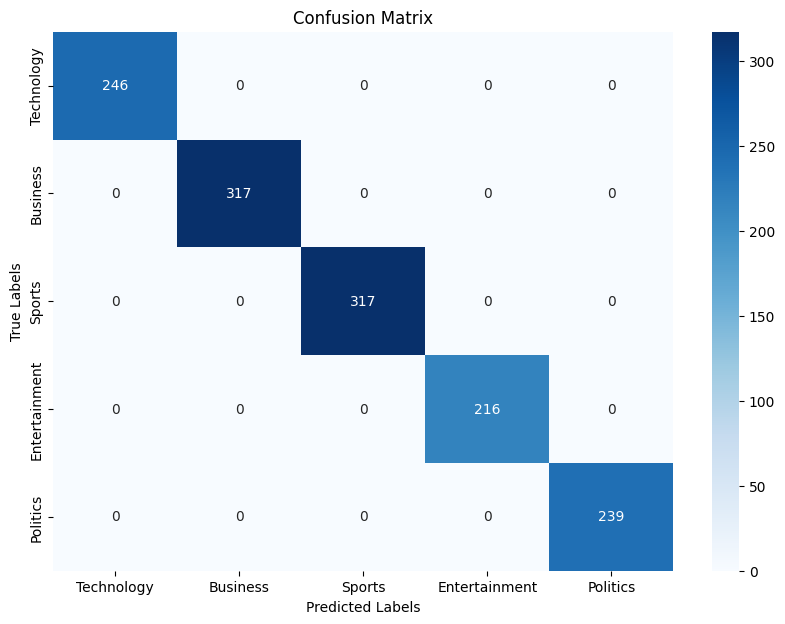

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       317
Entertainment       1.00      1.00      1.00       216
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


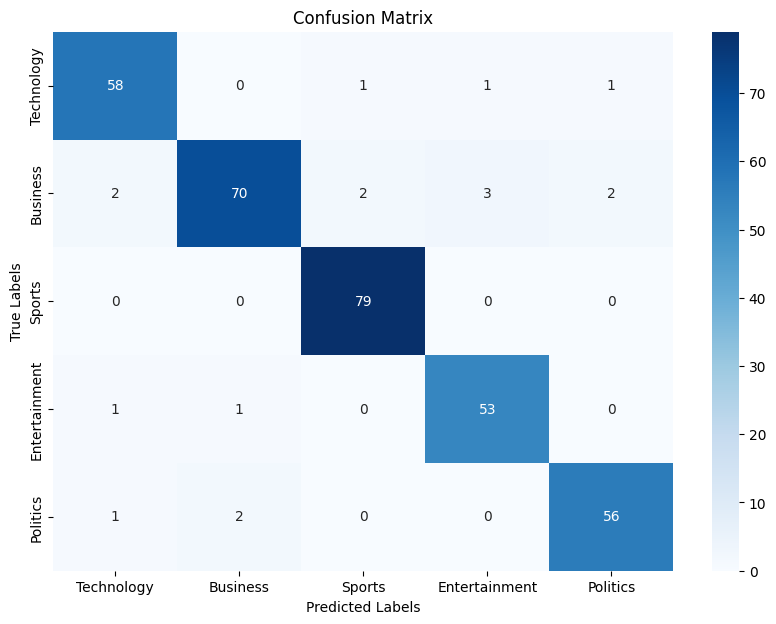

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.95      0.94        61
     Business       0.96      0.89      0.92        79
       Sports       0.96      1.00      0.98        79
Entertainment       0.93      0.96      0.95        55
     Politics       0.95      0.95      0.95        59

     accuracy                           0.95       333
    macro avg       0.95      0.95      0.95       333
 weighted avg       0.95      0.95      0.95       333

Accuracy: 0.948948948948949
NDCG score with 1st 2 relevant ranks: 0.9754745241741752
============Fold 5=============
==========================Train metrics================================


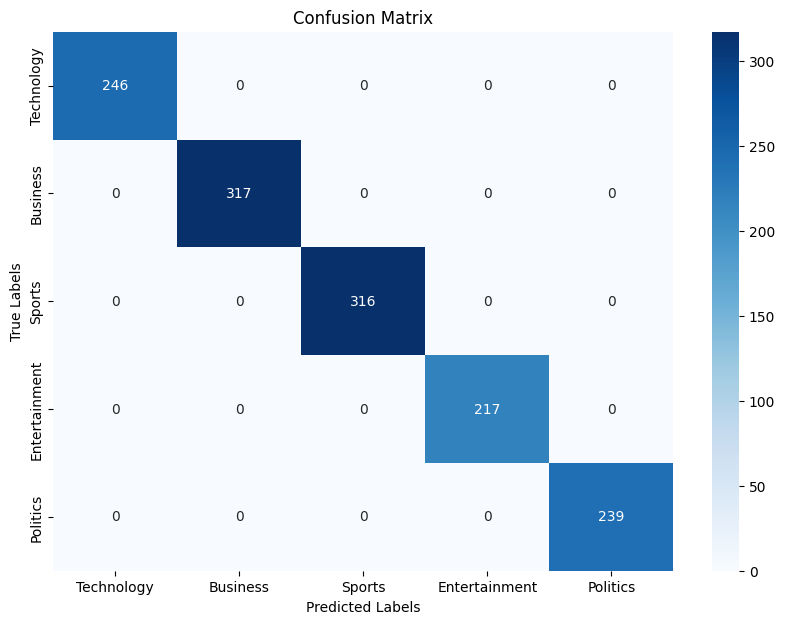

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      1.00      1.00       246
     Business       1.00      1.00      1.00       317
       Sports       1.00      1.00      1.00       316
Entertainment       1.00      1.00      1.00       217
     Politics       1.00      1.00      1.00       239

     accuracy                           1.00      1335
    macro avg       1.00      1.00      1.00      1335
 weighted avg       1.00      1.00      1.00      1335

Accuracy: 1.0
NDCG score with 1st 2 relevant ranks: 1.0
==========================Val metrics================================


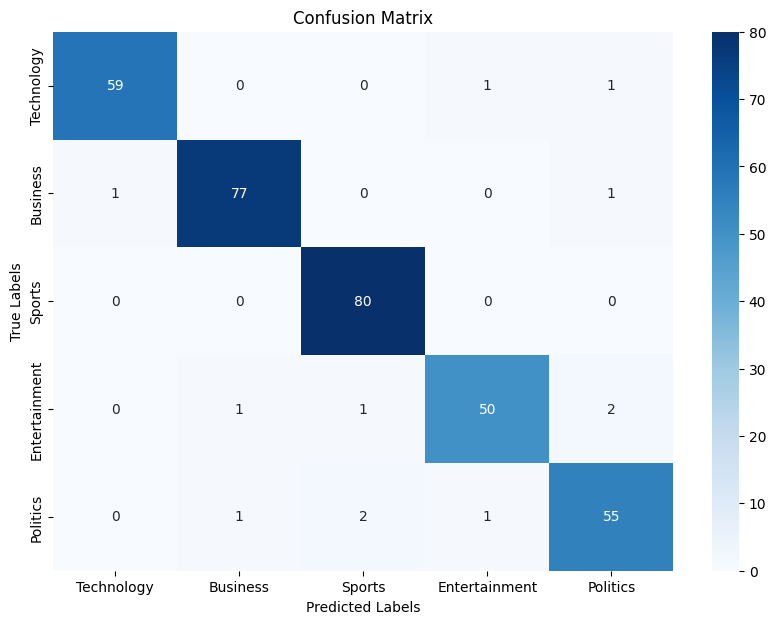

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.97      0.98        61
     Business       0.97      0.97      0.97        79
       Sports       0.96      1.00      0.98        80
Entertainment       0.96      0.93      0.94        54
     Politics       0.93      0.93      0.93        59

     accuracy                           0.96       333
    macro avg       0.96      0.96      0.96       333
 weighted avg       0.96      0.96      0.96       333

Accuracy: 0.963963963963964
NDCG score with 1st 2 relevant ranks: 0.9753320676319182
==========================End of Folds================================
time taken(mins):  1.5207523703575134
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, 

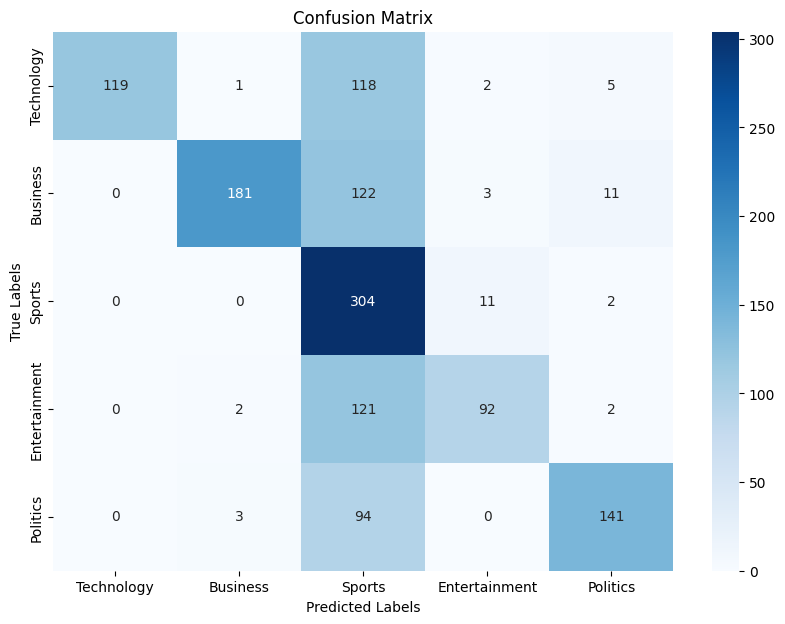

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.49      0.65       245
     Business       0.97      0.57      0.72       317
       Sports       0.40      0.96      0.57       317
Entertainment       0.85      0.42      0.57       217
     Politics       0.88      0.59      0.71       238

     accuracy                           0.63      1334
    macro avg       0.82      0.61      0.64      1334
 weighted avg       0.80      0.63      0.64      1334

Accuracy: 0.6274362818590704
NDCG score with 1st 2 relevant ranks: 0.6979074462384912
==========================Val metrics================================


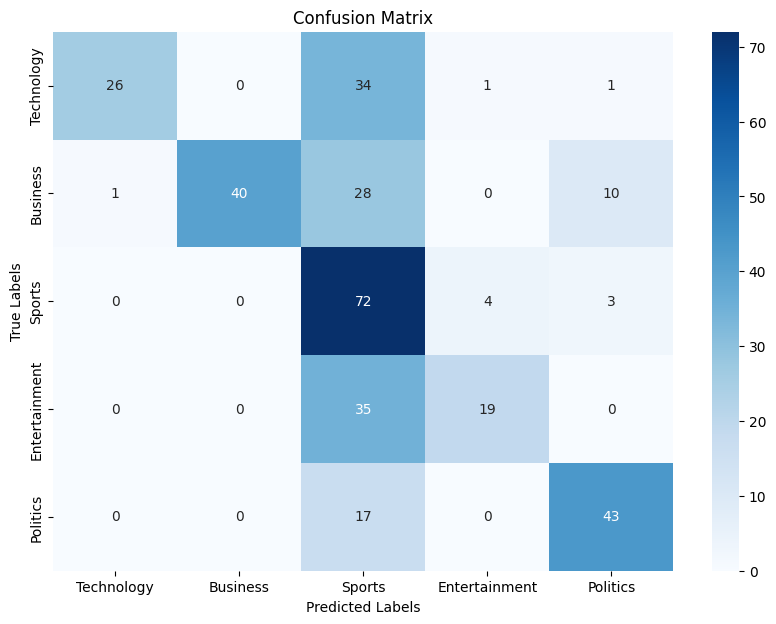

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.42      0.58        62
     Business       1.00      0.51      0.67        79
       Sports       0.39      0.91      0.54        79
Entertainment       0.79      0.35      0.49        54
     Politics       0.75      0.72      0.74        60

     accuracy                           0.60       334
    macro avg       0.78      0.58      0.60       334
 weighted avg       0.77      0.60      0.61       334

Accuracy: 0.5988023952095808
NDCG score with 1st 2 relevant ranks: 0.6781408672155725
============Fold 2=============
==========================Train metrics================================


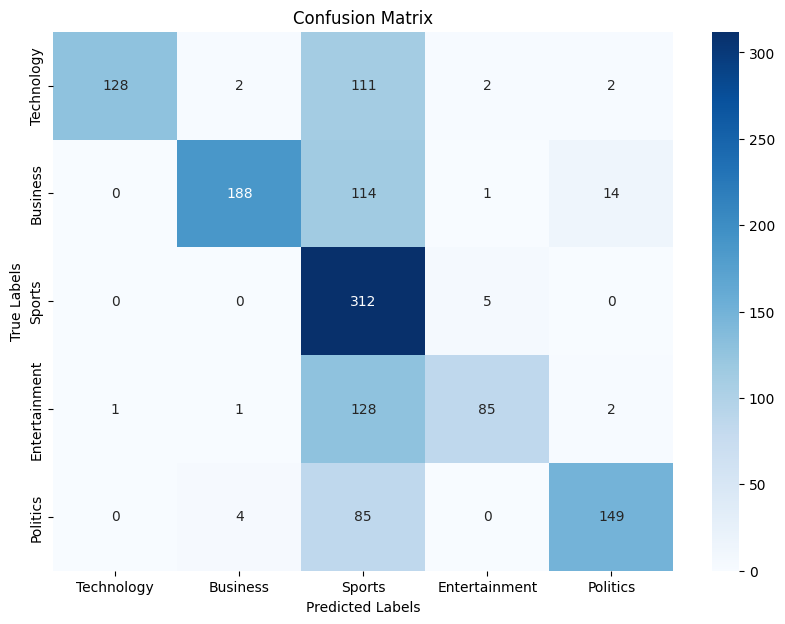

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.52      0.68       245
     Business       0.96      0.59      0.73       317
       Sports       0.42      0.98      0.58       317
Entertainment       0.91      0.39      0.55       217
     Politics       0.89      0.63      0.74       238

     accuracy                           0.65      1334
    macro avg       0.84      0.62      0.66      1334
 weighted avg       0.82      0.65      0.66      1334

Accuracy: 0.6461769115442278
NDCG score with 1st 2 relevant ranks: 0.7185399192626934
==========================Val metrics================================


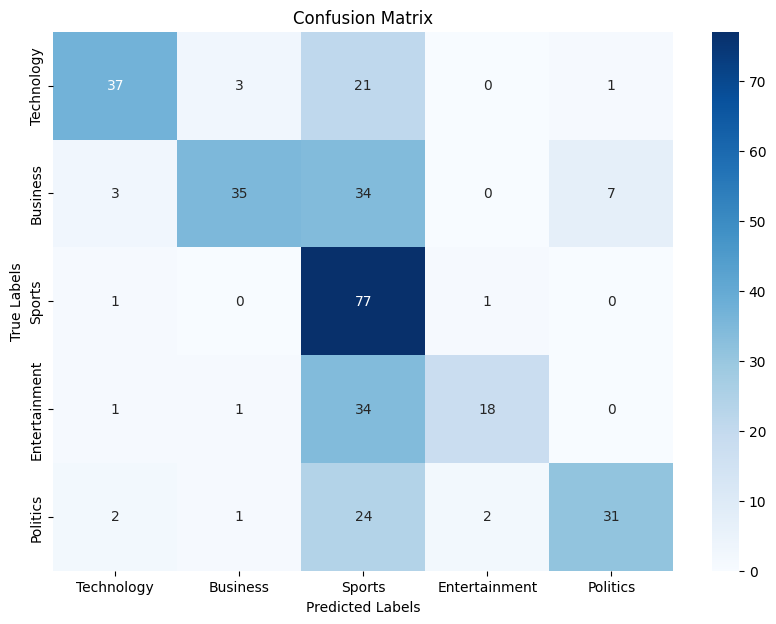

Classification Report:
               precision    recall  f1-score   support

   Technology       0.84      0.60      0.70        62
     Business       0.88      0.44      0.59        79
       Sports       0.41      0.97      0.57        79
Entertainment       0.86      0.33      0.48        54
     Politics       0.79      0.52      0.63        60

     accuracy                           0.59       334
    macro avg       0.75      0.57      0.59       334
 weighted avg       0.74      0.59      0.59       334

Accuracy: 0.592814371257485
NDCG score with 1st 2 relevant ranks: 0.6759308657399525
============Fold 3=============
==========================Train metrics================================


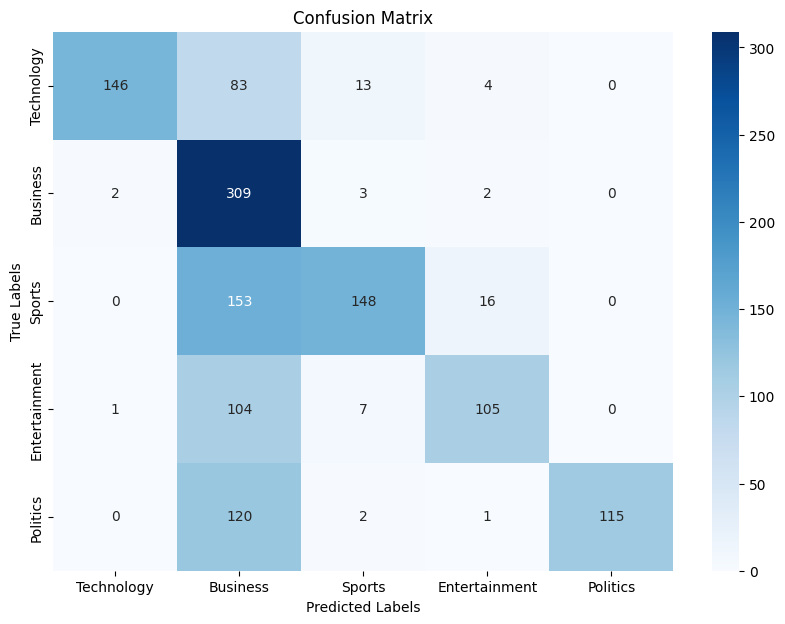

Classification Report:
               precision    recall  f1-score   support

   Technology       0.98      0.59      0.74       246
     Business       0.40      0.98      0.57       316
       Sports       0.86      0.47      0.60       317
Entertainment       0.82      0.48      0.61       217
     Politics       1.00      0.48      0.65       238

     accuracy                           0.62      1334
    macro avg       0.81      0.60      0.63      1334
 weighted avg       0.79      0.62      0.63      1334

Accuracy: 0.6169415292353823
NDCG score with 1st 2 relevant ranks: 0.7063311270052515
==========================Val metrics================================


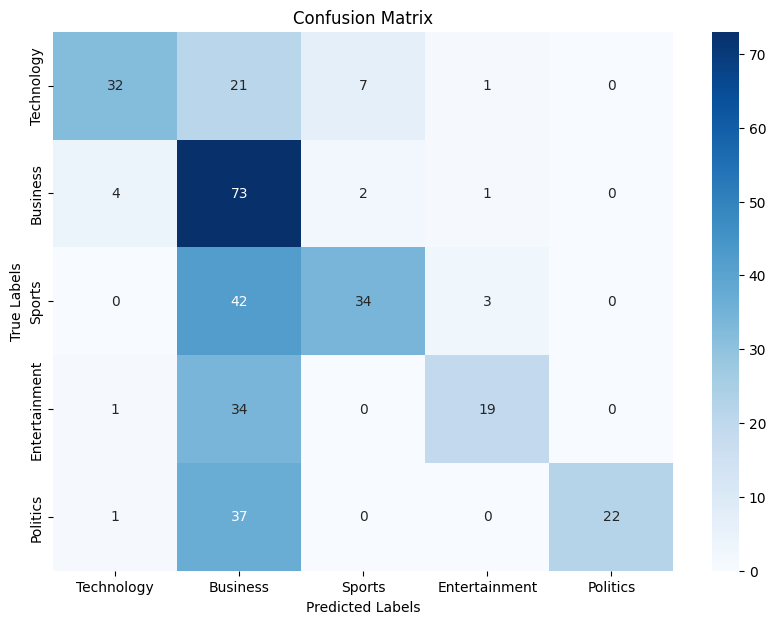

Classification Report:
               precision    recall  f1-score   support

   Technology       0.84      0.52      0.65        61
     Business       0.35      0.91      0.51        80
       Sports       0.79      0.43      0.56        79
Entertainment       0.79      0.35      0.49        54
     Politics       1.00      0.37      0.54        60

     accuracy                           0.54       334
    macro avg       0.76      0.52      0.55       334
 weighted avg       0.73      0.54      0.55       334

Accuracy: 0.5389221556886228
NDCG score with 1st 2 relevant ranks: 0.667269820049191
============Fold 4=============
==========================Train metrics================================


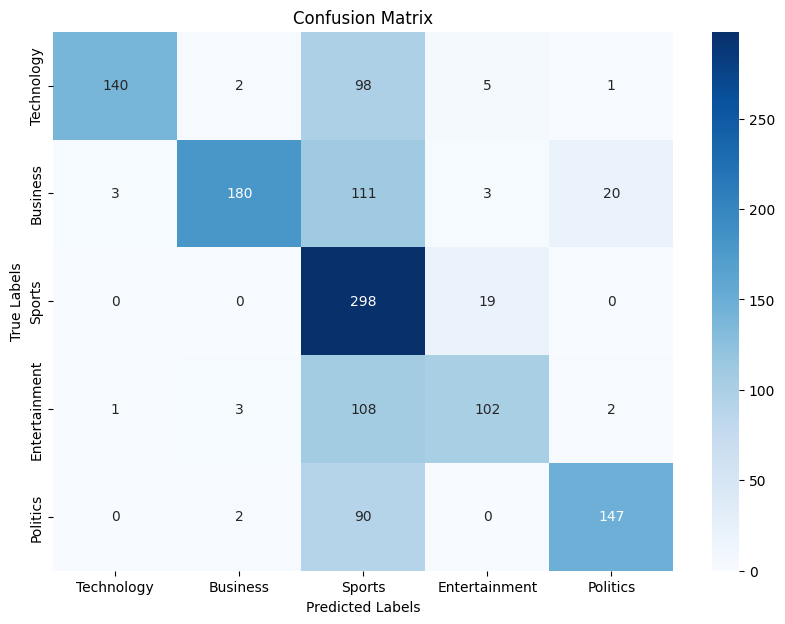

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.57      0.72       246
     Business       0.96      0.57      0.71       317
       Sports       0.42      0.94      0.58       317
Entertainment       0.79      0.47      0.59       216
     Politics       0.86      0.62      0.72       239

     accuracy                           0.65      1335
    macro avg       0.80      0.63      0.67      1335
 weighted avg       0.79      0.65      0.66      1335

Accuracy: 0.6494382022471911
NDCG score with 1st 2 relevant ranks: 0.72316482513644
==========================Val metrics================================


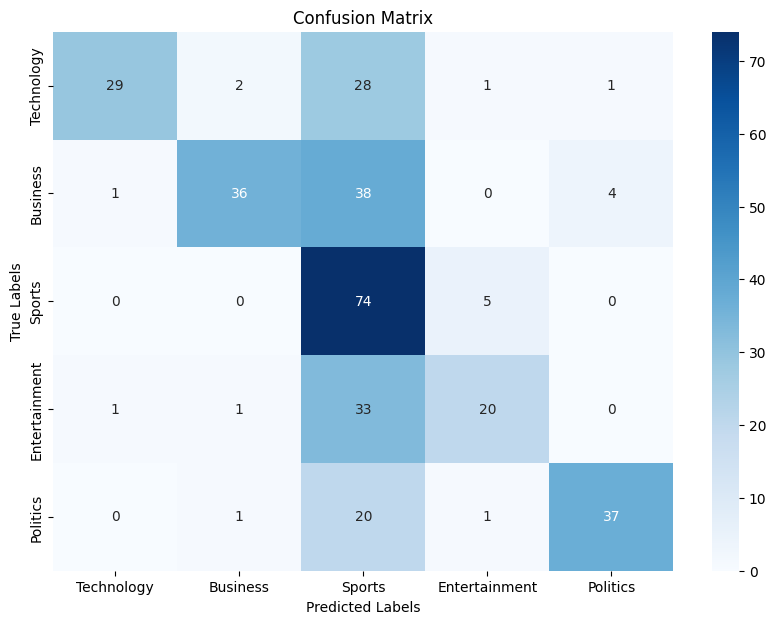

Classification Report:
               precision    recall  f1-score   support

   Technology       0.94      0.48      0.63        61
     Business       0.90      0.46      0.61        79
       Sports       0.38      0.94      0.54        79
Entertainment       0.74      0.36      0.49        55
     Politics       0.88      0.63      0.73        59

     accuracy                           0.59       333
    macro avg       0.77      0.57      0.60       333
 weighted avg       0.75      0.59      0.60       333

Accuracy: 0.5885885885885885
NDCG score with 1st 2 relevant ranks: 0.675744050042904
============Fold 5=============
==========================Train metrics================================


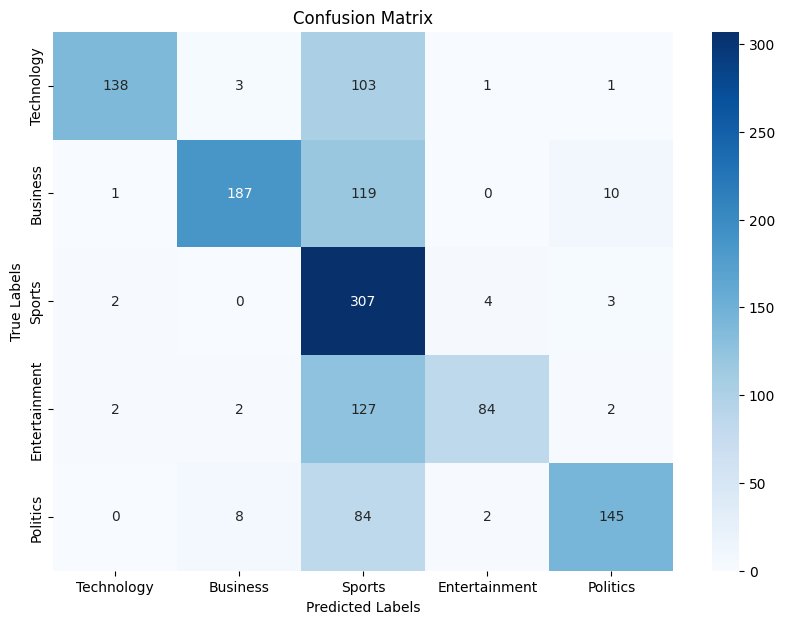

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.56      0.71       246
     Business       0.94      0.59      0.72       317
       Sports       0.41      0.97      0.58       316
Entertainment       0.92      0.39      0.55       217
     Politics       0.90      0.61      0.72       239

     accuracy                           0.64      1335
    macro avg       0.83      0.62      0.66      1335
 weighted avg       0.81      0.64      0.66      1335

Accuracy: 0.6449438202247191
NDCG score with 1st 2 relevant ranks: 0.7181978365569857
==========================Val metrics================================


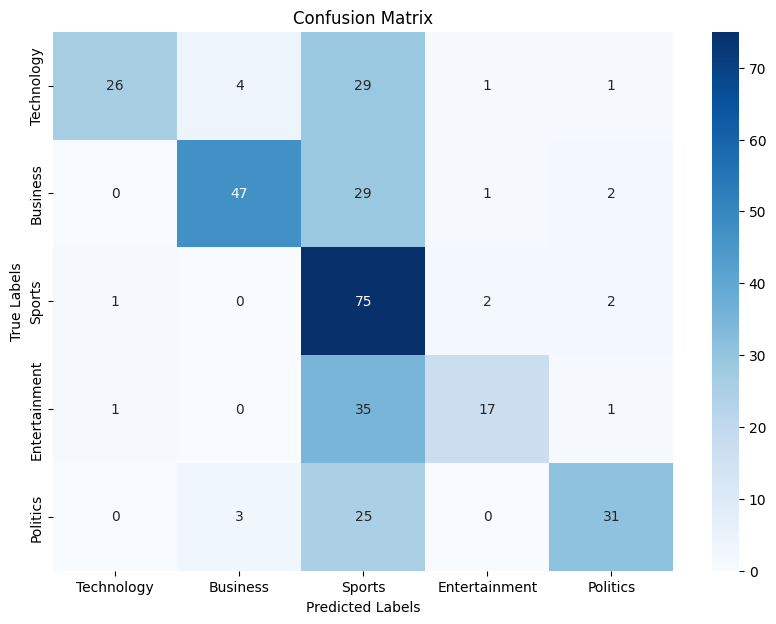

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.43      0.58        61
     Business       0.87      0.59      0.71        79
       Sports       0.39      0.94      0.55        80
Entertainment       0.81      0.31      0.45        54
     Politics       0.84      0.53      0.65        59

     accuracy                           0.59       333
    macro avg       0.77      0.56      0.59       333
 weighted avg       0.75      0.59      0.59       333

Accuracy: 0.5885885885885885
NDCG score with 1st 2 relevant ranks: 0.668165314264268
==========================End of Folds================================
time taken(mins):  0.07651592493057251
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0,

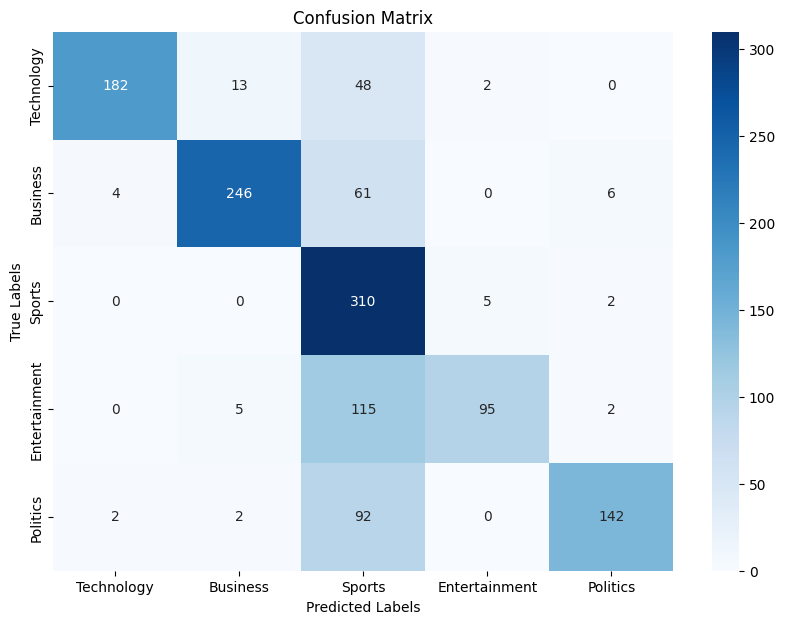

Classification Report:
               precision    recall  f1-score   support

   Technology       0.97      0.74      0.84       245
     Business       0.92      0.78      0.84       317
       Sports       0.50      0.98      0.66       317
Entertainment       0.93      0.44      0.60       217
     Politics       0.93      0.60      0.73       238

     accuracy                           0.73      1334
    macro avg       0.85      0.71      0.73      1334
 weighted avg       0.83      0.73      0.74      1334

Accuracy: 0.7308845577211395
NDCG score with 1st 2 relevant ranks: 0.8008827612657989
==========================Val metrics================================


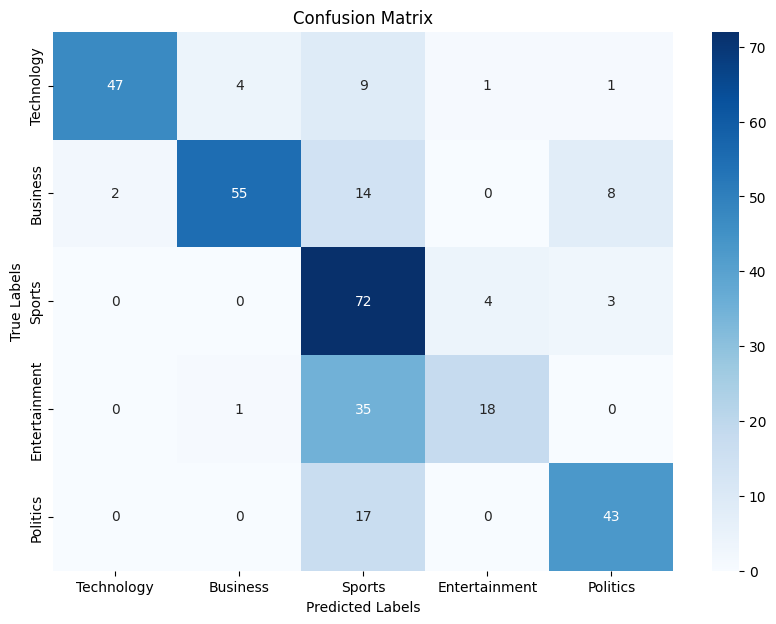

Classification Report:
               precision    recall  f1-score   support

   Technology       0.96      0.76      0.85        62
     Business       0.92      0.70      0.79        79
       Sports       0.49      0.91      0.64        79
Entertainment       0.78      0.33      0.47        54
     Politics       0.78      0.72      0.75        60

     accuracy                           0.70       334
    macro avg       0.79      0.68      0.70       334
 weighted avg       0.78      0.70      0.71       334

Accuracy: 0.7035928143712575
NDCG score with 1st 2 relevant ranks: 0.7999323875213903
============Fold 2=============
==========================Train metrics================================


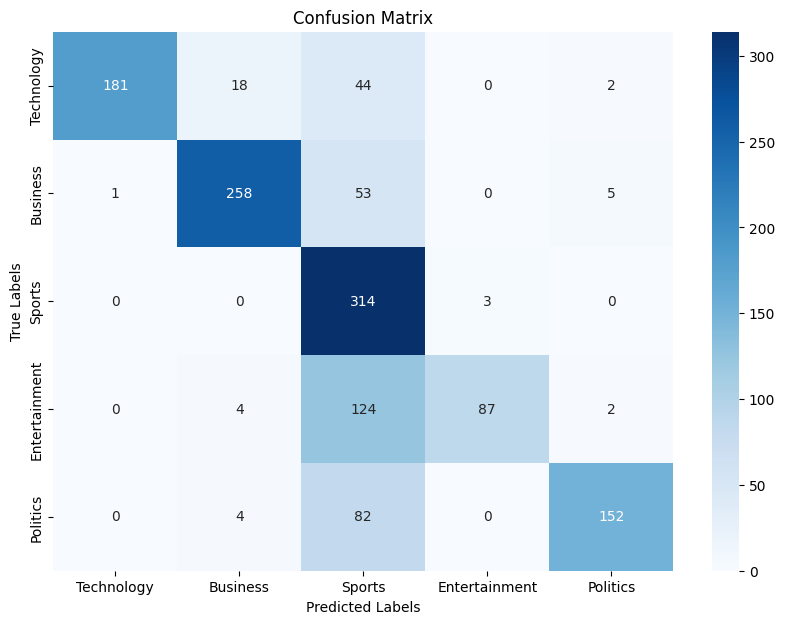

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.74      0.85       245
     Business       0.91      0.81      0.86       317
       Sports       0.51      0.99      0.67       317
Entertainment       0.97      0.40      0.57       217
     Politics       0.94      0.64      0.76       238

     accuracy                           0.74      1334
    macro avg       0.86      0.72      0.74      1334
 weighted avg       0.85      0.74      0.75      1334

Accuracy: 0.7436281859070465
NDCG score with 1st 2 relevant ranks: 0.815991193625512
==========================Val metrics================================


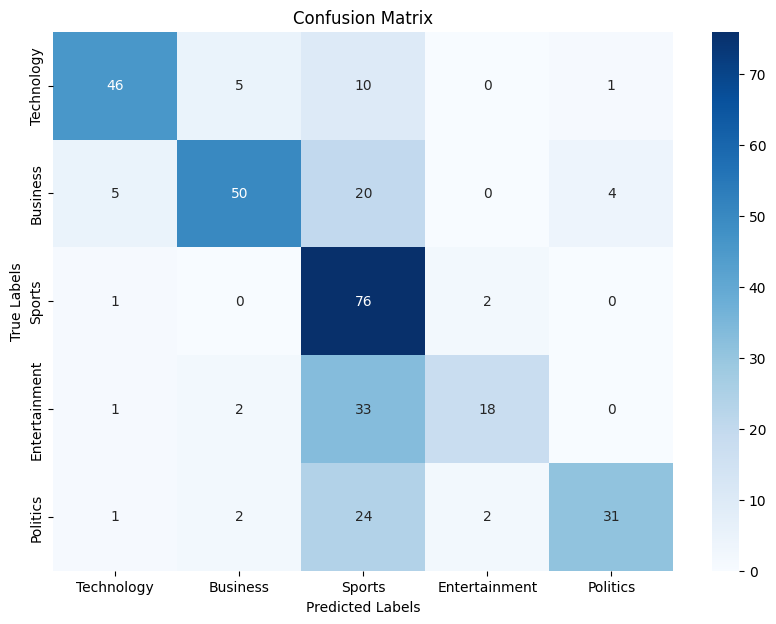

Classification Report:
               precision    recall  f1-score   support

   Technology       0.85      0.74      0.79        62
     Business       0.85      0.63      0.72        79
       Sports       0.47      0.96      0.63        79
Entertainment       0.82      0.33      0.47        54
     Politics       0.86      0.52      0.65        60

     accuracy                           0.66       334
    macro avg       0.77      0.64      0.65       334
 weighted avg       0.76      0.66      0.66       334

Accuracy: 0.6616766467065869
NDCG score with 1st 2 relevant ranks: 0.7391261074743407
============Fold 3=============
==========================Train metrics================================


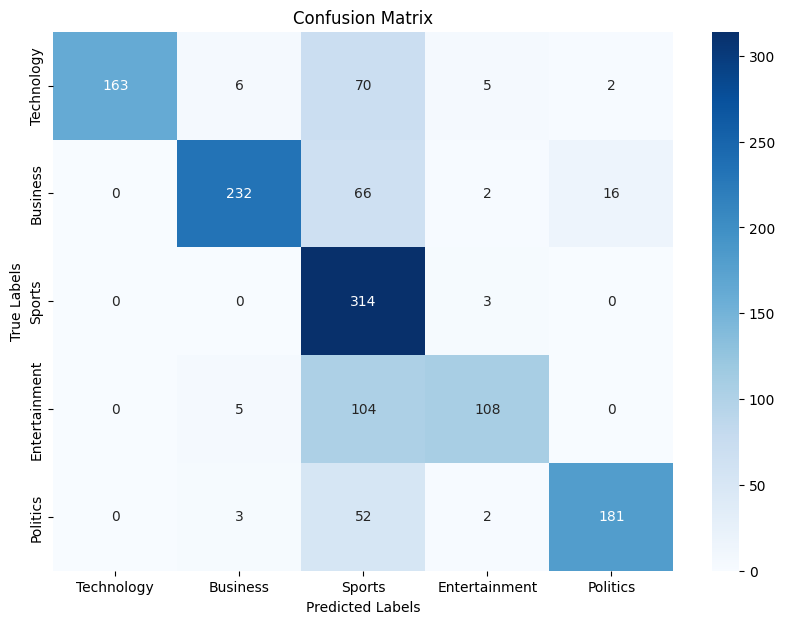

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.66      0.80       246
     Business       0.94      0.73      0.83       316
       Sports       0.52      0.99      0.68       317
Entertainment       0.90      0.50      0.64       217
     Politics       0.91      0.76      0.83       238

     accuracy                           0.75      1334
    macro avg       0.85      0.73      0.75      1334
 weighted avg       0.84      0.75      0.76      1334

Accuracy: 0.7481259370314842
NDCG score with 1st 2 relevant ranks: 0.8119756497242478
==========================Val metrics================================


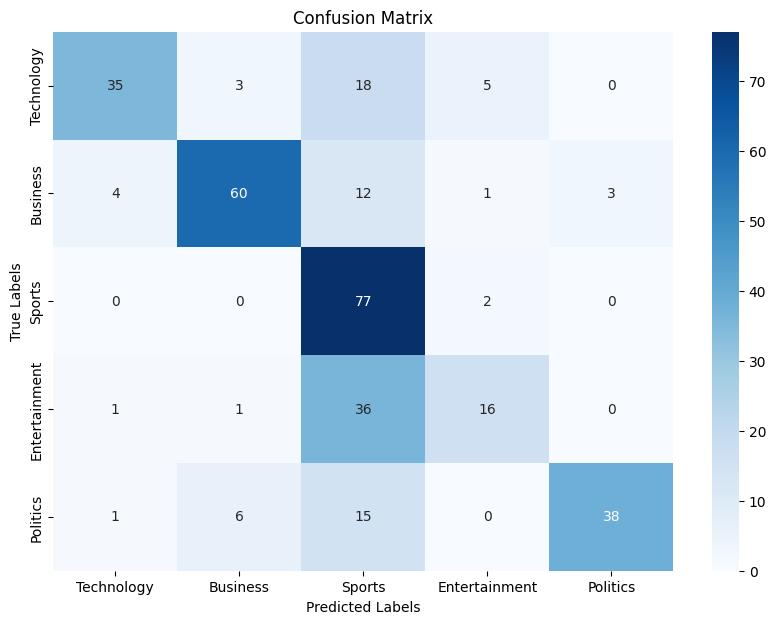

Classification Report:
               precision    recall  f1-score   support

   Technology       0.85      0.57      0.69        61
     Business       0.86      0.75      0.80        80
       Sports       0.49      0.97      0.65        79
Entertainment       0.67      0.30      0.41        54
     Politics       0.93      0.63      0.75        60

     accuracy                           0.68       334
    macro avg       0.76      0.65      0.66       334
 weighted avg       0.75      0.68      0.67       334

Accuracy: 0.6766467065868264
NDCG score with 1st 2 relevant ranks: 0.7692082572604833
============Fold 4=============
==========================Train metrics================================


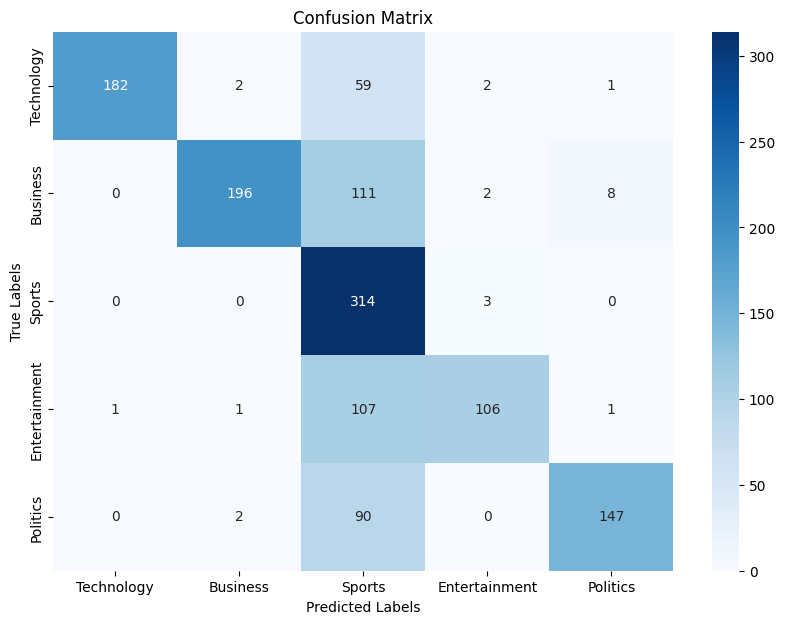

Classification Report:
               precision    recall  f1-score   support

   Technology       0.99      0.74      0.85       246
     Business       0.98      0.62      0.76       317
       Sports       0.46      0.99      0.63       317
Entertainment       0.94      0.49      0.64       216
     Politics       0.94      0.62      0.74       239

     accuracy                           0.71      1335
    macro avg       0.86      0.69      0.72      1335
 weighted avg       0.84      0.71      0.72      1335

Accuracy: 0.7078651685393258
NDCG score with 1st 2 relevant ranks: 0.7683588078330686
==========================Val metrics================================


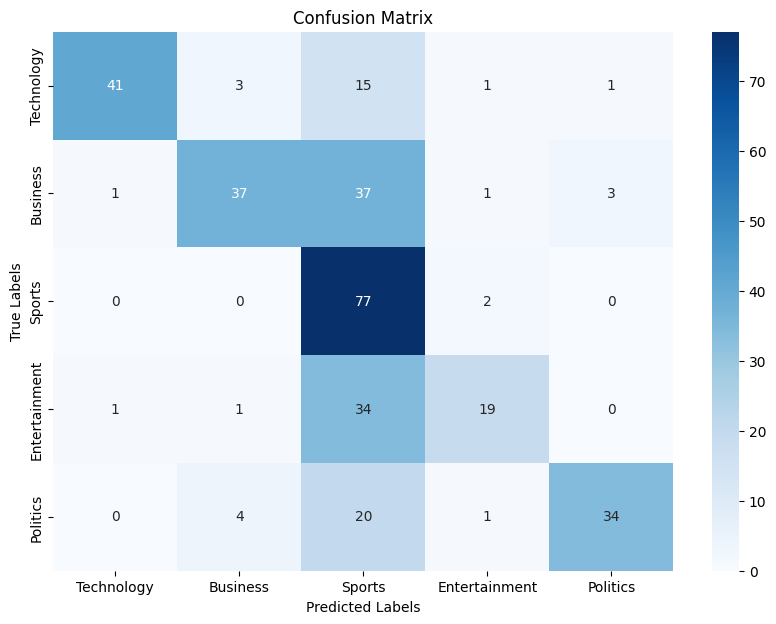

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.67      0.79        61
     Business       0.82      0.47      0.60        79
       Sports       0.42      0.97      0.59        79
Entertainment       0.79      0.35      0.48        55
     Politics       0.89      0.58      0.70        59

     accuracy                           0.62       333
    macro avg       0.78      0.61      0.63       333
 weighted avg       0.76      0.62      0.63       333

Accuracy: 0.6246246246246246
NDCG score with 1st 2 relevant ranks: 0.7098854021342811
============Fold 5=============
==========================Train metrics================================


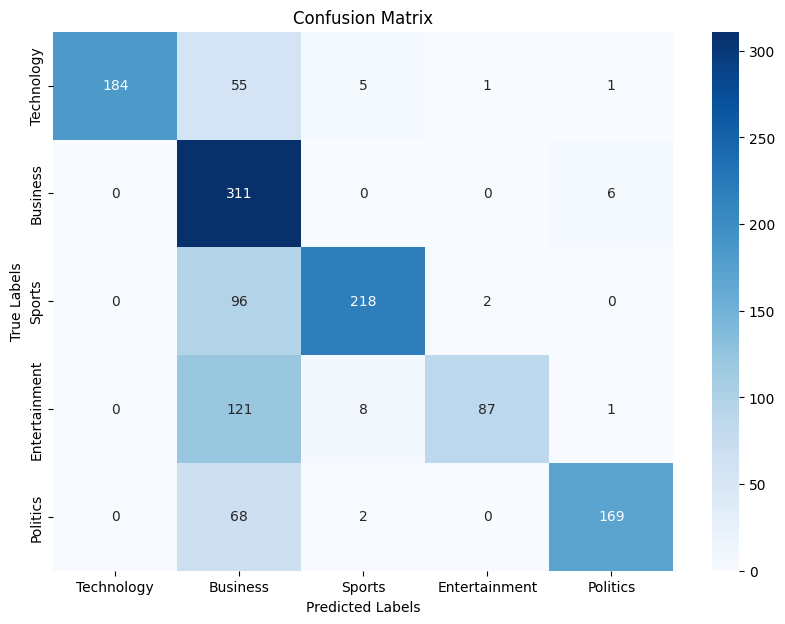

Classification Report:
               precision    recall  f1-score   support

   Technology       1.00      0.75      0.86       246
     Business       0.48      0.98      0.64       317
       Sports       0.94      0.69      0.79       316
Entertainment       0.97      0.40      0.57       217
     Politics       0.95      0.71      0.81       239

     accuracy                           0.73      1335
    macro avg       0.87      0.71      0.73      1335
 weighted avg       0.85      0.73      0.74      1335

Accuracy: 0.7258426966292135
NDCG score with 1st 2 relevant ranks: 0.7905897949357975
==========================Val metrics================================


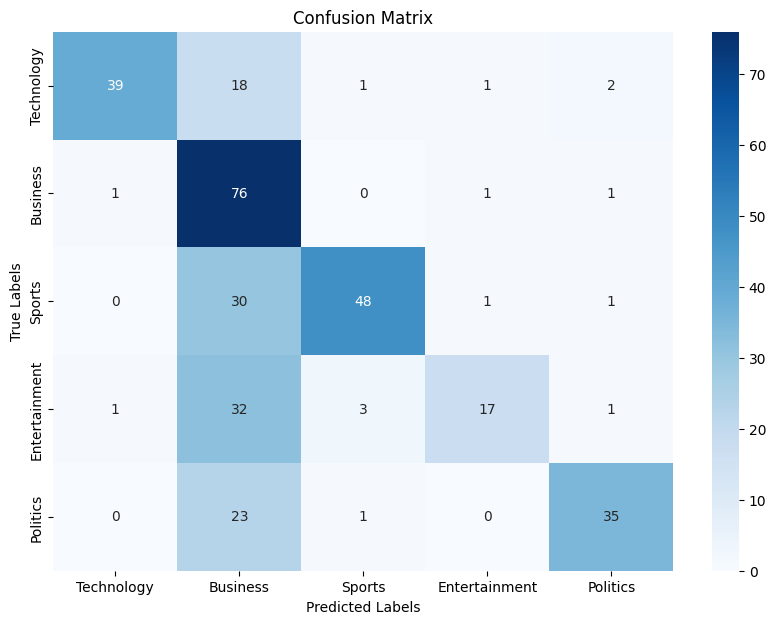

Classification Report:
               precision    recall  f1-score   support

   Technology       0.95      0.64      0.76        61
     Business       0.42      0.96      0.59        79
       Sports       0.91      0.60      0.72        80
Entertainment       0.85      0.31      0.46        54
     Politics       0.88      0.59      0.71        59

     accuracy                           0.65       333
    macro avg       0.80      0.62      0.65       333
 weighted avg       0.79      0.65      0.65       333

Accuracy: 0.6456456456456456
NDCG score with 1st 2 relevant ranks: 0.7228632766623798
==========================End of Folds================================
time taken(mins):  0.07474836905797323
param_dict[best_estimator]:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1.0,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0

In [77]:


param=[
     # Naïve Bayes (No hyperparameters to tune)
    {
        'classifier': [GaussianNB()]
    },

    # K-Nearest Neighbors
    {
        'classifier': [KNeighborsClassifier()],
        'classifier__n_neighbors': [5, 7],  # Number of neighbors
        'classifier__weights': ['uniform', 'distance'],  # Weighting method
        'classifier__metric': ['cosine']  # Distance metric
    },   
    {
    'classifier':[RandomForestClassifier()],
        'classifier__n_estimators':[200],
        'classifier__max_depth':[3,5],
        #'classifier__min_samples_split':[2,5,10],
        #'classifier__min_samples_leaf':[1,2,4],
        'classifier__bootstrap':[True],
        'classifier__oob_score':[True]

    }

    ,
    {
    'classifier':[xgb.XGBClassifier(use_label_encoder=False)],
    'classifier__n_estimators':[200],
    'classifier__learning_rate':[0.1,0.2],
    'classifier__max_depth':[3],
    'classifier__subsample':[0.8],
    'classifier__colsample_bytree':[1.0],
    'classifier__eval_metric':['mlogloss']

    }
    ,

    # Decision Tree
    {
        'classifier': [DecisionTreeClassifier()],
        'classifier__max_depth': [5, 7]
    }

    

    ]

estimator_pkl='best_estimator.pkl'

find_best_model(estimator_pkl,xtrain,ytrain,xtest,ytest,5,True)

#### Test Data Evaluation

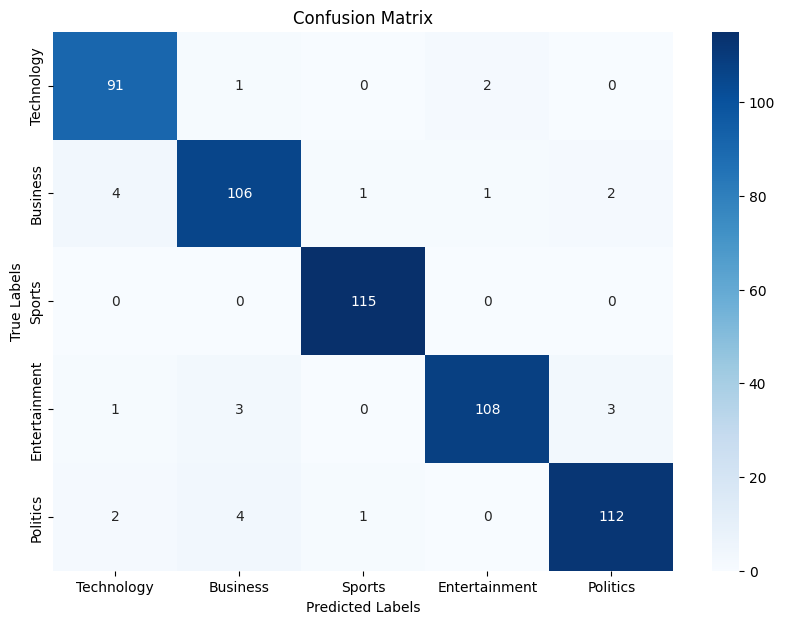

Classification Report:
               precision    recall  f1-score   support

   Technology       0.93      0.97      0.95        94
     Business       0.93      0.93      0.93       114
       Sports       0.98      1.00      0.99       115
Entertainment       0.97      0.94      0.96       115
     Politics       0.96      0.94      0.95       119

     accuracy                           0.96       557
    macro avg       0.95      0.96      0.95       557
 weighted avg       0.96      0.96      0.96       557

Accuracy: 0.9551166965888689
NDCG score with 1st 2 relevant ranks: 0.976638537374969


(0.9551166965888689, 0.976638537374969)

In [78]:
param_dict=pickle.load(open(estimator_pkl,'rb'))
estimator=param_dict['best_estimator']

import joblib
joblib.dump(estimator, "only_model.joblib")

y_pred_probs=pd.DataFrame(estimator.predict_proba(xtest),columns=estimator.classes_)

ytest=pd.get_dummies(ytest).astype(int)

accuracy_checks(ytest,y_pred_probs)

Feature importances:


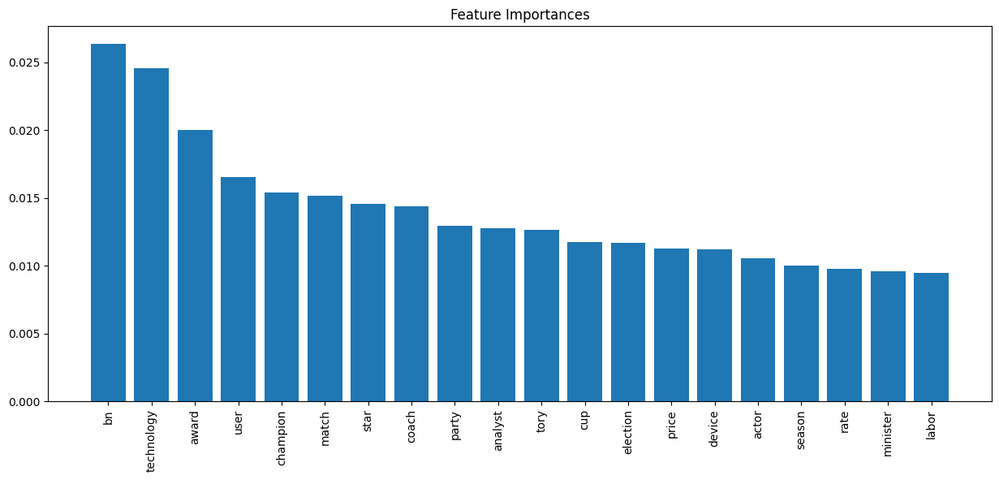

In [79]:
th=20

# Retrieve feature importances or equivalent
if hasattr(estimator, 'feature_importances_'):
    importances = estimator.feature_importances_
    print("Feature importances:")
    #print(importances)
elif hasattr(estimator, 'coef_'):
    importances = estimator.coef_
    print("Model coefficients:")
    print(importances)
else:
    print("The best classifier does not provide feature importances or coefficients.")

# Optional: visualize feature importances if available
if 'importances' in locals():

    feature_names = xtrain.columns if hasattr(xtrain, 'columns') else np.arange(xtrain.shape[1])
    sorted_indices = np.argsort(importances)[::-1][:th]
    plt.figure(figsize=(15, 6))
    plt.bar(range(len(sorted_indices)), importances[sorted_indices], align='center')
    plt.xticks(range(len(sorted_indices)), feature_names[sorted_indices], rotation=90)
    plt.title('Feature Importances')
    plt.show()

### Storing the artifacts

In [80]:

param_dict['numeric_cols']=numeric_cols
param_dict['scalar']=scalar
param_dict['target_encode']=target_encode
param_dict['rev_target_encode']=rev_target_encode

param_dict['vectorizer']=vectorizer
param_dict['param_grid']=None
param_dict['best_estimator']=None
param_dict['xtrain_np']=np.array(xtrain)
param_dict['feature_set']=xtrain.columns.tolist()
param_dict['lime_explainer']=None
param_dict['shap_explainer']=None

pickle.dump(param_dict,open(estimator_pkl,'wb'))

#### Model Interpretability

In [81]:
def feature_revtransform(feature,scaler,numeric_cols,val):
    try:
        feature_index=numeric_cols.index(feature)
        feature_mean = scaler.mean_[feature_index]
        feature_std = scaler.scale_[feature_index]
        val=feature_mean+(val*feature_std)
        return val
    except:
        return val

def extract_values_and_operators(st):
    # Match standalone numbers (including decimals and negatives) and comparison operators
    pattern = r"(?<!\w)-?\d+\.\d+|[<>=]+"
    matches = re.findall(pattern, st)
    # Convert numbers to float where applicable
    result = [float(m) if re.match(r"-?\d+\.\d+", m) else m for m in matches]
    return result

def update_lime_explanation(lime_exp, scaler, numeric_cols):
    """
    Update LIME explanation to use reverse-transformed values.
    """
    updated_explanation = []
    for condition, contrib in lime_exp.as_list():
        feature_name = re.search(r'([a-zA-Z_][a-zA-Z0-9_\.]*)\s*[<>=]', condition).group(1)  # Extract the feature name
        if feature_name in numeric_cols:
            # Extract numeric bounds and reverse-transform them

            bounds = extract_values_and_operators(condition)
            if len(bounds)==2:
                bounds[1]=feature_revtransform(feature_name,scaler,numeric_cols,bounds[1])
                updated_condition=feature_name+' '+str(bounds[0])+' '+str(bounds[1])
                updated_explanation.append((updated_condition, contrib))
            elif len(bounds)==4:
                bounds[0]=feature_revtransform(feature_name,scaler,numeric_cols,bounds[0])
                bounds[3]=feature_revtransform(feature_name,scaler,numeric_cols,bounds[3])
                updated_condition=str(bounds[0])+' '+str(bounds[1])+' '+feature_name+' '+str(bounds[2])+' '+str(bounds[3])
                updated_explanation.append((updated_condition, contrib))
            else:
                updated_explanation.append((condition, contrib))
        else:
            # Non-numeric features remain unchanged
            updated_explanation.append((condition, contrib))
    return updated_explanation

def show_lime_with_original_values(lime_exp, scaler, numeric_cols):

    updated_explanation = update_lime_explanation(lime_exp, scaler, numeric_cols)

    df_explanation = pd.DataFrame(updated_explanation, columns=["Feature Condition", "Contribution"])

    df_explanation["Absolute Contribution"] = df_explanation["Contribution"].abs()
    df_explanation = df_explanation.sort_values(by="Absolute Contribution", ascending=False)

    df_explanation = df_explanation.drop(columns=["Absolute Contribution"])
    display(df_explanation)

---

## **Questionnaire**

### **1. How many news articles are present in the dataset that we have?**  
**📝 Answer:** 2225  

### **2. Most of the news articles are from _____ category.**  
**📝 Answer:** Sports Category  

### **3. Only ___ no. of articles belong to the ‘Technology’ category.**  
**📝 Answer:** 401  

### **4. What are Stop Words and why should they be removed from the text data?**  
**📝 Answer:**  
Stop words are commonly used words in a language (e.g., *"the," "is," "and," "in"*) that do not carry significant meaning and are often removed from text data to **reduce dimensionality and improve model efficiency** in NLP tasks. Removing stop words ensures that the model focuses on important words that contribute to the meaning of the text.

### **5. Explain the difference between Stemming and Lemmatization.**  
**📝 Answer:**  
- **Stemming:** Reduces words to their root form by chopping off suffixes (e.g., *"running"* → *"run"*, *"studies"* → *"studi"*). It may result in non-meaningful words.  
- **Lemmatization:** Converts words to their base or dictionary form (lemma) using vocabulary and morphological analysis (e.g., *"running"* → *"run"*, *"better"* → *"good"*). It produces more meaningful words compared to stemming.

### **6. Which of the techniques Bag of Words or TF-IDF is considered to be more efficient than the other?**  
**📝 Answer:**  
**TF-IDF (Term Frequency - Inverse Document Frequency)** is generally considered more efficient because it **assigns importance to words** based on their occurrence in the dataset, reducing the impact of commonly used words. Unlike **Bag of Words (BoW)**, which only counts word occurrences, **TF-IDF helps distinguish relevant words** for classification.

### **7. What’s the shape of train & test data sets after performing a 75:25 split?**  
**📝 Answer:**  
- **Train Set Shape:** (1668, n_features)  
- **Test Set Shape:** (557, n_features)  
(The actual feature count depends on text vectorization.)

### **8. Which of the following is found to be the best performing model?**  
- **a. Random Forest**   
- **b. Nearest Neighbors**  
- **c. Naive Bayes**  

**📝 Answer:** **KNeighborsClassifier(metric='cosine', n_neighbors=7) with val accuracy=92% and val NDCG(top 2 ranks)=96% work the best out of three. GaussianNB was overfitting while 100% accuracy on train set, it didn't generalize well on validation set (accuracy=85% and NDCG(top 2 ranks)=87%). RandomForestClassifier(max_depth=5, n_estimators=200, oob_score=True) had 90% val accuracy and 93% val NDCG (top 2 ranks)
**  

### **9. According to this particular use case, both precision and recall are equally important. (T/F)**  
**📝 Answer:** **True**  
Since misclassification in news categorization can impact decision-making, balancing **precision** (correct predictions) and **recall** (capturing all relevant articles) is essential for a robust classification system.

---



In [82]:


# Convert xtest to a numpy array (if not already)
xtrain_np = np.array(xtrain)
xtest_np = np.array(xtest[xtrain.columns])

# Initialize the LIME explainer
lime_explainer = LimeTabularExplainer(
    training_data=xtrain_np,  # Training data
    mode='classification',      
    feature_names=xtrain.columns.tolist(),  # Feature names
    verbose=True,            # More detailed explanations
    random_state=42
)

# Explain the first 5 rows in xtest
for i in range(5):
    print(f"LIME Explanation for row {i+1}:")
    lime_exp = lime_explainer.explain_instance(
        data_row=xtest_np[i],  # Row to explain
        predict_fn=estimator.predict_proba  # Prediction function
    )


    #original_feature_values=revtransform_standardize_data(xtest_ML.iloc[[i]],numeric_cols_ML,scalar_ML).iloc[0]
    display(data.loc[[xtest_index_dict[i]]])

    show_lime_with_original_values(lime_exp, scalar, numeric_cols)
    lime_exp.show_in_notebook(show_table=True)

LIME Explanation for row 1:
Intercept -0.14902917607919874
Prediction_local [0.14134972]
Right: 0.0025747756


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
213,Entertainment,douglas set for indian adventure actor michael douglas is to co produce and star in an adventure film about a diamond robbery set in india the new picture is expected to be similar to douglas s action films of the s romancing the stone and the jewel of the nile another hollywood star is being lined up to costar while the rest of the cast will be indian aishwarya rai star of bride and prejudice is the preferred choice of the indian studio involved in the film on a visit to india the year old actor said he hoped to start shooting racing the monsoon next year douglas added that it had been inspired by a wall street journal article about india s angad i as who courier money and diamonds around india the actor s own production company further films is working in partnership with two indian filmmaking concerns to bring the picture to the screen s haile ndra singh the founder of india s perce pt films said there would be a lot of india in the movie and that an indian train would play a big role the train will be a crucial part of the film the chase and most of the stunts will be on the train said mr singh swashbuckling adventure film romancing the stone saw douglas s female costar kathleen turner win a golden globe award for her performance in,"[douglas, set, indian, adventure, actor, michael, douglas, co, produce, star, adventure, diamond, robbery, set, india, picture, expected, similar, douglas, action, romancing, stone, jewel, nile, another, hollywood, star, lined, costar, rest, cast, indian, aishwarya, rai, star, bride, prejudice, preferred, choice, indian, studio, involved, visit, india, old, actor, hoped, start, shooting, racing, monsoon, next, douglas, added, inspired, wall, street, journal, article, india, angad, courier, money, diamond, around, india, actor, production, working, partnership, indian, filmmaking, concern, bring, picture, screen, haile, ndra, singh, founder, india, perce, pt, lot, india, movie, indian, train, play, big, role, train, crucial, part, chase, stunt, train, singh, swashbuckling, adventure, ...]","[douglas, indian adventure actor michael douglas, adventure film, diamond robbery, india, picture, douglas action films, s, stone, jewel, nile, hollywood star, rest, cast, aishwarya rai star, bride, prejudice, choice, studio, film, visit, india, year actor, monsoon, douglas, wall street journal article, india, angad, money, diamonds, india, actor production company, films, partnership, concerns, picture, screen ndra, founder, india s perce, films, lot, india, movie, train, role, train, part, film, chase, stunts, train, mr singh adventure film, stone, douglas costar kathleen turner, globe award, performance]","[douglas -> nsubj, indian adventure actor michael douglas -> pobj, an adventure film -> pobj, a diamond robbery -> pobj, india -> pobj, the new picture -> nsubjpass, douglas s action films -> pobj, the s -> pobj, the stone -> dobj, the jewel -> conj, the nile -> pobj, another hollywood star -> nsubjpass, the rest -> nsubj, the cast -> pobj, indian aishwarya rai star -> nsubj, bride -> pobj, prejudice -> conj, the preferred choice -> attr, the indian studio -> pobj, the film -> pobj, a visit -> pobj, india -> pobj, the year old actor -> nsubj, he -> nsubj, the monsoon -> dobj, douglas -> nsubj, it -> nsubjpass, a wall street journal article -> pobj, india -> pobj, angad -> ROOT, i -> dobj, who -> nsubj, money -> dobj, diamonds -> conj, india -> pobj, the actor s own production company -> nsubj, further films -> nsubj, partnership -> pobj, two indian filmmaking concerns -> pobj, the picture -> dobj, the screen s haile ndra -> pobj, the founder -> pobj, india s perce -> pobj, films -> pobj, a lot -> attr, india -> pobj, the movie -> pobj, an indian train -> nsubj, a big role -> dobj, the train -> nsubj, a crucial part -> attr, the film -> pobj, the chase -> nsubj, the stunts -> pobj, the train -> pobj, mr si

,Feature Condition,Contribution
0,duran <= -2.2795886691922727e-05,0.074413
1,cruise <= -1.0370072502889757e-06,0.065517
2,argonaut <= 8.35784802541302e-05,0.051189
3,arne <= 6.609043204059339e-05,0.029866
4,carnival <= 7.800445781818094e-05,0.022182
5,oracle <= 7.536660726142105e-05,0.019413
6,snapped <= 5.591125404913987e-06,0.014945
7,mpaa <= -6.11691607012852e-06,0.009473
8,cartridge <= -1.3397213710825357e-05,0.007300
9,skype <= 4.3417522822923106e-05,-0.003919


LIME Explanation for row 2:
Intercept 0.3323083804302166
Prediction_local [0.14020011]
Right: 0.0010873755


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
1875,Entertainment,oscars race enters final furlong the race for the oscars entered its final stages as the deadline for voters to choose their winners passed the academy voters had until tuesday afternoon to return their ballots any late submissions will not be included in the count the next five days will be spent counting the voting forms and preparing the winners envelopes best actor nominee leonardo dicaprio is to present a statuette for the first time at the la ceremony on sunday the year old actor who is nominated for playing howard hughes in the aviator will join other hopefuls such as costar cate blanchett natalie portman and kate winslet as oscar presenters the only people who will know the oscar winners before they are revealed at the ceremony will be the auditors who are in charge of looking after the ballot count after collating the results they are responsible for sealing the results in the famous golden envelopes which will be revealed by a host of celebrity presenters at the ceremony former academy award winners gwynedd paltrow dustin hoffman and halle berry will also present prizes the event at the kodak theatre will be attended by people including some of the best known names in film and organisers say they expect it will be watched on television by one billion people around the world one current concern is the torrential rain which has lashed lot angeles for the past week flooding suburbs and causing mudslides it is hoped the forecast for sunday for cool weather but no rain will prove accurate the last time it rained on oscars night was in the mid to late s said oscars communications director john pav li k we have had rain up until the day before the show many times but for some reason the oscar gods always shine on sunday and we hope they will do so again this year he added,"[oscar, race, enters, final, furlong, race, oscar, entered, final, stage, deadline, voter, choose, winner, passed, academy, voter, tuesday, afternoon, return, ballot, late, submission, included, count, next, five, day, spent, counting, voting, form, preparing, winner, envelope, best, actor, nominee, leonardo, dicaprio, present, statuette, la, ceremony, sunday, old, actor, nominated, playing, howard, hughes, aviator, join, hopeful, costar, cate, blanchett, natalie, portman, kate, winslet, oscar, presenter, know, oscar, winner, revealed, ceremony, auditor, charge, looking, ballot, count, collating, result, responsible, sealing, result, famous, golden, envelope, revealed, host, celebrity, presenter, ceremony, former, academy, award, winner, gwynedd, paltrow, dustin, hoffman, halle, berry, present, prize, event, kodak, ...]","[oscars race, race, oscars, stages, deadline, voters, winners, academy voters, tuesday afternoon, ballots, submissions, count, days, voting forms, winners, actor nominee leonardo dicaprio, statuette, time, la ceremony, sunday, year actor, howard hughes, aviator, hopefuls, costar cate blanchett natalie portman, kate winslet, people, oscar winners, ceremony, auditors, charge, ballot count, results, results, envelopes, host, celebrity presenters, ceremony, academy award winners gwynedd paltrow dustin hoffman, halle berry, event, kodak theatre, people, names, film, organisers, television, people, world, concern, rain, lot angeles, week, suburbs, mudslides, forecast, sunday, weather, rain, oscars night, mid, oscars communications director john pav li k, rain, day, show, reason, oscar gods, sunday]","[oscars race -> nsubj, the race -> nsubj, the oscars -> pobj, its final stages -> dobj, the deadline -> nsubj, voters -> nsubj, their winners -> dobj, the academy voters -> nsubj, tuesday afternoon -> pobj, their ballots -> dobj, any late submissions -> nsubjpass, the count -> pobj, the next five days -> nsubjpass, the voting forms -> dobj, the winners -> dobj, best actor nominee leonardo dicaprio -> nsubj, a statuette -> dobj, the first time -> po

,Feature Condition,Contribution
0,eff <= -2.182576794039601e-06,-0.173470
1,nestle <= 8.907173403090732e-05,-0.134993
2,confess <= -1.8799607134844794e-05,0.101323
3,mcclaren <= 5.377451123011567e-05,-0.077403
4,leary <= -0.00010379975719268227,0.052293
5,begg <= 8.785487508179474e-06,0.048382
6,icahn <= 1.9411426371255245e-05,0.031167
7,tarantino <= -4.7380866754724495e-05,-0.020721
8,jazz <= 3.578413783704611e-05,-0.018042
9,oracle <= 7.536660726142105e-05,-0.000644


LIME Explanation for row 3:
Intercept -0.07318966174271438
Prediction_local [0.13953277]
Right: 0.020352192


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
1414,Entertainment,doves soar to up album summit manchester rock band doves have entered the up album chart at number one with their new release some cities the trio replace flamboyant us act scissor sisters at the top the album follows single black and white town which reached number six rb star nelly has the new number one single with over and over which sees him team up with tim craw girls aloud akon and kaiser chiefs all have new singles in the top ten as do futureheads and usher the latest elvis presley re release marie s the name his latest flame entered the chart at number three one place ahead of girls aloud s wake me up hiphop performer akon s locked up is at number five while hotly tipped leeds band kaiser chiefs have their second chart hit at number six with oh my god futureheads cover of kate bush s hounds of love entered the chart at number eight while usher s caught up was a new entry at number nine in the album chart operatic quartet il div o s eponymous debut rose places to number six while crooner tony christie s definitive collection is a new entry at number making it the highest charting album of the singer s career,"[dove, soar, album, summit, manchester, rock, band, dove, entered, album, chart, number, release, city, trio, replace, flamboyant, act, scissor, sister, top, album, follows, single, black, white, town, reached, number, six, rb, star, nelly, number, single, see, team, tim, craw, girl, aloud, akon, kaiser, chief, single, top, ten, futureheads, usher, latest, elvis, presley, release, marie, name, latest, flame, entered, chart, number, three, place, ahead, girl, aloud, wake, hiphop, performer, akon, locked, number, five, hotly, tipped, leeds, band, kaiser, chief, second, chart, hit, number, six, oh, god, futureheads, cover, kate, bush, hound, love, entered, chart, number, eight, usher, caught, entry, number, nine, ...]","[doves, summit, manchester rock band doves, album chart, number, release, cities, trio, us act scissor sisters, top, album, town, number rb star, number, tim craw girls, aloud akon, kaiser chiefs, singles, ten, futureheads, elvis presley, re, release marie, name, flame, chart, number place, girls, hiphop performer akon, number, leeds band kaiser chiefs, chart, number, god, cover, kate bush hounds, love, chart, number, entry, number, chart quartet, il div o s debut, places, crooner, tony christie collection, entry, number, singer career]","[doves -> nsubj, album summit -> dobj, manchester rock band doves -> nsubj, the up album chart -> dobj, number -> pobj, their new release -> pobj, some cities -> appos, the trio -> nsubj, flamboyant us act scissor sisters -> dobj, the top -> pobj, the album -> nsubj, single black and white town -> nsubj, number six rb star -> dobj, the new number -> nsubj, him -> nsubj, tim craw girls -> pobj, aloud akon -> nsubj, kaiser chiefs -> conj, new singles -> dobj, the top ten -> pobj, futureheads -> dobj, the latest elvis presley -> dobj, re -> ROOT, release marie -> nsubj, the name -> attr, his latest flame -> nsubj, the chart -> dobj, number three one place -> pobj, girls -> pobj, me -> dobj, hiphop performer akon -> nsubj, number -> pobj, hotly tipped leeds band kaiser chiefs -> nsubj, their second chart -> nsubj, number -> pobj, god -> nsubj, cover -> nsubj, kate bush s hounds -> pobj, love -> pobj, the chart -> dobj, number -> pobj, a new entry -> attr, number -> pobj, chart operatic quartet -> appos, il div o s eponymous debut -> nsubj, places -> dobj, crooner -> pobj, tony christie s definitive collection -> nsubj, a new entry -> attr, number -> pobj, it -> nsubj, the singer s career -> pobj]","[album summit doves, album summit doves, manchester rock band doves the up album chart, manchester rock band doves the up album chart, number, their new release, some cities, flamboyant us act scissor sisters the trio, flamboyant us act scissor sisters the trio, the top, the al

,Feature Condition,Contribution
0,cab <= -3.3377049942342216e-05,0.087966
1,nestle <= 8.907173403090732e-05,0.072807
2,firefox <= 8.03199650150732e-05,0.060465
3,huddle <= 7.369066679867634e-05,0.037887
4,relative <= -7.794613976764599e-06,-0.031895
5,cea <= 3.317494676772858e-05,0.019660
6,arabian <= 7.638375615480432e-05,-0.018357
7,gc <= -6.467571292203319e-05,0.017501
8,rev <= 1.0902932905861528e-05,-0.017328
9,ab <= -5.748880867960084e-05,-0.015983


LIME Explanation for row 4:
Intercept 0.0839940453607067
Prediction_local [0.13850019]
Right: 0.0010590547


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
438,Sports,s a return to mauritius top seeds south africa return to the scene of one of their most embarrassing failures when they face the seychelles in the cosa fa cup next month last year banana banana were humbled in the first by minnows mauritius who beat them in curepipe coach stuart baxter and his squad will return to curepipe face the seychelles in their first game of the new look regional competition the format of the event has been changed this year after the entry of the seychelles who have taken the number of participants to the teams are now divided into three group of four and play knockout matches on successive days to determine the group champions mauritius host the first group and their opponents are madagascar the seychelles and south africa banana banana play the seychelles before mauritius take on madagascar in a doubleheader on february the two winners return to the new george v stadium the next day and the victor of the group decider advances to august s final mini tournament the second group will be hosted in namibia in april it comprises zimbabwe botswana mozambique and the hosts in june former champions zambia will host lesotho malawi and swaziland in the third group in lusaka the three group winners will then join title holders angola for the last of the mini tournaments in august where the winners will be crowned seychelles v south africa mauritius v madagascar winners meet in final match mozambique v zimbabwe namibia v botswana winners meet in final match lesotho v malawi zambia v swaziland winners meet in final match,"[return, mauritius, top, seed, south, africa, return, scene, embarrassing, failure, face, seychelles, cosa, fa, cup, next, month, banana, banana, humbled, minnow, mauritius, beat, curepipe, coach, stuart, baxter, squad, return, curepipe, face, seychelles, look, regional, competition, format, event, changed, entry, seychelles, taken, number, participant, team, divided, three, group, four, play, knockout, match, successive, day, determine, group, champion, mauritius, host, group, opponent, madagascar, seychelles, south, africa, banana, banana, play, seychelles, mauritius, take, madagascar, doubleheader, february, winner, return, george, v, stadium, next, day, victor, group, decider, advance, august, final, mini, tournament, second, group, hosted, namibia, april, comprises, zimbabwe, botswana, mozambique, host, june, former, ...]","[return, seeds south africa return, scene, failures, seychelles, cosa fa cup, banana banana, minnows mauritius, curepipe coach stuart baxter, squad, face, seychelles, game, look competition, format, event, entry, seychelles, number, participants, teams, group, knockout matches, days, group, opponents, seychelles, south africa banana banana, seychelles, mauritius, madagascar, doubleheader, february, winners, george v stadium, victor, group decider, august mini tournament, group, namibia, april, zimbabwe botswana mozambique, hosts, june, champions zambia, lesotho malawi, swaziland, group, lusaka, group winners, title holders, angola, tournaments, august, winners, seychelles, south africa mauritius v madagascar winners, match mozambique, zimbabwe namibia v botswana winners, match lesotho, malawi zambia, swaziland winners, match]","[a return -> attr, top seeds south africa return -> dobj, the scene -> pobj, their most embarrassing failures -> pobj, they -> nsubj, the seychelles -> dobj, the cosa fa cup -> pobj, banana banana -> nsubjpass, minnows mauritius -> pobj, who -> nsubj, them -> dobj, curepipe coach stuart baxter -> pobj, his squad -> nsubj, face -> dobj, the seychelles -> dobj, their first game -> pobj, the new look regional competition -> pobj, the format -> nsubjpass, the event -> pobj, the entry -> pobj, the seychelles -> pobj, who -> nsubj, the number -> dobj, participants -> pobj, the teams -> pobj, three group -> pobj, knockout matches -> dobj, successive days -> pobj,

,Feature Condition,Contribution
0,tb <= 3.183360564380582e-05,-0.118557
1,packet <= 6.82313284763739e-06,0.083120
2,dortmund <= 7.65048746464562e-05,0.054796
3,faroe <= 1.9285263478050754e-06,0.030968
4,begg <= 8.785487508179474e-06,0.025762
5,skype <= 4.3417522822923106e-05,0.023041
6,cocoa <= 8.599812696854473e-05,-0.020251
7,counterfeit <= -1.1278498218408894e-05,-0.012009
8,pin <= 2.8949500696623712e-05,-0.007555
9,oracle <= 7.536660726142105e-05,-0.004810


LIME Explanation for row 5:
Intercept -0.011545307430411045
Prediction_local [0.13653868]
Right: 0.00360068


,Category,Article,tokens,noun_phrases,noun_phrase_dependency,noun_phrase_siblings
1145,Sports,har in or do guy suffers france axe number eight iman ol har in or do guy has been dropped from france s squad for the six nations match with ireland in dublin on march har in or do guy was a second half replacement in last saturday s defeat to wales bourg o in lock pascal pape who has recovered from a sprained ankle returns to the man squad wing cedric heyman s and ludic val bon come in for aurel ien rouge rie and jean philippe grand claude rouge rie hurt his chest against wales while grand claude was a second half replacement against both england and wales val bon capped in last june s tests against the united states and canada was a second half replacement in the win over scotland france coach bernard lahore said har in or do guy had been axed after a poor display last weekend iman ol has been dropped from the squad because the least i can say is that he did t make a thundering comeback against wales said lahore we know the ireland game will be fast and rough and we also want to be able to replace both locks during the game if needed and gregory lamb one y can also come on at number seven or eight the grand slam is gone but we all go to ireland to win it will be a very exciting game because ireland have three wins under their belt have just defeated england and have their eyes set on a grand slam france who lost to wales last week must defeat the irish to keep alive their hopes of retaining the six nations trophy ireland are unbeaten in this year s tournament and have their sights set on a first grand slam since dimitri ya ch vili biarritz pierre mig non i clement yann de law gue castres frederic michael ak state toul o usa in damien trail le biarritz can nick j a uzi on state toul o usa in ludic val bon biarritz christophe dominici state francis cedric heyman s state toul o usa in julien lahar r ague b rive sylvain marc on net state francis nicolas mas perpignan olivier mil loud bourg o in sebastien bruno sale eng william serva t state toul o usa in fabi en pe lou s state toul o usa in capt jerome th ion biarritz pascal pap bourg o in gregory lamb one y state toul o usa in serge be then biarritz julien bonn aire bourg o in can nick n yanga b ziers,"[har, guy, suffers, france, axe, number, eight, iman, ol, har, guy, dropped, france, squad, six, nation, match, ireland, dublin, march, har, guy, second, half, replacement, saturday, defeat, wale, bourg, lock, pascal, pape, recovered, sprained, ankle, return, man, squad, wing, cedric, heyman, ludic, val, bon, come, aurel, ien, rouge, rie, jean, philippe, grand, claude, rouge, rie, hurt, chest, wale, grand, claude, second, half, replacement, england, wale, val, bon, capped, june, test, united, state, canada, second, half, replacement, win, scotland, france, coach, bernard, lahore, har, guy, axed, poor, display, weekend, iman, ol, dropped, squad, least, thundering, comeback, wale, lahore, know, ireland, fast, ...]","[guy, france, axe number iman ol har, guy, france s squad, ireland, dublin, march har, guy, replacement, saturday, defeat, wales bourg o, pape, ankle returns, man squad wing cedric heyman, aurel ien rouge rie, jean philippe grand claude rouge rie, chest, wales, claude, replacement, england, wales val bon, june, tests, united states, canada, replacement, win, scotland france coach bernard lahore, guy, display, iman ol, squad, t, thundering comeback, wales, ireland game, locks, game, y, number, slam, ireland, game, ireland, wins, belt, england, eyes, slam france, wales, irish, hopes, nations, trophy ireland, year tournament, sights, slam, dimitri ya ch vili biarritz, mig, yann law gue, michael ak state toul usa, damien trail le biarritz, j, uzi, state toul usa, val biarritz, christophe state francis cedric heyman s state toul usa, julien, lahar r ague b sylvain marc, state francis nicolas mas perpignan olivier mil loud bourg, o, sebastien bruno sale eng william serva t state tou

,Feature Condition,Contribution
0,quiet <= 1.5496329174604826e-05,-0.097524
1,arabian <= 7.638375615480432e-05,0.060216
2,faroe <= 1.9285263478050754e-06,0.049206
3,ab <= -5.748880867960084e-05,0.045066
4,oracle <= 7.536660726142105e-05,0.041202
5,lat <= -6.088131605101678e-05,0.037154
6,commodore <= -6.668285127309258e-05,0.031169
7,llewellyn <= -4.5880016130633004e-05,-0.029994
8,espy <= 7.779723295779655e-05,0.029833
9,abbott <= -2.065994406450541e-05,-0.018243


SHAP Explanation for row 1, predicted class Entertainment:


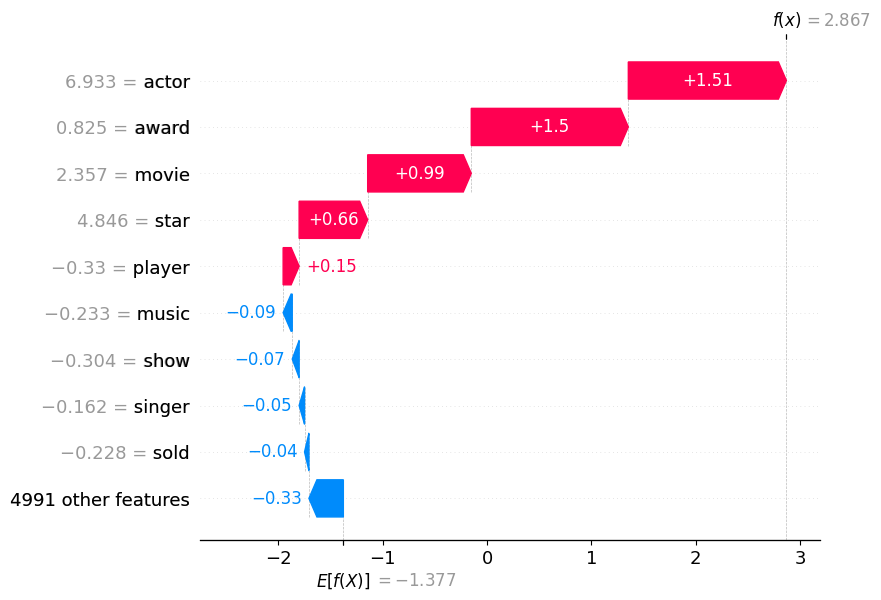

SHAP Explanation for row 2, predicted class Entertainment:


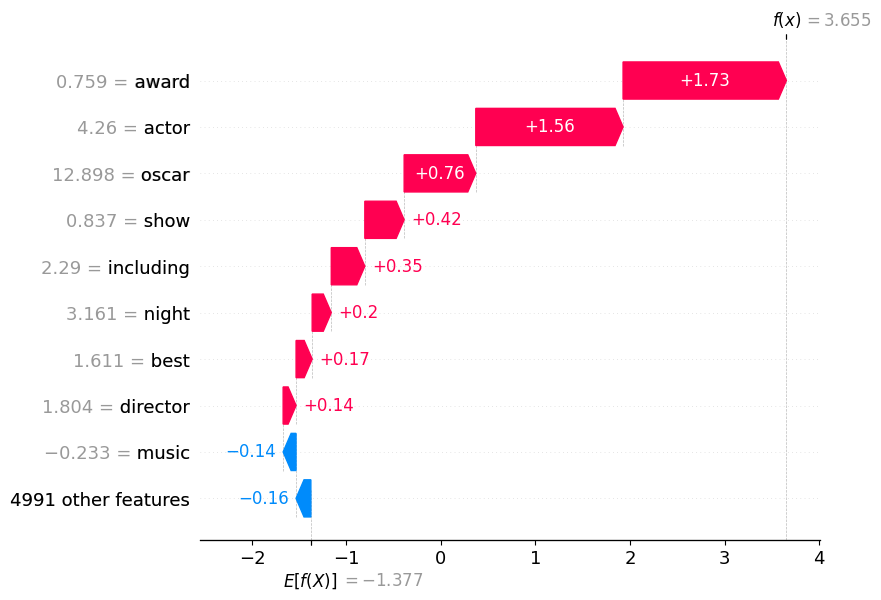

SHAP Explanation for row 3, predicted class Entertainment:


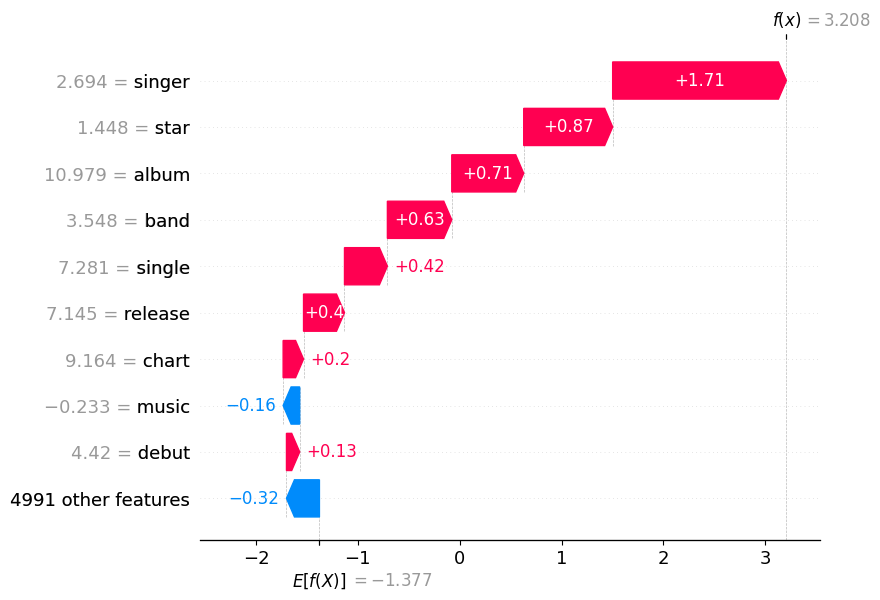

SHAP Explanation for row 4, predicted class Sports:


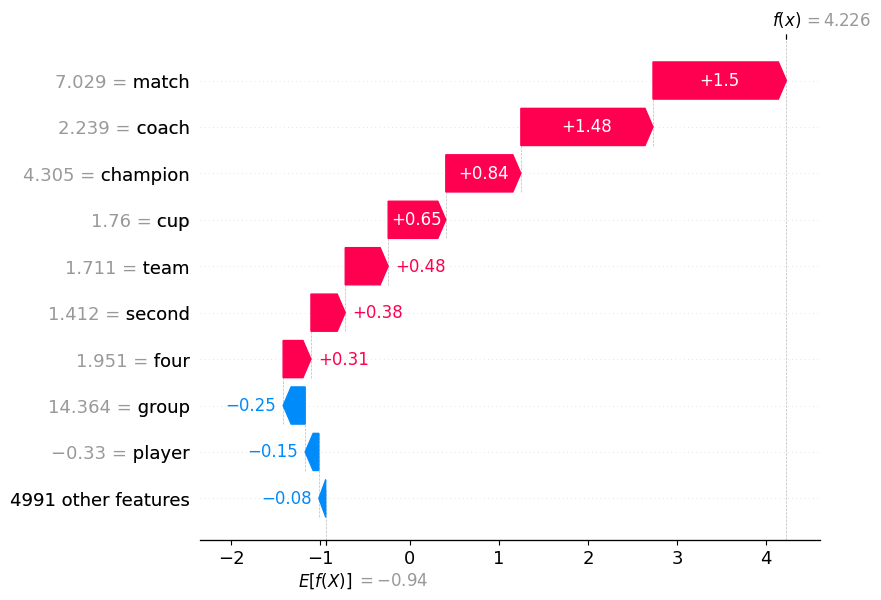

SHAP Explanation for row 5, predicted class Sports:


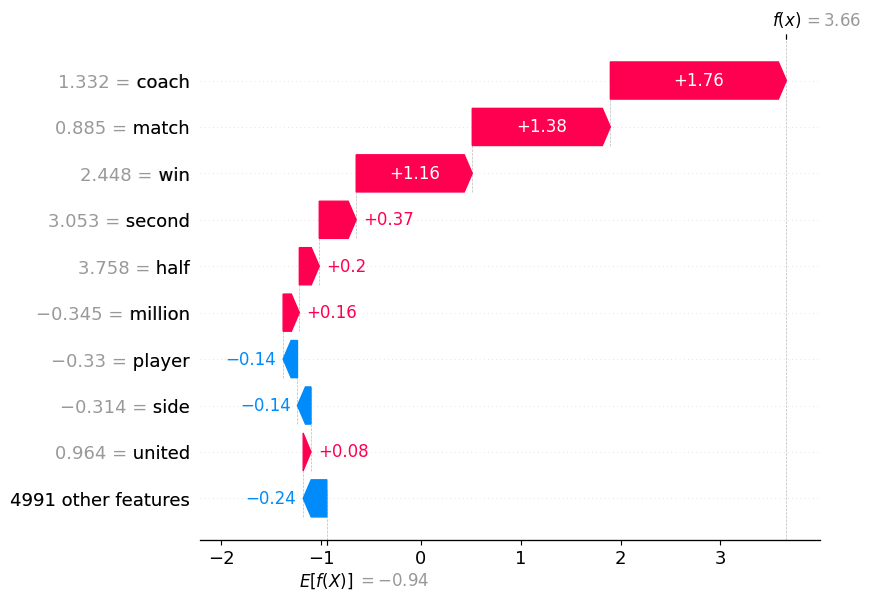

In [83]:


# Initialize SHAP explainer for the XGBoost model
shap_explainer = shap.Explainer(estimator, xtrain)

# Explain the first 5 rows
shap_values = shap_explainer(xtest[xtrain.columns].iloc[:5])  # Explain first 5 rows

xtest_reverse=revtransform_standardize_data(xtest[xtrain.columns].iloc[:5],numeric_cols,scalar)
predicted_classes = np.argmax(estimator.predict_proba(xtest[xtrain.columns].iloc[:5]), axis=1)

# Visualize the SHAP explanations for each row
for i in range(5):
    predicted_class = predicted_classes[i] 
    print(f"SHAP Explanation for row {i+1}, predicted class {rev_target_encode[predicted_class]}:")

    shap.waterfall_plot(shap.Explanation(
        values=shap_values[i, :, predicted_class],  # Use the predicted class
        base_values=shap_values.base_values[i, predicted_class],  # Base value for predicted class
        feature_names=xtrain.columns.tolist(),
        data=xtest_reverse.iloc[i]  # Reverse-transformed values
    ))